In [109]:
import glob
import os
from readfiles import *
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import h5py
from lomapost import * #All functions defined within module lomapost
%matplotlib inline

In [110]:
set_fig_props()

In [111]:
from IPython.display import clear_output
from IPython.display import Image

# Job selection

In [197]:
p_results   = '/share/drive/toni/'          #Define path to folder with all results
#l_folders = os.listdir(p_results) #print available jobs (folders)
#p_folders   = [p_results+ 'Re160s40/case1/h5.stats',p_results+ 'Re160s40/case1/sig00loma3/h5.stats',\
#        p_results+ 'Re160s40/case1/sig07/h5.stats',p_results+ 'Re160s40/case1/sig00loma3y2/h5.stats']
#define option and styles for sta reading

3 6 5


In [120]:
def getaverageintime(p_folders,variable,tmin,tmax,Npoints=200,derivative=False):
    """
    for a given folder path, and variable,computes a interpolated function in time(tmin:tmax)
    and average for all folders given in p_folders.
    """
    njobs = len(p_folders)
    time_int = np.linspace(tmin,tmax,Npoints)
    #faverage = np.zeros(Npoints)
    ftoaverage= np.zeros([njobs,Npoints])
    for ijob in range(njobs):
        path = p_folders[ijob]
        with h5py.File(path,"r") as f:
            time = f['time'];
            fun1 = np.interp(time_int,time,f[variable])
            ftoaverage[ijob,:] = np.array(fun1)
            if derivative==True:
                ftoaverage[ijob,:]=der1(time_int,np.array(fun1))
    
    return time_int,np.mean(ftoaverage,axis=0),np.std(ftoaverage,axis=0)

In [121]:
def fcaseintime(p_folders,lcases,variable,tmin,tmax,Npoints=200,derivative=False):
    """
    using getaveragintime, returns as many vectors as cases wanted to compute.
    Distribution of cases is given in lcases(ex. lcases = [[0,1,2],[3,5]])
    """
    ncases = len(lcases)
    vtcases = [[] for i in range(ncases)]
    vfcases = [[] for i in range(ncases)]
    stddcases = [[] for i in range(ncases)]
    for icase in range(ncases):
        vpcases = []
        for ijob in lcases[icase]:
            vpcases = vpcases + [p_folders[ijob]]
        vtcases[icase],vfcases[icase],stddcases[icase] = getaverageintime(vpcases,variable,tmin,tmax,Npoints,derivative)
    return vtcases,vfcases,stddcases

In [122]:
def getvarmeanintime(path,variable,tmin,tmax,derivative=False):
    """
    for a given folder path, and variable,computes a interpolated function in time(tmin:tmax)
    and average for all folders given in p_folders.
    """
    with h5py.File(path,"r") as f:
            time = np.array(f['time']);
            if derivative==False:
                fun = np.array(f[variable])
            else: #Derivative with time
                fun = der1(time,np.array(f[variable]))
            it1 = where(time>=tmin)[0][0]
            it2 = where(time>=tmax)[0][0]
            mean = np.mean(fun[it1:it2]);
            error = np.std(fun[it1:it2]);
    return mean,error

In [123]:
def pcolorintime(path,variable,tmin,tmax,scaling = 'dm',Npoints=500,derivative=False,y0=0):
    """
    Plot pcolor in time
    """
    lim = 12.0;
    if scaling == 'dw':
        lim=2.0
    
    ydelta = np.linspace(-lim,lim,Npoints)
    funintcum = np.zeros(Npoints);
    nacum = 0
    with h5py.File(path,"r") as f:
        time = np.array(f['time']);
        it1=where(time>=tmin)[0][0]
        it2=where(time>=tmax)[0][0]
        fun = np.array(f[variable]);
        if variable=='rum':
            rhom = np.array(f['rhom'])
            fun = np.divide(fun,rhom)
            #print "computed rum/rhom"
        y = np.array(f['y'])
        delta = np.array(f[scaling])
        fyjob = [np.zeros(Npoints) for i in range(it2-it1)]
        for itime in range(it1,it2):
            dd = delta[itime]
            if derivative == True:
                funint = np.interp(ydelta,(y-y0)/dd,dd*der1(y,fun[:,itime]))
                if itime==it1:
                    print "Taking derivative and multiplying by scaling"
            else:
                if variable=='w3m' or variable[0:2] =='ep':
                    funint = np.interp(ydelta,(y-y0)/dd,dd*fun[:,itime])
                    if itime==it1: #First time
                        print "Multiplying by scaling"
                else:
                    funint = np.interp(ydelta,(y-y0)/dd,fun[:,itime])
            fyjob[itime-it1] = funint
            
    return ydelta,time[it1:it2],fyjob
            

In [124]:
def getSScase2(p_folders,lcases,variable,scaling,SS1,SS2,Npoints=500,derivative=False):
    """
    returns as many vectors as cases wanted to compute.
    Distribution of cases is given in lcases(ex. lcases = [[0,1,2],[3,5]])
    return only one profile per case
    """
    ncases = len(lcases)
    fycases = [[] for i in range(ncases)]
    
    ycases = [[] for i in range(ncases)]
    ferrorcases = [[] for i in range(ncases)]
    for icase in range(ncases):
        vpcases = []
        nacum = 0
        fy = np.zeros(Npoints)
        yf = [[]for i in range(len(lcases[icase]))]
        fy= [[]for i in range(len(lcases[icase]))]
        ferror = [[] for i in range(len(lcases[icase]))]
        for ijob in lcases[icase]:
            vpcases = vpcases + [p_folders[ijob]]
        for path,i in zip(vpcases,range(len(vpcases))):
            ijob = lcases[icase][i]
            yf[i],fy[i],ferror[i] = getSSprofile(path,variable,SS1[ijob],SS2[ijob],scaling,Npoints,derivative)
        ycases[icase]=yf
        fycases[icase]=np.mean(fy,axis=0)
        ferrorcases[icase]=np.max(ferror,axis=0)
    return ycases,fycases,ferrorcases

In [125]:
def getvarmeanintimeV(fun,time,tmin,tmax,derivative=False):
    """
    for a given folder path, and variable,computes a interpolated function in time(tmin:tmax)
    and average for all folders given in p_folders.
    """
    it1 = where(time>=tmin)[0][0]
    it2 = where(time>=tmax)[0][0]
    if derivative==True:
        fun=der1(time,fun)
    mean = np.mean(fun[it1:it2]);
    error = np.std(fun[it1:it2]);
    return mean,error

STATS

# 1D plots (vs time)
l_time_var = ['dm','dw','dmpoint','EPS','rhoEPS','etamin','Relambda']

In [255]:
#Some parameter definitions for plotting:
#----------------------------------------
xlen=plt.rcParams['figure.figsize'][0]
xyratio=0.6
ylen = xyratio*xlen
#PRINT or not??
#PRINT = True
PRINT =True
l_job_color = ['b','g','r','b','g','r','k','k']
l_job_style = ['b','g','r','b--','g--','r--','k','k--']
save_folder='/share/drive/toni/EFMC11/'
#fformat = '.png'
#fformat = '.eps'

# s=4

In [573]:
namecase='s40'
tmin=10; tmax=700;
p_folders_y1   = [p_results+ 'Re160s40/case1/h5.stats',p_results+ 'Re160s40/case2/h5.stats', \
              p_results+ 'Re160s40/case3/h5.stats']
p_folders   = [p_results+ 'Re160s40/case1/y2/h5.stats',p_results+ 'Re160s40/case2/y2/h5.stats', \
              p_results+ 'Re160s40/case3/y2/h5.stats', p_results+ 'Re160s40/case1/y2/sig07/h5.stats', \
               p_results+ 'Re160s40/case2/y2/sig07/h5.stats', p_results+ 'Re160s40/case3/y2/sig07/h5.stats']
lcases_y1 = [[0,1,2]]
lcases = [[0,1,2],[3,4,5]]
njobs_y1=len(p_folders_y1)
njobs = len(p_folders)
trestart=[280,280.0,280.0,350,350,350]

lgroup = [0,0,0,1,1,1]

laverage = [1,1,1,1,1,1,1,1] # Says which to average

l_case_style = ['b','r']
l_case_color =['b','r']

In [574]:
SS1 = [450,520,455,490,510,510]
SS2 = [650,625,650,650,620,670]

# $\delta_m$ vs time

53
53
52
2
2
0
24
23
22
figure saved at: /share/drive/toni/EFMC11/dm_s40.pdf!


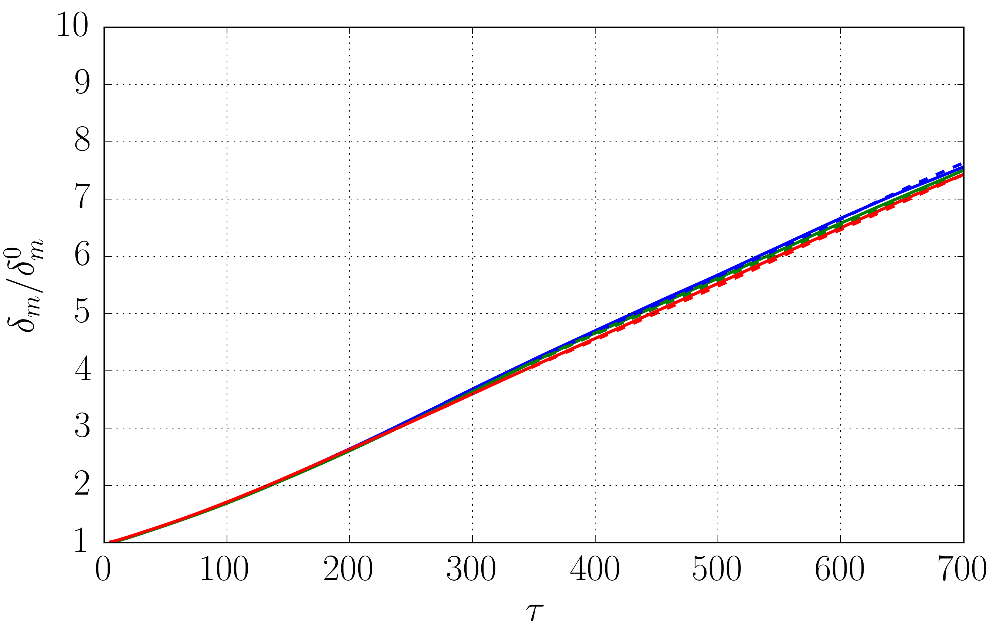

In [575]:
variable = 'dm'
varname='dm'
xlabel=r'$\tau$'
ylabel=r'$\delta_m/\delta_m^0$'
#Preparing plot
fformat = '.pdf'
figname = '%s_%s'%(varname,namecase)
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
#Plot all jobs in the same graph
#time_int = np.linspace(tmin,tmax,Npoints)
for ijob in range(0,njobs_y1):
    path = p_folders_y1[ijob]
    with h5py.File(path,"r") as f:
        DU = np.array(f['um']).max()-np.array(f['um']).min()
        time = np.array(f['time'])
        fun = np.array(f[variable])
        #tmaxjob[ijob] = np.max(time)
        ilim = where(time>trestart[ijob])[0][0]
        print ilim
        #print ilim
        plt.plot(time[0:ilim] ,fun[0:ilim],l_job_style[ijob],lw=2.0,ms=8.0)

for ijob in range(0,njobs):
    path = p_folders[ijob]
    with h5py.File(path,"r") as f:
        DU = np.array(f['um']).max()-np.array(f['um']).min()
        time = np.array(f['time'])
        fun = np.array(f[variable])
        #tmaxjob[ijob] = np.max(time)
        ilim = where(time>trestart[ijob])[0][0]-1
        print ilim
        #print ilim
        plt.plot(time[ilim:-1] ,fun[ilim:-1],l_job_style[ijob],lw=2.0,ms=8.0)
ax.set_xlabel(xlabel)
ax.set_ylabel(ylabel)
#ax.set_ylim([0.0,0.005])
#ax.set_yscale('log')
ax.set_xlim([0,tmax])
plt.grid('on')
#SAVING
if PRINT == True:
    pathname = save_folder + figname + fformat
    print "figure saved at: %s!"%pathname
    fig.savefig(pathname,bbox_inches='tight')


figure saved at: /share/drive/toni/EFMC11/dm_s40_ave.pdf!


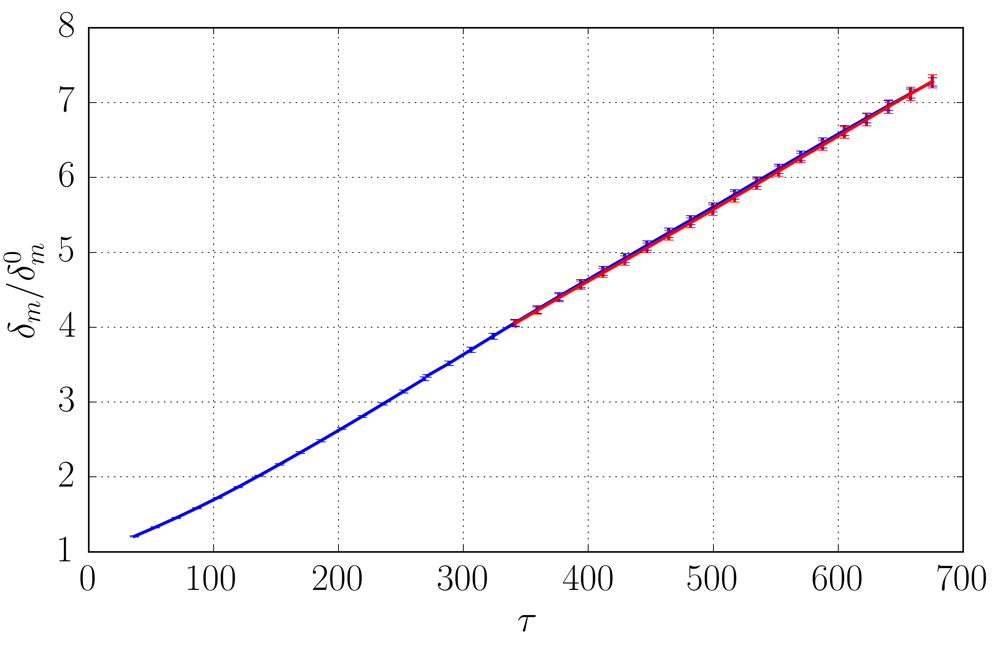

In [576]:
figname = '%s_%s_ave'%(varname,namecase)

ncases = len(lcases)
trestartcase=[trestart[0],trestart[-1]]
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
#ax2 = ax.twinx()
#time_int = np.linspace(tmin,tmax,Npoints)
tmin=0.0
tmax=700
tmin_ave = 20
tmax_ave = 680
vtcases_y1,vfcases_y1,stddcases_y1 = fcaseintime(p_folders_y1,lcases_y1,variable,tmin_ave,tmax_ave)
vtcases,vfcases,stddcases = fcaseintime(p_folders,lcases,variable,tmin,tmax)
#vtcases2,vfcases2,stddcases2 = fcaseintime(p_folders,lcases,variable2,tmin,tmax)
imin=5
NS=5
for icase in range(len(lcases_y1)):
    #print vtcases[icase]
    ilim = where(vtcases_y1[icase]>trestartcase[icase])[0][0]
    #ax.plot(vtcases_y1[icase][0:ilim],vfcases_y1[icase][0:ilim],l_case_style[icase],lw=2.0)
    plt.errorbar(vtcases_y1[icase][imin:ilim:NS],vfcases_y1[icase][imin:ilim:NS], \
                 yerr=stddcases_y1[icase][imin:ilim:NS],color=l_case_color[icase],lw=2.0)
    
    
for icase in range(len(lcases)):
    #print vtcases[icase]
    ilim = where(vtcases[icase]>trestartcase[icase])[0][0]-3
    imax = where(vtcases[icase]>tmax_ave)[0][0]
    #ax.plot(vtcases[icase][ilim:-1],vfcases[icase][ilim:-1],l_case_style[icase],lw=2.0)
    plt.errorbar(vtcases[icase][ilim:imax:NS],vfcases[icase][ilim:imax:NS], \
                 yerr=stddcases[icase][ilim:imax:NS],color=l_case_color[icase],lw=2.0)
    
ax.set_xlabel(xlabel)
ax.set_ylabel(ylabel)
#ax.set_ylim([0,0.01])
ax.set_xlim([tmin,tmax])
#ax.set_ylim([0,0.005])
ax.grid('on')
#SAVING
#SAVING
if PRINT == True:
    pathname = save_folder + figname + fformat
    print "figure saved at: %s!"%pathname
    fig.savefig(pathname,bbox_inches='tight')

# Nice plot

figure saved at: /share/drive/toni/EFMC11/dm_s40_EPS_ave_02.pdf!


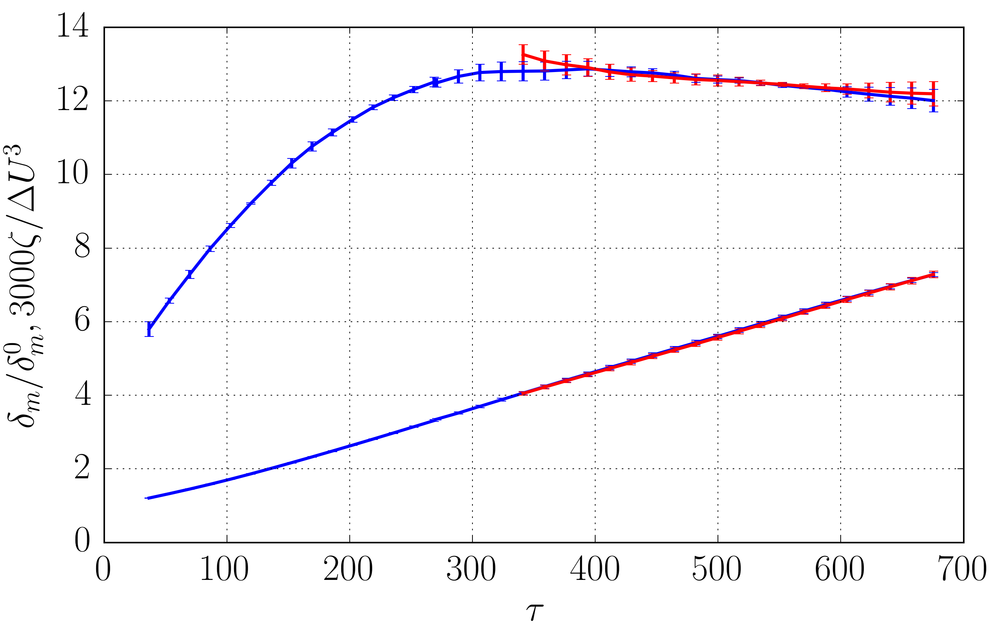

In [593]:

ylabel=r'$\delta_m/\delta_m^0, 3000 \zeta /\Delta U ^3$'
average = True
runs = False
sig00 = False
figname = '%s_%s_EPS_ave_02'%(varname,namecase)

ncases = len(lcases)
trestartcase=[trestart[0],trestart[-1]]
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
#ax2 = ax.twinx()
#time_int = np.linspace(tmin,tmax,Npoints)
tmin=0.0
tmax=700
tmin_ave = 20
tmax_ave = 680


#vtcases2,vfcases2,stddcases2 = fcaseintime(p_folders,lcases,variable2,tmin,tmax)

variable='EPS'
fact=3000     

if runs==True:
    for ijob in range(0,njobs_y1):
        path = p_folders_y1[ijob]
        with h5py.File(path,"r") as f:
            DU = np.array(f['um']).max()-np.array(f['um']).min()
            time = np.array(f['time'])
            fun = fact*np.array(f[variable])
            ilim = where(time>trestart[ijob])[0][0]
            plt.plot(time[0:ilim] ,fun[0:ilim],l_job_style[ijob],lw=2.0,ms=8.0)

    if sig00==True:
        njobs=3;
    else:
         njobs=6;
        
    for ijob in range(0,njobs):
        path = p_folders[ijob]
        with h5py.File(path,"r") as f:
            DU = np.array(f['um']).max()-np.array(f['um']).min()
            time = np.array(f['time'])
            fun = fact*np.array(f[variable])
            ilim = where(time>trestart[ijob])[0][0]-1
            plt.plot(time[ilim:-1] ,fun[ilim:-1],l_job_style[ijob],lw=2.0,ms=8.0)
               

if average==True:
    imin=5
    NS=5
    vtcases_y1,vfcases_y1,stddcases_y1 = fcaseintime(p_folders_y1,lcases_y1,variable,tmin_ave,tmax_ave)
    vtcases,vfcases,stddcases = fcaseintime(p_folders,lcases,variable,tmin,tmax)      
    imin=5
    NS=5
    for icase in range(len(lcases_y1)):
        ilim = where(vtcases_y1[icase]>trestartcase[icase])[0][0]
        plt.errorbar(vtcases_y1[icase][imin:ilim:NS],fact*vfcases_y1[icase][imin:ilim:NS], \
                 yerr=fact*stddcases_y1[icase][imin:ilim:NS],color=l_case_color[icase],lw=2.0)
     
    if sig00==True:
        shift=1
    else:
         shift=0;
    for icase in range(len(lcases)-shift):
        ilim = where(vtcases[icase]>trestartcase[icase])[0][0]-3
        imax = where(vtcases[icase]>tmax_ave)[0][0]
        plt.errorbar(vtcases[icase][ilim:imax:NS],fact*vfcases[icase][ilim:imax:NS], \
                 yerr=fact*stddcases[icase][ilim:imax:NS],color=l_case_color[icase],lw=2.0) 
        
        
variable='dm'
fact=1.0     

if runs==True:
    for ijob in range(0,njobs_y1):
        path = p_folders_y1[ijob]
        with h5py.File(path,"r") as f:
            DU = np.array(f['um']).max()-np.array(f['um']).min()
            time = np.array(f['time'])
            fun = fact*np.array(f[variable])
            ilim = where(time>trestart[ijob])[0][0]
            plt.plot(time[0:ilim] ,fun[0:ilim],l_job_style[ijob],lw=2.0,ms=8.0)

    if sig00==True:
        njobs=3;
    else:
         njobs=6;
        
    for ijob in range(0,njobs):
        path = p_folders[ijob]
        with h5py.File(path,"r") as f:
            DU = np.array(f['um']).max()-np.array(f['um']).min()
            time = np.array(f['time'])
            fun = fact*np.array(f[variable])
            ilim = where(time>trestart[ijob])[0][0]-1
            plt.plot(time[ilim:-1] ,fun[ilim:-1],l_job_style[ijob],lw=2.0,ms=8.0)

               
if average==True:
    imin=5
    NS=5
    vtcases_y1,vfcases_y1,stddcases_y1 = fcaseintime(p_folders_y1,lcases_y1,variable,tmin_ave,tmax_ave)
    vtcases,vfcases,stddcases = fcaseintime(p_folders,lcases,variable,tmin,tmax)      

    for icase in range(len(lcases_y1)):
        ilim = where(vtcases_y1[icase]>trestartcase[icase])[0][0]
        plt.errorbar(vtcases_y1[icase][imin:ilim:NS],fact*vfcases_y1[icase][imin:ilim:NS], \
                 yerr=fact*stddcases_y1[icase][imin:ilim:NS],color=l_case_color[icase],lw=2.0)
    if sig00==True:
        shift=1
    else:
         shift=0;
    for icase in range(len(lcases)-shift):
        ilim = where(vtcases[icase]>trestartcase[icase])[0][0]-3
        imax = where(vtcases[icase]>tmax_ave)[0][0]
        plt.errorbar(vtcases[icase][ilim:imax:NS],fact*vfcases[icase][ilim:imax:NS], \
                 yerr=fact*stddcases[icase][ilim:imax:NS],color=l_case_color[icase],lw=2.0)       
    
    
        
ax.set_xlabel(xlabel)
ax.set_ylabel(ylabel)
#ax.set_ylim([0,0.01])
ax.set_xlim([tmin,tmax])
#ax.set_ylim([0,0.005])
ax.grid('on')
#SAVING
#SAVING
PRINT = True
if PRINT == True:
    pathname = save_folder + figname + fformat
    print "figure saved at: %s!"%pathname
    fig.savefig(pathname,bbox_inches='tight')

# $\zeta$ vs time

53
53
52
2
2
0
24
23
22
figure saved at: /share/drive/toni/EFMC11/espvstime_s40.pdf!


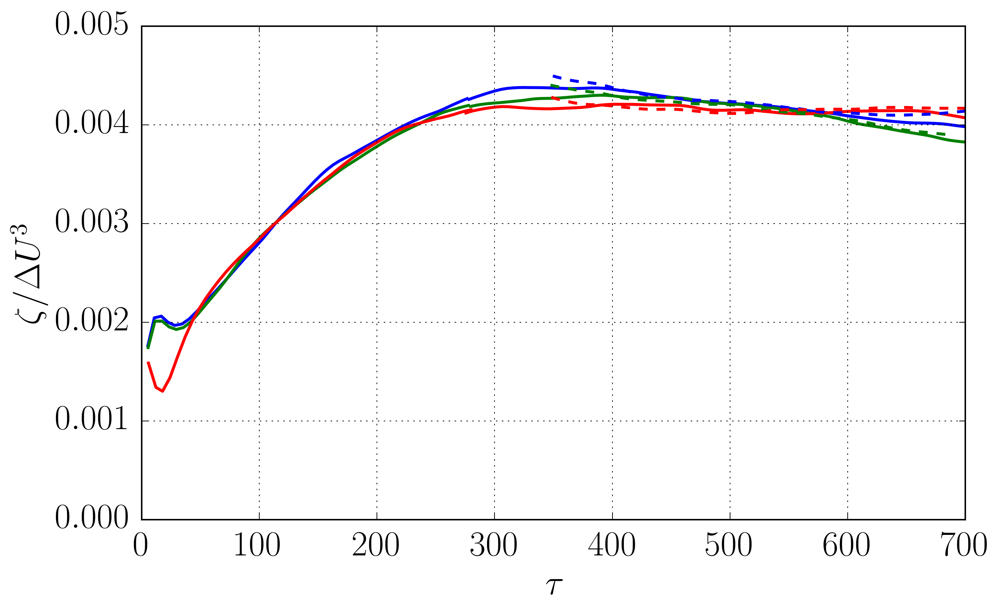

In [294]:
variable = 'EPS'
varname='epsvstime'
xlabel=r'$\tau$'
ylabel=r'$\zeta/\Delta U^3$'
#Preparing plot
fformat = '.pdf'
figname = '%s_%s'%(varname,namecase)
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
#Plot all jobs in the same graph
#time_int = np.linspace(tmin,tmax,Npoints)
for ijob in range(0,njobs_y1):
    path = p_folders_y1[ijob]
    with h5py.File(path,"r") as f:
        DU = np.array(f['um']).max()-np.array(f['um']).min()
        time = np.array(f['time'])
        fun = np.array(f[variable])
        #tmaxjob[ijob] = np.max(time)
        ilim = where(time>trestart[ijob])[0][0]
        print ilim
        #print ilim
        plt.plot(time[0:ilim] ,fun[0:ilim],l_job_style[ijob],lw=2.0,ms=8.0)

for ijob in range(0,njobs):
    path = p_folders[ijob]
    with h5py.File(path,"r") as f:
        DU = np.array(f['um']).max()-np.array(f['um']).min()
        time = np.array(f['time'])
        fun = np.array(f[variable])
        #tmaxjob[ijob] = np.max(time)
        ilim = where(time>trestart[ijob])[0][0]-1
        print ilim
        #print ilim
        plt.plot(time[ilim:-1] ,fun[ilim:-1],l_job_style[ijob],lw=2.0,ms=8.0)
ax.set_xlabel(xlabel)
ax.set_ylabel(ylabel)
ax.set_ylim([0.0,0.005])
#ax.set_yscale('log')
ax.set_xlim([0,tmax])
plt.grid('on')
#SAVING
if PRINT == True:
    pathname = save_folder + figname + fformat
    print "figure saved at: %s!"%pathname
    fig.savefig(pathname,bbox_inches='tight')


figure saved at: /share/drive/toni/EFMC11/espvstime_s40_ave.pdf!


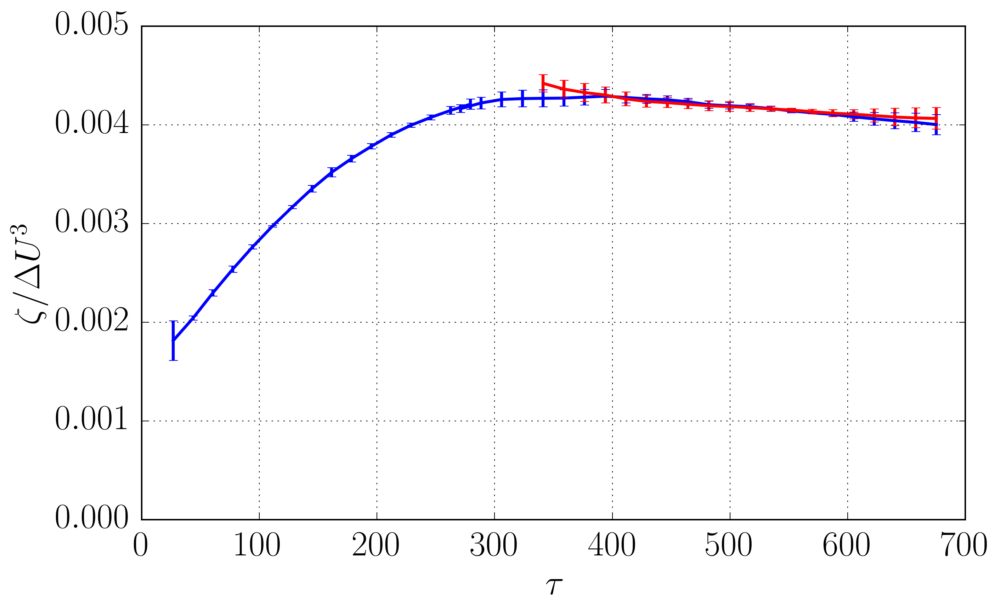

In [295]:
figname = '%s_%s_ave'%(varname,namecase)
ncases = len(lcases)
trestartcase=[trestart[0],trestart[-1]]
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
#ax2 = ax.twinx()
#time_int = np.linspace(tmin,tmax,Npoints)
tmin=0.0
tmax=700
tmin_ave = 10
tmax_ave = 680
vtcases_y1,vfcases_y1,stddcases_y1 = fcaseintime(p_folders_y1,lcases_y1,variable,tmin_ave,tmax_ave)
vtcases,vfcases,stddcases = fcaseintime(p_folders,lcases,variable,tmin,tmax)
#vtcases2,vfcases2,stddcases2 = fcaseintime(p_folders,lcases,variable2,tmin,tmax)
imin=5
NS=5
for icase in range(len(lcases_y1)):
    #print vtcases[icase]
    ilim = where(vtcases_y1[icase]>trestartcase[icase])[0][0]
    #ax.plot(vtcases_y1[icase][0:ilim],vfcases_y1[icase][0:ilim],l_case_style[icase],lw=2.0)
    plt.errorbar(vtcases_y1[icase][imin:ilim:NS],vfcases_y1[icase][imin:ilim:NS], \
                 yerr=stddcases_y1[icase][imin:ilim:NS],color=l_case_color[icase],lw=2.0)
    
    
for icase in range(len(lcases)):
    #print vtcases[icase]
    ilim = where(vtcases[icase]>trestartcase[icase])[0][0]-3
    imax = where(vtcases[icase]>tmax_ave)[0][0]
    #ax.plot(vtcases[icase][ilim:-1],vfcases[icase][ilim:-1],l_case_style[icase],lw=2.0)
    plt.errorbar(vtcases[icase][ilim:imax:NS],vfcases[icase][ilim:imax:NS], \
                 yerr=stddcases[icase][ilim:imax:NS],color=l_case_color[icase],lw=2.0)
    
ax.set_xlabel(xlabel)
ax.set_ylabel(ylabel)
#ax.set_ylim([0,0.01])
ax.set_xlim([tmin,tmax])
ax.set_ylim([0,0.005])
ax.grid('on')
#SAVING
#SAVING
if PRINT == True:
    pathname = save_folder + figname + fformat
    print "figure saved at: %s!"%pathname
    fig.savefig(pathname,bbox_inches='tight')

# $\dot{\delta_m}$ vs time

53
53
52
2
2
0
24
23
22
figure saved at: /share/drive/toni/EFMC11/dmpointvstime_s40.pdf!


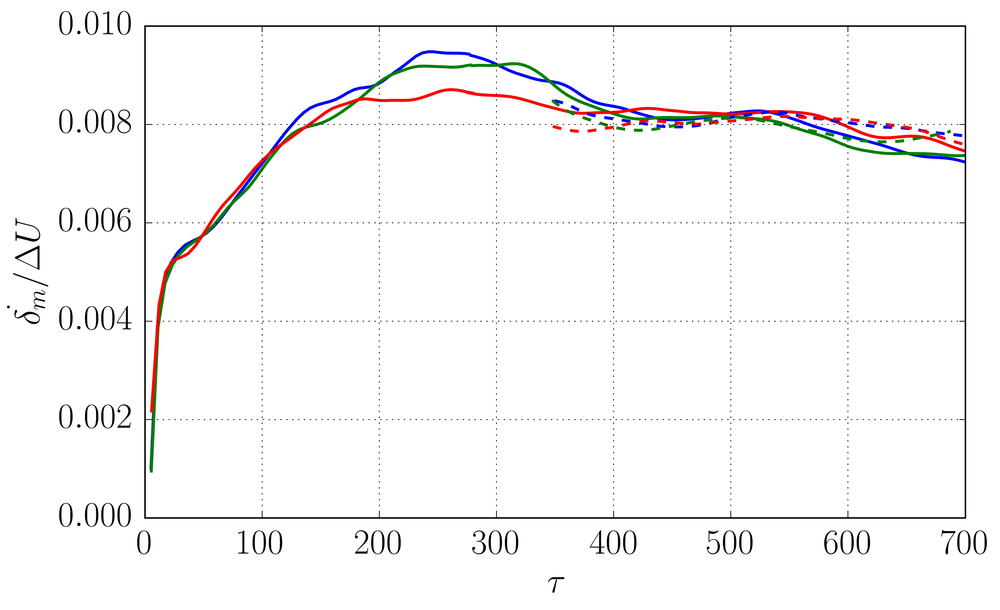

In [312]:
variable = 'dmpoint'
varname='dmpointvstime'
xlabel=r'$\tau$'
ylabel=r'$\dot{\delta_m}/\Delta U$'
#Preparing plot
fformat = '.pdf'
figname = '%s_%s'%(varname,namecase)
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
#Plot all jobs in the same graph
#time_int = np.linspace(tmin,tmax,Npoints)
for ijob in range(0,njobs_y1):
    path = p_folders_y1[ijob]
    with h5py.File(path,"r") as f:
        DU = np.array(f['um']).max()-np.array(f['um']).min()
        time = np.array(f['time'])
        fun = np.array(f[variable])
        #tmaxjob[ijob] = np.max(time)
        ilim = where(time>trestart[ijob])[0][0]
        print ilim
        #print ilim
        plt.plot(time[0:ilim] ,fun[0:ilim],l_job_style[ijob],lw=2.0,ms=8.0)

dmpdens = [[] for i in range(njobs)]
dmptotal = [[] for i in range(njobs)]
dmpturb=[[] for i in range(njobs)]
Cdelta=[[] for i in range(njobs)]
for ijob in range(0,njobs):
    path = p_folders[ijob]
    with h5py.File(path,"r") as f:
        DU = np.array(f['um']).max()-np.array(f['um']).min()
        time = np.array(f['time'])
        fun = np.array(f[variable])
        fun2= der1(time,np.array(f['dm']))
        fun3=0.25*(np.array(f['rvm'])[-1,:]-np.array(f['rvm'])[0,:])
        dmpdens[ijob] = fun3
        dmpturb[ijob]=fun
        dmptotal[ijob]=fun2
        Cdelta[ijob] = 2.0*fun2*f['dw']/f['dm']
        #tmaxjob[ijob] = np.max(time)
        ilim = where(time>trestart[ijob])[0][0]-1
        print ilim
        #print ilim
        plt.plot(time[ilim:-1] ,fun[ilim:-1],l_job_style[ijob],lw=2.0,ms=8.0)
ax.set_xlabel(xlabel)
ax.set_ylabel(ylabel)
#ax.set_ylim([0.0,0.005])
#ax.set_yscale('log')
ax.set_xlim([0,tmax])
plt.grid('on')
#SAVING
if PRINT == True:
    pathname = save_folder + figname + fformat
    print "figure saved at: %s!"%pathname
    fig.savefig(pathname,bbox_inches='tight')


In [310]:
dmpdensAVE = [[] for ijob in range(njobs)]
errordmpdensAVE = [[] for ijob in range(njobs)]
dmpturbAVE = [[] for ijob in range(njobs)]
errordmpturbAVE = [[] for ijob in range(njobs)]
dmp =[[] for ijob in range(njobs)]
errordmp = [[] for ijob in range(njobs)]
for ijob in range(njobs):
    dmpdensAVE[ijob],errordmpdensAVE[ijob] = getvarmeanintimeV(dmpdens[ijob],vtime[ijob],SS1[ijob],SS2[ijob])
    dmpturbAVE[ijob],errordmpturbAVE[ijob] = getvarmeanintimeV(dmpturb[ijob],vtime[ijob],SS1[ijob],SS2[ijob])
    dmp[ijob],errordmp[ijob] = getvarmeanintimeV(dmptotal[ijob],vtime[ijob],SS1[ijob],SS2[ijob])
    
ncases = len(lcases)
dmpcase= [[]for i in range(ncases)]
dmperrorcase = [[]for i in range(ncases)]

print "Turbulent Contribution approximation Vreman"
for icase in range(ncases):
    dmptmp= [[]for i in range(len(lcases[icase]))]
    errordmptmp= [[]for i in range(len(lcases[icase]))]
    for ijob,i in zip(lcases[icase],range(len(lcases[icase]))):
        dmptmp[i] = dmpturbAVE[ijob]
        errordmptmp[i] = errordmpturbAVE[ijob]
    dmpcase[icase]=np.mean(dmptmp,axis=0)
    dmperrorcase[icase]=np.max(errordmptmp,axis=0)
    print "dmpoint = %s, std= %s" %(dmpcase[icase],dmperrorcase[icase])

print "Mass flux contribution"
for icase in range(ncases):
    dmptmp= [[]for i in range(len(lcases[icase]))]
    errordmptmp= [[]for i in range(len(lcases[icase]))]
    for ijob,i in zip(lcases[icase],range(len(lcases[icase]))):
        dmptmp[i] = dmpdensAVE[ijob]
        errordmptmp[i] = errordmpdensAVE[ijob]
    dmpcase[icase]=np.mean(dmptmp,axis=0)
    dmperrorcase[icase]=np.max(errordmptmp,axis=0)
    print "dmpoint = %s, std= %s" %(dmpcase[icase],dmperrorcase[icase])
    
print "Total"
for icase in range(ncases):
    dmptmp= [[]for i in range(len(lcases[icase]))]
    errordmptmp= [[]for i in range(len(lcases[icase]))]
    for ijob,i in zip(lcases[icase],range(len(lcases[icase]))):
        dmptmp[i] = dmp[ijob]
        errordmptmp[i] = errordmp[ijob]
    dmpcase[icase]=np.mean(dmptmp,axis=0)
    dmperrorcase[icase]=np.max(errordmptmp,axis=0)
    print "dmpoint = %s, std= %s" %(dmpcase[icase],dmperrorcase[icase])

Turbulent Contribution approximation Vreman
dmpoint = 0.00794977721914, std= 0.000256757769344
dmpoint = 0.00802403250772, std= 0.000150441513795
Mass flux contribution
dmpoint = 0.00100675962306, std= 8.14760267291e-05
dmpoint = 0.000728740335363, std= 2.62516980886e-05
Total
dmpoint = 0.00963587877488, std= 0.000259657877019
dmpoint = 0.00979486745592, std= 0.0003295241396


# Obtaining $C_{\delta}$

In [313]:
dmp = [[] for ijob in range(njobs)]
errordmp = [[] for ijob in range(njobs)]
for ijob in range(njobs):
    #dmp[ijob],errordmp[ijob] = getvarmeanintimeV(dwpoint[ijob],vtime[ijob],SS1[ijob],SS2[ijob])
    dmp[ijob],errordmp[ijob] = getvarmeanintimeV(Cdelta[ijob],vtime[ijob],SS1[ijob],SS2[ijob])
ncases = len(lcases)
dmpcase= [[]for i in range(ncases)]
dmperrorcase = [[]for i in range(ncases)]

for icase in range(ncases):
    dmptmp= [[]for i in range(len(lcases[icase]))]
    errordmptmp= [[]for i in range(len(lcases[icase]))]
    for ijob,i in zip(lcases[icase],range(len(lcases[icase]))):
        dmptmp[i] = dmp[ijob]
        errordmptmp[i] = errordmp[ijob]
    dmpcase[icase]=np.mean(dmptmp,axis=0)
    dmperrorcase[icase]=np.max(errordmptmp,axis=0)
    print "dmpoint = %s, std= %s" %(dmpcase[icase],dmperrorcase[icase])

dmpoint = 0.117754885274, std= 0.00511620788173
dmpoint = 0.117244657047, std= 0.00386216579893


figure saved at: /share/drive/toni/EFMC11/dmpointvstime_s40_ave.pdf!


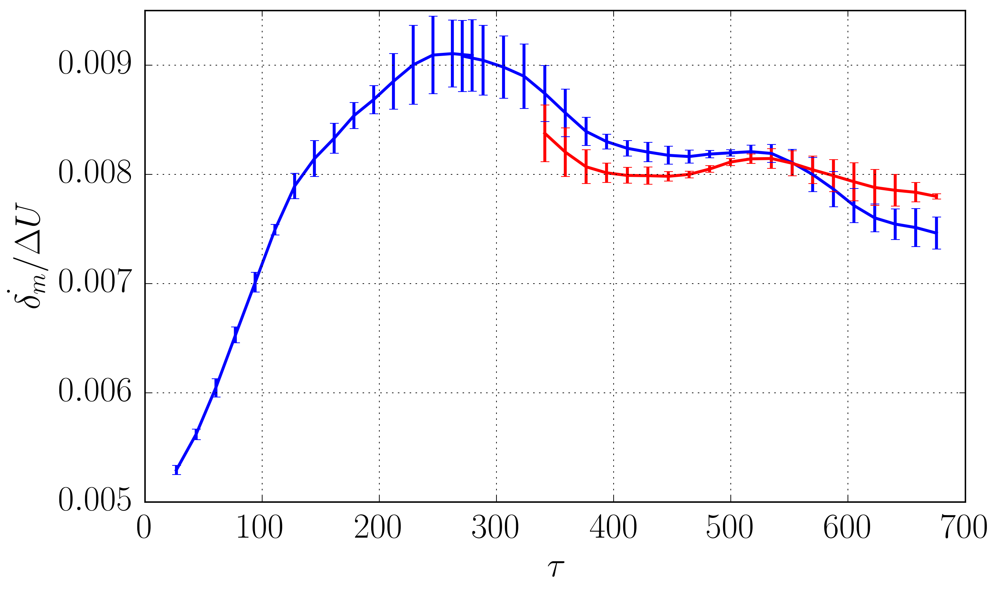

In [311]:
figname = '%s_%s_ave'%(varname,namecase)
ncases = len(lcases)
trestartcase=[trestart[0],trestart[-1]]
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
#ax2 = ax.twinx()
#time_int = np.linspace(tmin,tmax,Npoints)
tmin=0.0
tmax=700
tmin_ave = 10
tmax_ave = 680
vtcases_y1,vfcases_y1,stddcases_y1 = fcaseintime(p_folders_y1,lcases_y1,variable,tmin_ave,tmax_ave)
vtcases,vfcases,stddcases = fcaseintime(p_folders,lcases,variable,tmin,tmax)
#vtcases2,vfcases2,stddcases2 = fcaseintime(p_folders,lcases,variable2,tmin,tmax)
imin=5
NS=5
for icase in range(len(lcases_y1)):
    #print vtcases[icase]
    ilim = where(vtcases_y1[icase]>trestartcase[icase])[0][0]
    #ax.plot(vtcases_y1[icase][0:ilim],vfcases_y1[icase][0:ilim],l_case_style[icase],lw=2.0)
    plt.errorbar(vtcases_y1[icase][imin:ilim:NS],vfcases_y1[icase][imin:ilim:NS], \
                 yerr=stddcases_y1[icase][imin:ilim:NS],color=l_case_color[icase],lw=2.0)
    
    
for icase in range(len(lcases)):
    #print vtcases[icase]
    ilim = where(vtcases[icase]>trestartcase[icase])[0][0]-3
    imax = where(vtcases[icase]>tmax_ave)[0][0]
    #ax.plot(vtcases[icase][ilim:-1],vfcases[icase][ilim:-1],l_case_style[icase],lw=2.0)
    plt.errorbar(vtcases[icase][ilim:imax:NS],vfcases[icase][ilim:imax:NS], \
                 yerr=stddcases[icase][ilim:imax:NS],color=l_case_color[icase],lw=2.0)
    
ax.set_xlabel(xlabel)
ax.set_ylabel(ylabel)
#ax.set_ylim([0,0.01])
ax.set_xlim([tmin,tmax])
#ax.set_ylim([0,0.005])
ax.grid('on')
#SAVING
#SAVING
if PRINT == True:
    pathname = save_folder + figname + fformat
    print "figure saved at: %s!"%pathname
    fig.savefig(pathname,bbox_inches='tight')

# $\eta_{min}$

53
53
52
2
2
0
24
23
22
figure saved at: /share/drive/toni/EFMC11/etamin_s40.pdf!


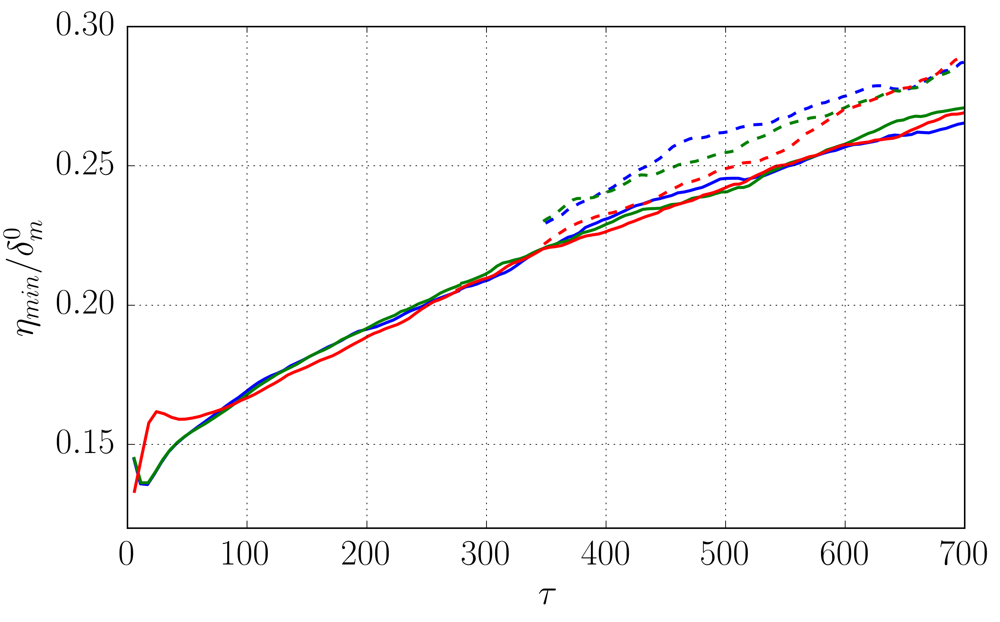

In [301]:
variable = 'etamin'
varname='etamin'
xlabel=r'$\tau$'
ylabel=r'$\eta_{min}/\delta_m^0$'
#Preparing plot
fformat = '.pdf'
figname = '%s_%s'%(varname,namecase)
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
#Plot all jobs in the same graph
#time_int = np.linspace(tmin,tmax,Npoints)
for ijob in range(0,njobs_y1):
    path = p_folders_y1[ijob]
    with h5py.File(path,"r") as f:
        DU = np.array(f['um']).max()-np.array(f['um']).min()
        time = np.array(f['time'])
        fun = np.array(f[variable])
        #tmaxjob[ijob] = np.max(time)
        ilim = where(time>trestart[ijob])[0][0]
        print ilim
        #print ilim
        plt.plot(time[0:ilim] ,fun[0:ilim],l_job_style[ijob],lw=2.0,ms=8.0)

for ijob in range(0,njobs):
    path = p_folders[ijob]
    with h5py.File(path,"r") as f:
        DU = np.array(f['um']).max()-np.array(f['um']).min()
        time = np.array(f['time'])
        fun = np.array(f[variable])
        #tmaxjob[ijob] = np.max(time)
        ilim = where(time>trestart[ijob])[0][0]-1
        print ilim
        #print ilim
        plt.plot(time[ilim:-1] ,fun[ilim:-1],l_job_style[ijob],lw=2.0,ms=8.0)
ax.set_xlabel(xlabel)
ax.set_ylabel(ylabel)
#ax.set_ylim([0.0,0.005])
#ax.set_yscale('log')
ax.set_xlim([0,tmax])
plt.grid('on')
#SAVING
if PRINT == True:
    pathname = save_folder + figname + fformat
    print "figure saved at: %s!"%pathname
    fig.savefig(pathname,bbox_inches='tight')


53
53
52
2
2
0
24
23
22
figure saved at: /share/drive/toni/EFMC11/Relvstime_s40.pdf!


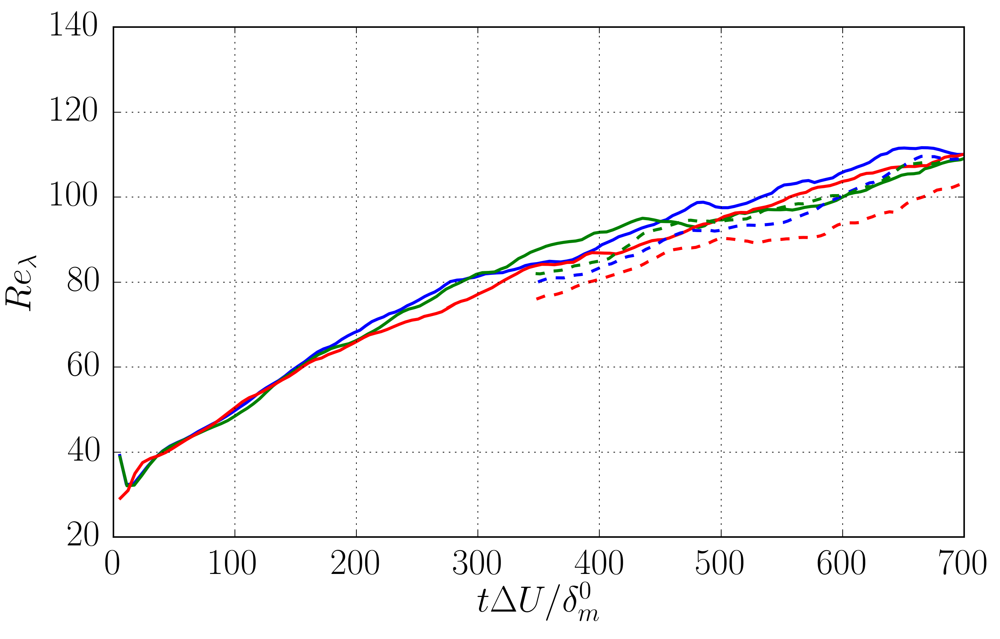

In [303]:
variable = 'Relambda'
xlabel =r'$t \Delta U/\delta_m^0$'
ylabel =r'$Re_{\lambda}$'
varname = 'Relvstime'
#Preparing plot
fformat = '.pdf'
figname = '%s_%s'%(varname,namecase)
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
#Plot all jobs in the same graph
#time_int = np.linspace(tmin,tmax,Npoints)
for ijob in range(0,njobs_y1):
    path = p_folders_y1[ijob]
    with h5py.File(path,"r") as f:
        DU = np.array(f['um']).max()-np.array(f['um']).min()
        time = np.array(f['time'])
        fun = np.array(f[variable])
        #tmaxjob[ijob] = np.max(time)
        ilim = where(time>trestart[ijob])[0][0]
        print ilim
        #print ilim
        plt.plot(time[0:ilim] ,fun[0:ilim],l_job_style[ijob],lw=2.0,ms=8.0)

for ijob in range(0,njobs):
    path = p_folders[ijob]
    with h5py.File(path,"r") as f:
        DU = np.array(f['um']).max()-np.array(f['um']).min()
        time = np.array(f['time'])
        fun = np.array(f[variable])
        #tmaxjob[ijob] = np.max(time)
        ilim = where(time>trestart[ijob])[0][0]-1
        print ilim
        #print ilim
        plt.plot(time[ilim:-1] ,fun[ilim:-1],l_job_style[ijob],lw=2.0,ms=8.0)
ax.set_xlabel(xlabel)
ax.set_ylabel(ylabel)
#ax.set_ylim([0.0,0.005])
#ax.set_yscale('log')
ax.set_xlim([0,tmax])
plt.grid('on')
#SAVING
if PRINT == True:
    pathname = save_folder + figname + fformat
    print "figure saved at: %s!"%pathname
    fig.savefig(pathname,bbox_inches='tight')


# s=8

In [545]:
namecase='s80'
p_folders_y1_s80= [p_results+ 'Re160s80/case1/h5.stats',p_results+ 'Re160s80/case2/h5.stats', \
              p_results+ 'Re160s80/case3/h5.stats']

p_folders_s80=[p_results+ 'Re160s80/case1/y2/h5.stats',p_results+ 'Re160s80/case2/y2/h5.stats', \
               p_results+ 'Re160s80/case3/y2/h5.stats', \
               p_results+ 'Re160s80/case2/y2/sig07/h5.stats',p_results+ 'Re160s80/case3/y2/sig07/h5.stats']
#p_folders   = [p_results+ 'inc_ml_bm/lomacte_scal/h5.stats',p_results+ 'inc_ml_bm/lomacte/h5.stats', \
#               p_results+'inc_ml_bm/loma/h5.stats',p_results+'inc_ml_bm/loma2/h5.stats',\
#               p_results+'inc_ml_bm/nonreactml4/00/h5.stats',p_results+'inc_ml_bm/reactml/h5.stats']

njobs_s80 = len(p_folders_s80)
njobs_y1_s80=len(p_folders_y1_s80)
tmin=10; tmax=700;
lcases_y1_s80 = [[0,1,2]]
lcases_s80 = [[0,1,2],[3,4]]
trestart=[350,350.0,350.0,350,350]
ncases_s80 = 2
lgroup_s80=[0,0,0,1,1];


# $\delta_m$ vs time

74
74
74
4
4
4
7
15
figure saved at: /share/drive/toni/EFMC11/dm_s80.pdf!


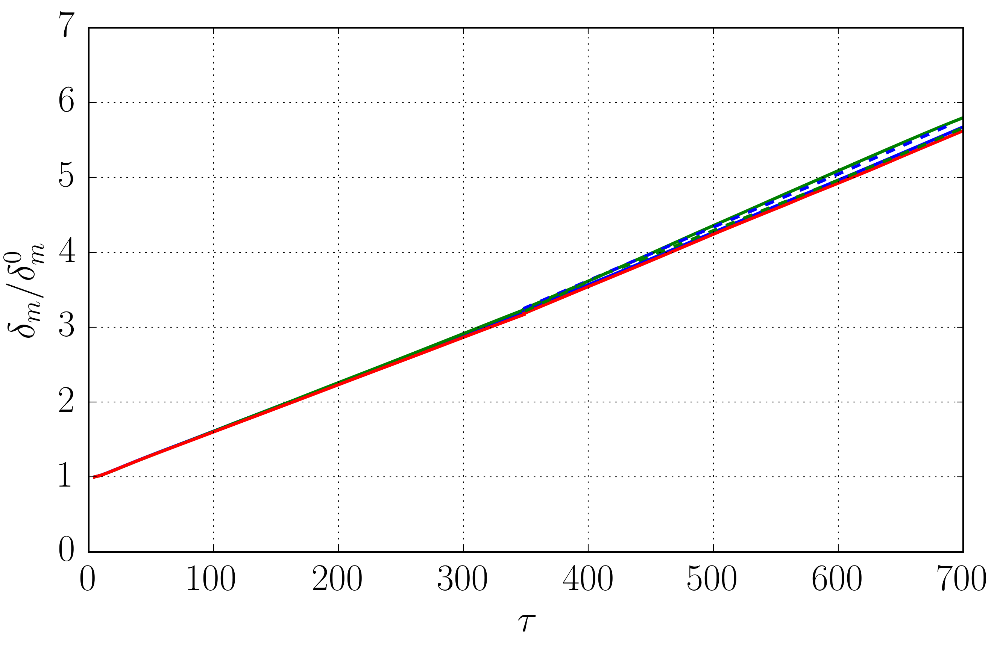

In [522]:
variable = 'dm'
varname='dm'
xlabel=r'$\tau$'
ylabel=r'$\delta_m/\delta_m^0$'
#Preparing plot
fformat = '.pdf'
figname = '%s_%s'%(varname,namecase)
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
#Plot all jobs in the same graph
#time_int = np.linspace(tmin,tmax,Npoints)
for ijob in range(0,njobs_y1_s80):
    path = p_folders_y1_s80[ijob]
    with h5py.File(path,"r") as f:
        DU = np.array(f['um']).max()-np.array(f['um']).min()
        time = np.array(f['time'])
        fun = np.array(f[variable])
        #tmaxjob[ijob] = np.max(time)
        ilim = where(time>trestart[ijob])[0][0]
        print ilim
        #print ilim
        plt.plot(time[0:ilim] ,fun[0:ilim],l_job_style[ijob],lw=2.0,ms=8.0)

for ijob in range(0,njobs_s80):
    path = p_folders_s80[ijob]
    with h5py.File(path,"r") as f:
        DU = np.array(f['um']).max()-np.array(f['um']).min()
        time = np.array(f['time'])
        fun = np.array(f[variable])
        #tmaxjob[ijob] = np.max(time)
        ilim = where(time>trestart[ijob])[0][0]-1
        print ilim
        #print ilim
        plt.plot(time[ilim:-1] ,fun[ilim:-1],l_job_style[ijob],lw=2.0,ms=8.0)
ax.set_xlabel(xlabel)
ax.set_ylabel(ylabel)
#ax.set_ylim([0.0,0.005])
#ax.set_yscale('log')
ax.set_xlim([0,tmax])
plt.grid('on')
#SAVING
if PRINT == True:
    pathname = save_folder + figname + fformat
    print "figure saved at: %s!"%pathname
    fig.savefig(pathname,bbox_inches='tight')


figure saved at: /share/drive/toni/EFMC11/dm_s80_ave.pdf!


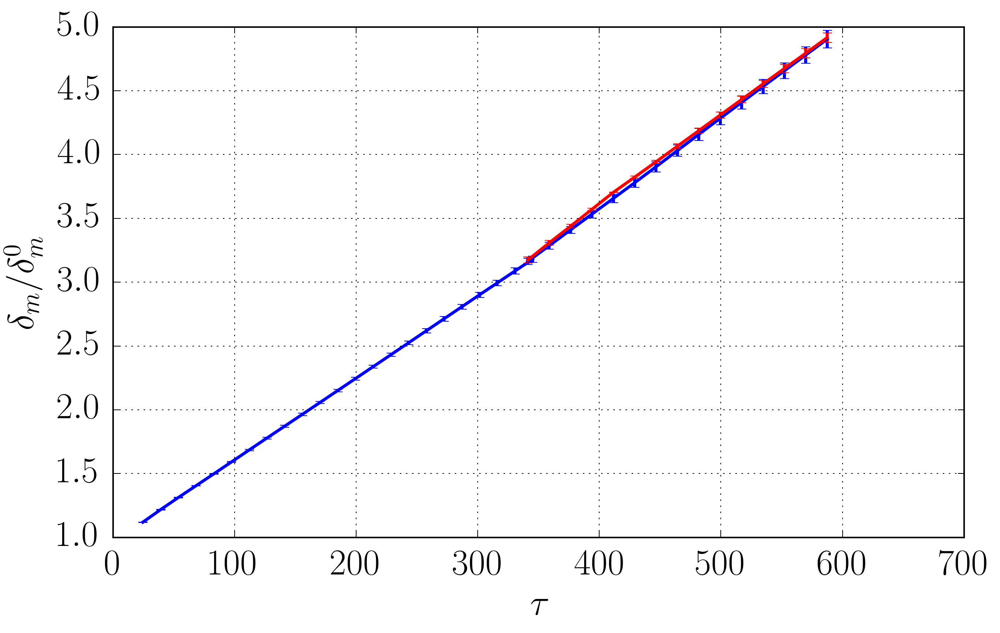

In [523]:
figname = '%s_%s_ave'%(varname,namecase)
ncases = len(lcases)
trestartcase=[trestart[0],trestart[-1]]
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
#ax2 = ax.twinx()
#time_int = np.linspace(tmin,tmax,Npoints)
tmin=0.0
tmax=700
tmin_ave = 10
tmax_ave = 590
vtcases_y1,vfcases_y1,stddcases_y1 = fcaseintime(p_folders_y1_s80,lcases_y1_s80,variable,tmin_ave,tmax_ave)
vtcases,vfcases,stddcases = fcaseintime(p_folders_s80,lcases_s80,variable,tmin,tmax)
#vtcases2,vfcases2,stddcases2 = fcaseintime(p_folders,lcases,variable2,tmin,tmax)
imin=5
NS=5
for icase in range(len(lcases_y1_s80)):
    #print vtcases[icase]
    ilim = where(vtcases_y1[icase]>trestartcase[icase])[0][0]
    #ax.plot(vtcases_y1[icase][0:ilim],vfcases_y1[icase][0:ilim],l_case_style[icase],lw=2.0)
    plt.errorbar(vtcases_y1[icase][imin:ilim:NS],vfcases_y1[icase][imin:ilim:NS], \
                 yerr=stddcases_y1[icase][imin:ilim:NS],color=l_case_color[icase],lw=2.0)
    
    
for icase in range(len(lcases_s80)):
    #print vtcases[icase]
    ilim = where(vtcases[icase]>trestartcase[icase])[0][0]-3
    imax = where(vtcases[icase]>tmax_ave)[0][0]
    #ax.plot(vtcases[icase][ilim:-1],vfcases[icase][ilim:-1],l_case_style[icase],lw=2.0)
    plt.errorbar(vtcases[icase][ilim:imax:NS],vfcases[icase][ilim:imax:NS], \
                 yerr=stddcases[icase][ilim:imax:NS],color=l_case_color[icase],lw=2.0)
    
ax.set_xlabel(xlabel)
ax.set_ylabel(ylabel)
#ax.set_ylim([0,0.01])
ax.set_xlim([tmin,tmax])
#ax.set_ylim([0,0.005])
ax.grid('on')
#SAVING
#SAVING
if PRINT == True:
    pathname = save_folder + figname + fformat
    print "figure saved at: %s!"%pathname
    fig.savefig(pathname,bbox_inches='tight')

# $\zeta$ vs time

74
74
74
4
4
4
7
15
figure saved at: /share/drive/toni/EFMC11/epsvstime_s80.pdf!


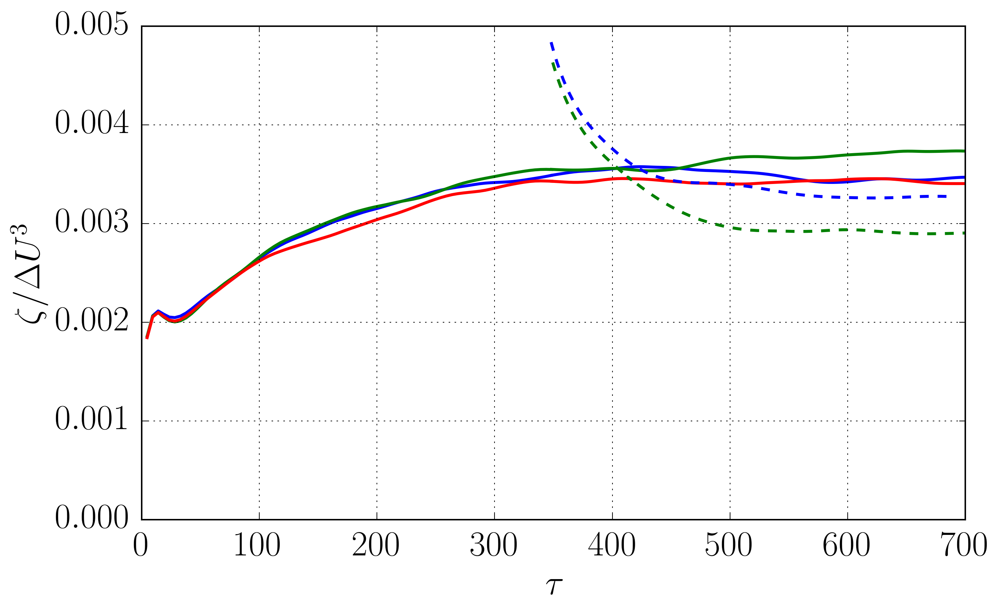

In [524]:
variable = 'EPS'
varname='epsvstime'
xlabel=r'$\tau$'
ylabel=r'$\zeta/\Delta U^3$'
#Preparing plot
fformat = '.pdf'
figname = '%s_%s'%(varname,namecase)
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
#Plot all jobs in the same graph
#time_int = np.linspace(tmin,tmax,Npoints)
for ijob in range(0,njobs_y1_s80):
    path = p_folders_y1_s80[ijob]
    with h5py.File(path,"r") as f:
        DU = np.array(f['um']).max()-np.array(f['um']).min()
        time = np.array(f['time'])
        fun = np.array(f[variable])
        #tmaxjob[ijob] = np.max(time)
        ilim = where(time>trestart[ijob])[0][0]
        print ilim
        #print ilim
        plt.plot(time[0:ilim] ,fun[0:ilim],l_job_style[ijob],lw=2.0,ms=8.0)

for ijob in range(0,njobs_s80):
    path = p_folders_s80[ijob]
    with h5py.File(path,"r") as f:
        DU = np.array(f['um']).max()-np.array(f['um']).min()
        time = np.array(f['time'])
        fun = np.array(f[variable])
        #tmaxjob[ijob] = np.max(time)
        ilim = where(time>trestart[ijob])[0][0]-1
        print ilim
        #print ilim
        plt.plot(time[ilim:-1] ,fun[ilim:-1],l_job_style[ijob],lw=2.0,ms=8.0)
ax.set_xlabel(xlabel)
ax.set_ylabel(ylabel)
ax.set_ylim([0.0,0.005])
#ax.set_yscale('log')
ax.set_xlim([0,tmax])
plt.grid('on')
#SAVING
if PRINT == True:
    pathname = save_folder + figname + fformat
    print "figure saved at: %s!"%pathname
    fig.savefig(pathname,bbox_inches='tight')


figure saved at: /share/drive/toni/EFMC11/epsvstime_s80_ave.pdf!


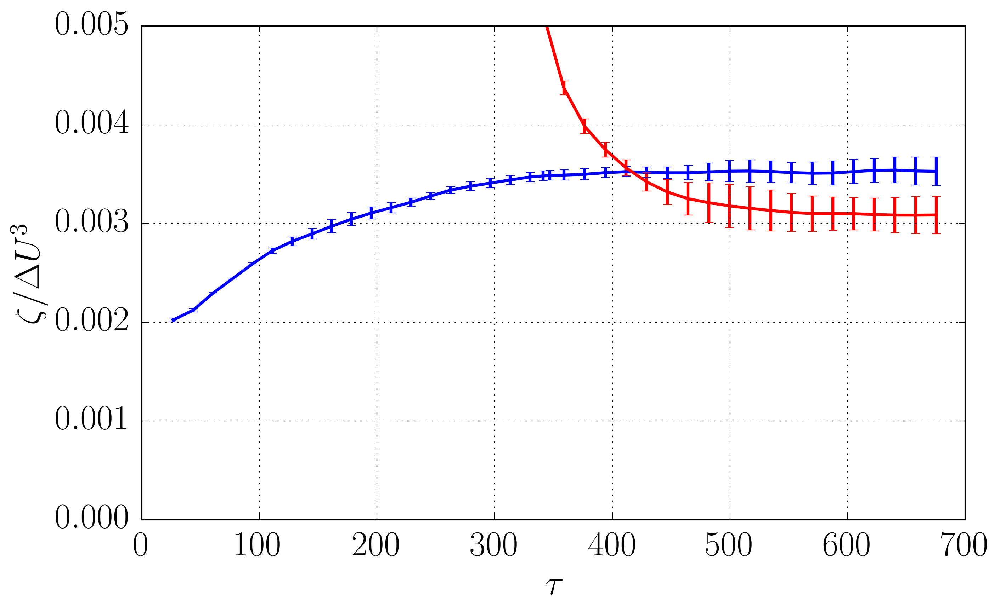

In [527]:
figname = '%s_%s_ave'%(varname,namecase)
ncases = len(lcases)
trestartcase=[trestart[0],trestart[-1]]
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
#ax2 = ax.twinx()
#time_int = np.linspace(tmin,tmax,Npoints)
tmin=0.0
tmax=700
tmin_ave = 10
tmax_ave = 680
vtcases_y1,vfcases_y1,stddcases_y1 = fcaseintime(p_folders_y1_s80,lcases_y1_s80,variable,tmin_ave,tmax_ave)
vtcases,vfcases,stddcases = fcaseintime(p_folders_s80,lcases_s80,variable,tmin,tmax)
#vtcases2,vfcases2,stddcases2 = fcaseintime(p_folders,lcases,variable2,tmin,tmax)
imin=5
NS=5
for icase in range(len(lcases_y1_s80)):
    #print vtcases[icase]
    ilim = where(vtcases_y1[icase]>trestartcase[icase])[0][0]
    #ax.plot(vtcases_y1[icase][0:ilim],vfcases_y1[icase][0:ilim],l_case_style[icase],lw=2.0)
    plt.errorbar(vtcases_y1[icase][imin:ilim:NS],vfcases_y1[icase][imin:ilim:NS], \
                 yerr=stddcases_y1[icase][imin:ilim:NS],color=l_case_color[icase],lw=2.0)
    
    
for icase in range(len(lcases_s80)):
    #print vtcases[icase]
    ilim = where(vtcases[icase]>trestartcase[icase])[0][0]-3
    imax = where(vtcases[icase]>tmax_ave)[0][0]
    #ax.plot(vtcases[icase][ilim:-1],vfcases[icase][ilim:-1],l_case_style[icase],lw=2.0)
    plt.errorbar(vtcases[icase][ilim:imax:NS],vfcases[icase][ilim:imax:NS], \
                 yerr=stddcases[icase][ilim:imax:NS],color=l_case_color[icase],lw=2.0)
    
ax.set_xlabel(xlabel)
ax.set_ylabel(ylabel)
#ax.set_ylim([0,0.01])
ax.set_xlim([tmin,tmax])
ax.set_ylim([0,0.005])
ax.grid('on')
#SAVING
#SAVING
if PRINT == True:
    pathname = save_folder + figname + fformat
    print "figure saved at: %s!"%pathname
    fig.savefig(pathname,bbox_inches='tight')


# SELF-SIMILAR REGION LOCATION

# s=8

In [552]:
SS1s8 = [550,550,550,600,600]
SS2s8 = [670,670,670,680,680]
namecase='s80'
sumSpan=0
jlist= [0,1,2,3,4] #sigma=0
#jlist= [3,4,5] #sigma=0.7
#jlist= [6,7,8] #s=4
#jlist= [3,4,5] #s=2
#jlist = [0,1,2] #s=1
scase = 8
#dw0=18.;#s=4,8
dw0=28.0 #s=1,2
jjob=0
for ijob in jlist:
    sumSpan += SS2[ijob]-SS1[ijob]
print r"SS timespan for case s=%s is %s $\delta_m^0/\Delta U$, correspondign to %s $\delta_w/\Delta U$" %(scase,sumSpan,sumSpan/dw0)

SS timespan for case s=8 is 770 $\delta_m^0/\Delta U$, correspondign to 27.5 $\delta_w/\Delta U$


58 91
Sigma = 2.62631357996 > sigma_max = 2
t1=550.0,t2=670.0
58 91
Sigma = 6.69998269522 > sigma_max = 2
t1=550.0,t2=670.0
58 91
Sigma = 3.23004352539 > sigma_max = 2
t1=550.0,t2=670.0
73 89
Sigma = 4.93784157067 > sigma_max = 2
t1=600.0,t2=680.0
103 119
Sigma = 3.44417511201 > sigma_max = 2
t1=600.0,t2=680.0
/share/drive/toni/EFMC11/SSR11s8runALL.pdf


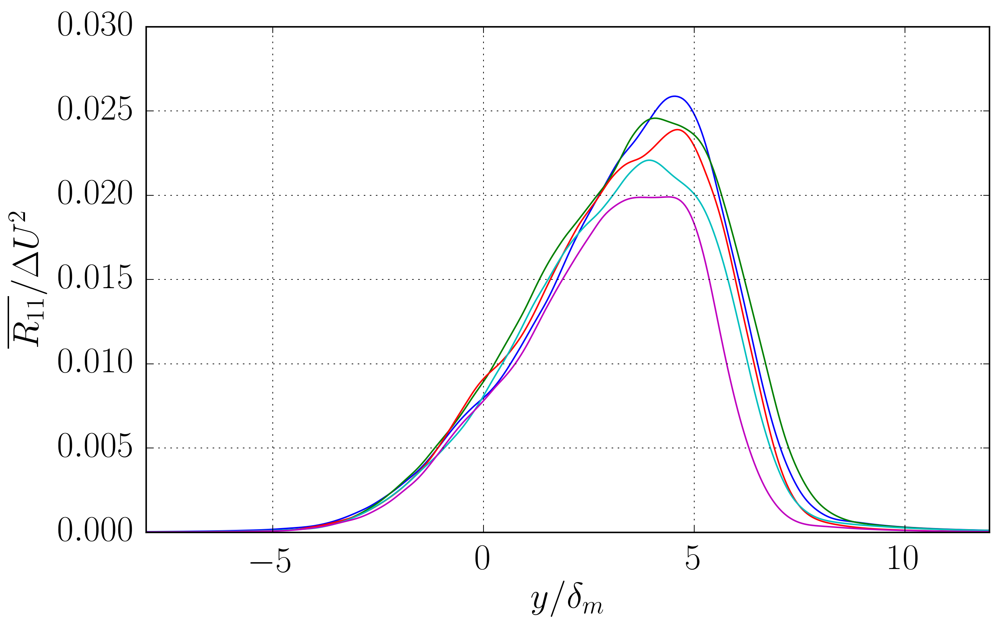

In [553]:
fformat='.pdf'
PRINT=True
variable='R11'
xlabel=r"$y/\delta_m$"
#ylabel=r"$\overline{\omega_z}\delta_m/\Delta U$"
ylabel=r"$\overline{R_{11}}/\Delta U^2$"
#ylabel=r"$\overline{T_{rms}}$"
scaling = 'dm'
nranges=0
showOUT=False
#jlist = [0,1,2] #s=1
#jlist= [3,4,5] #s=2
#jlist= [6,7,8] #s=4
#jlist= [3,4,5]
#jlist=[3,4,5]
jlist2=jlist
smax = 2
Dtout=10.0
vnranges=[1,1,1, 1,1]
figname = 'SS%ss%srunALL'%(variable,scase)
#figname = 'SS%ss%srun%s'%(variable,scase,jlist[jjob])
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
for ijob in jlist2:
    nranges = vnranges[ijob]
    t11 = SS1s8[ijob]; t12 = SS2s8[ijob]; 
    #print t11,t12
    Dt = (t12-t11)/(nranges)
    vt1=np.linspace(t11,t12,nranges)
    for i in range(nranges):
        tmin = vt1[i];tmax = vt1[i]+Dt
        yxi,fun,error = getSSprofile(p_folders_s80[ijob],variable,tmin,tmax,scaling)
        plt.plot(yxi,fun,lw=1.0)
        #print error*100
        #fun[fun<10E-9]=np.nan
        #rel_err= np.max(error)/np.max(fun)*100
        rel_err= error.max()/fun.max()*100
        if rel_err > smax:
            print "Sigma = %s > sigma_max = %s" %(rel_err,smax)
            print "t1=%s,t2=%s"%(tmin,tmax)
    #one before SS
    if showOUT==True:
        tmin = SS1s8[ijob]-Dtout;tmax=tmin+8.0;
        yxi,fun,error = getSSprofile(p_folders_s80[ijob],variable,tmin,tmax,scaling)
        plt.plot(yxi,np.sqrt(fun),'g--',label=r"\tau=%s"%(tmin))
    #one after SS
        tmin = SS2s8[ijob]+Dtout;tmax=tmin+10.0;
        yxi,fun,error = getSSprofile(p_folders_s80[ijob],variable,tmin,tmax,scaling)
        plt.plot(yxi,fun,'r.-',label=r"\tau=%s"%(tmin))
if scaling =='dm':
    plt.xlim([-8,12])
else:
    plt.xlim([-1,2])
#plt.ylim([0.0,0.2])
plt.xlabel(xlabel);
plt.ylabel(ylabel)
plt.grid('on')
plt.legend(loc=2,prop={'size':14})
if PRINT == True:
    pathname = save_folder + figname+ fformat
    print pathname
    fig.savefig(pathname,bbox_inches='tight')

74
74
74
4
4
4
7
15
figure saved at: /share/drive/toni/EFMC11/dmpointvstime_s80.pdf!


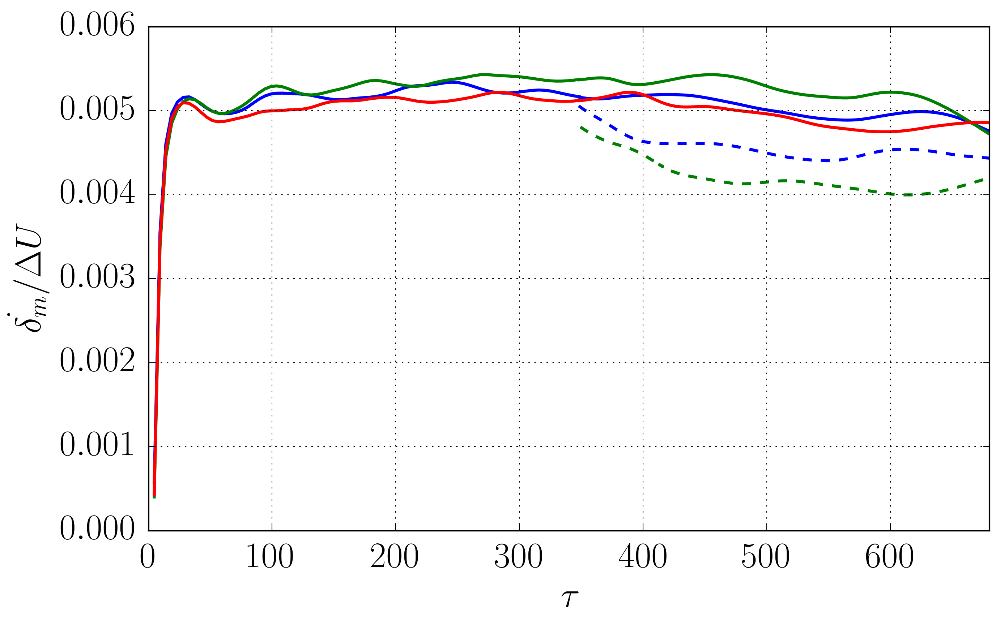

In [554]:
variable = 'dmpoint'
varname='dmpointvstime'
xlabel=r'$\tau$'
ylabel=r'$\dot{\delta_m}/\Delta U$'
#Preparing plot
fformat = '.pdf'
figname = '%s_%s'%(varname,namecase)
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
#Plot all jobs in the same graph
#time_int = np.linspace(tmin,tmax,Npoints)
for ijob in range(0,njobs_y1):
    path = p_folders_y1_s80[ijob]
    with h5py.File(path,"r") as f:
        DU = np.array(f['um']).max()-np.array(f['um']).min()
        time = np.array(f['time'])
        fun = np.array(f[variable])
        #tmaxjob[ijob] = np.max(time)
        ilim = where(time>trestart[ijob])[0][0]
        print ilim
        #print ilim
        plt.plot(time[0:ilim] ,fun[0:ilim],l_job_style[ijob],lw=2.0,ms=8.0)

dmpdens = [[] for i in range(njobs)]
dmptotal = [[] for i in range(njobs)]
dmpturb=[[] for i in range(njobs)]
Cdelta=[[] for i in range(njobs)]
for ijob in range(0,njobs_s80):
    path = p_folders_s80[ijob]
    with h5py.File(path,"r") as f:
        DU = np.array(f['um']).max()-np.array(f['um']).min()
        time = np.array(f['time'])
        fun = np.array(f[variable])
        fun2= der1(time,np.array(f['dm']))
        fun3=0.25*(np.array(f['rvm'])[-1,:]-np.array(f['rvm'])[0,:])
        dmpdens[ijob] = fun3
        dmpturb[ijob]=fun
        dmptotal[ijob]=fun2
        Cdelta[ijob] = 2.0*fun2*f['dw']/f['dm']
        #tmaxjob[ijob] = np.max(time)
        ilim = where(time>trestart[ijob])[0][0]-1
        print ilim
        #print ilim
        plt.plot(time[ilim:-1] ,fun[ilim:-1],l_job_style[ijob],lw=2.0,ms=8.0)
ax.set_xlabel(xlabel)
ax.set_ylabel(ylabel)
#ax.set_ylim([0.0,0.005])
#ax.set_yscale('log')
ax.set_xlim([0,tmax])
plt.grid('on')
#SAVING
if PRINT == True:
    pathname = save_folder + figname + fformat
    print "figure saved at: %s!"%pathname
    fig.savefig(pathname,bbox_inches='tight')


In [555]:
dmpdensAVE = [[] for ijob in range(njobs_s80)]
errordmpdensAVE = [[] for ijob in range(njobs_s80)]
dmpturbAVE = [[] for ijob in range(njobs_s80)]
errordmpturbAVE = [[] for ijob in range(njobs_s80)]
dmp =[[] for ijob in range(njobs_s80)]
errordmp = [[] for ijob in range(njobs_s80)]
for ijob in range(njobs_s80):
    dmpdensAVE[ijob],errordmpdensAVE[ijob] = getvarmeanintimeV(dmpdens[ijob],vtime[ijob],SS1[ijob],SS2[ijob])
    dmpturbAVE[ijob],errordmpturbAVE[ijob] = getvarmeanintimeV(dmpturb[ijob],vtime[ijob],SS1[ijob],SS2[ijob])
    dmp[ijob],errordmp[ijob] = getvarmeanintimeV(dmptotal[ijob],vtime[ijob],SS1[ijob],SS2[ijob])
    
ncases = len(lcases)
dmpcase= [[]for i in range(ncases)]
dmperrorcase = [[]for i in range(ncases)]

print "Turbulent Contribution approximation Vreman"
for icase in range(ncases_s80):
    dmptmp= [[]for i in range(len(lcases_s80[icase]))]
    errordmptmp= [[]for i in range(len(lcases_s80[icase]))]
    for ijob,i in zip(lcases_s80[icase],range(len(lcases_s80[icase]))):
        dmptmp[i] = dmpturbAVE[ijob]
        errordmptmp[i] = errordmpturbAVE[ijob]
    dmpcase[icase]=np.mean(dmptmp,axis=0)
    dmperrorcase[icase]=np.max(errordmptmp,axis=0)
    print "dmpoint = %s, std= %s" %(dmpcase[icase],dmperrorcase[icase])

print "Mass flux contribution"
for icase in range(ncases_s80):
    dmptmp= [[]for i in range(len(lcases_s80[icase]))]
    errordmptmp= [[]for i in range(len(lcases_s80[icase]))]
    for ijob,i in zip(lcases_s80[icase],range(len(lcases_s80[icase]))):
        dmptmp[i] = dmpdensAVE[ijob]
        errordmptmp[i] = errordmpdensAVE[ijob]
    dmpcase[icase]=np.mean(dmptmp,axis=0)
    dmperrorcase[icase]=np.max(errordmptmp,axis=0)
    print "dmpoint = %s, std= %s" %(dmpcase[icase],dmperrorcase[icase])
    
print "Total"
for icase in range(ncases_s80):
    dmptmp= [[]for i in range(len(lcases_s80[icase]))]
    errordmptmp= [[]for i in range(len(lcases_s80[icase]))]
    for ijob,i in zip(lcases_s80[icase],range(len(lcases_s80[icase]))):
        dmptmp[i] = dmp[ijob]
        errordmptmp[i] = errordmp[ijob]
    dmpcase[icase]=np.mean(dmptmp,axis=0)
    dmperrorcase[icase]=np.max(errordmptmp,axis=0)
    print "dmpoint = %s, std= %s" %(dmpcase[icase],dmperrorcase[icase])

Turbulent Contribution approximation Vreman
dmpoint = 0.00499614392055, std= 9.4594348976e-05
dmpoint = 0.00431274755889, std= 5.06637088028e-05
Mass flux contribution
dmpoint = 0.000840029462818, std= 3.04649611528e-05
dmpoint = 0.00059833669338, std= 9.77976246092e-06
Total
dmpoint = 0.0070712665088, std= 0.00014264117213
dmpoint = 0.00697799134514, std= 0.000136905139786


58 91
58 91
58 91
73 89
103 119
figure /share/drive/toni/EFMC11/Tm_s80_s80.pdf saved!
figure /share/drive/toni/EFMC11/Tm_s80_s80std.pdf saved!


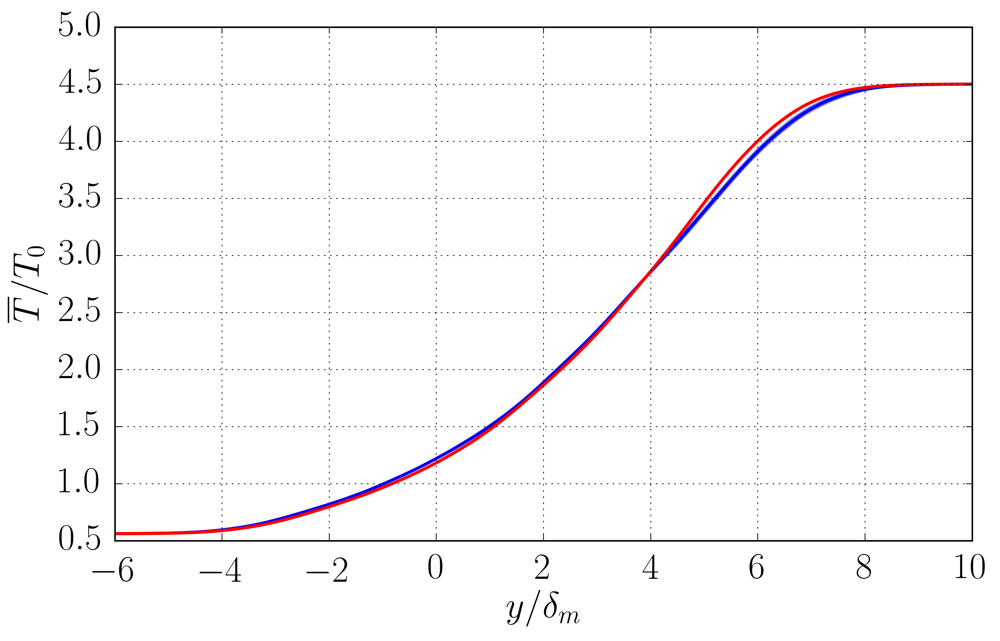

In [556]:
variable = 'Tm' #any vector variable available
scaling  = 'dm' #can be dw or dm
xlabel =r'$y/\delta_m$'
ylabel =r'$\overline{T}/{T_0}$'
varname ='Tm_s80'
figname = '%s_%s'%(varname,namecase)
#ylabel = r"y"
#figname = 'rhom_ave.eps'
derivative = False

ycases,fSS,errorSS = getSScase2(p_folders_s80,lcases_s80,variable,scaling,SS1s8,SS2s8)
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);plt.ylabel(ylabel,rotation='vertical');
#plt.plot(rhos20pantano[:,0]/conv[1],rhos20pantano[:,1],'b.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos40pantano[:,0]/conv[2],rhos40pantano[:,1],'g.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos80pantano[:,0]/conv[3],rhos80pantano[:,1],'r.',markevery=1,alpha=1.0,ms=8)
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1,1.5])
plt.grid('on')
sigma = 1.
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    plt.plot(ycases[icase][0],fSS[icase],l_case_style[icase],lw=2.0)
    plt.fill_between(ycases[icase][0], fSS[icase]-sigma*errorSS[icase], fSS[icase]+sigma*errorSS[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])
if PRINT == True:
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure %s saved!" %pathname
    #Save with STD
    for icase in range(len(lcases)):
        plt.fill_between(ycases[icase][0], (fSS[icase]+errorSS[icase]), (fSS[icase]-errorSS[icase]),color=l_case_color[icase],alpha=0.2)
    pathname = save_folder + figname + 'std' + fformat
    print "figure %s saved!" %pathname
    fig.savefig(pathname,bbox_inches='tight')

58 91
58 91
58 91
73 89
103 119
figure /share/drive/toni/EFMC11/R11_s80_s80.pdf saved!
figure /share/drive/toni/EFMC11/R11_s80_s80std.pdf saved!


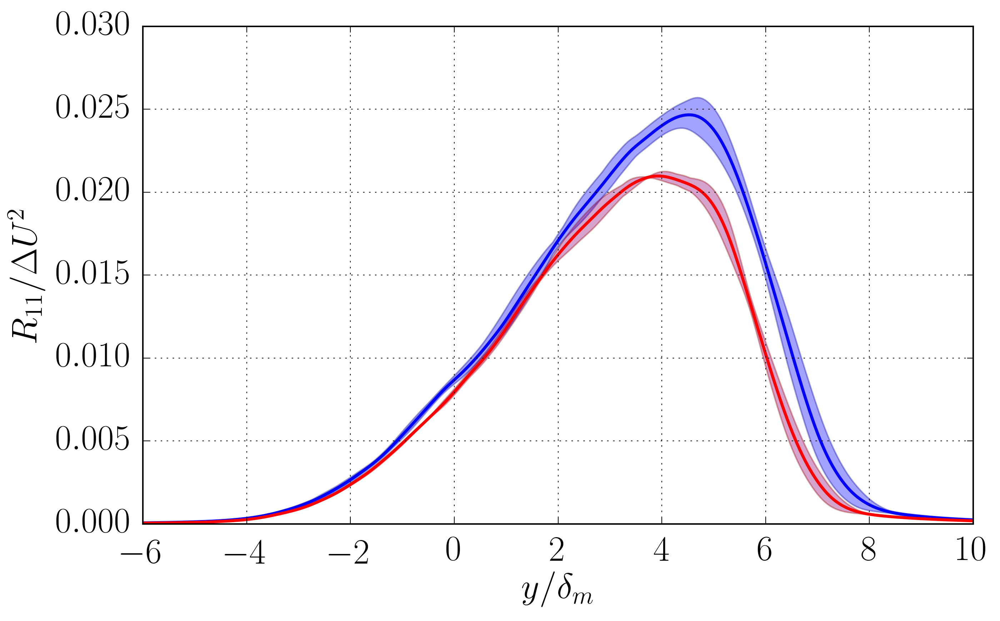

In [557]:
variable = 'R11' #any vector variable available
scaling  = 'dm' #can be dw or dm
xlabel =r'$y/\delta_m$'
ylabel =r'$R_{11}/\Delta U^2$'
varname ='R11_s80'
figname = '%s_%s'%(varname,namecase)
#ylabel = r"y"
#figname = 'rhom_ave.eps'
derivative = False

ycases,fSS,errorSS = getSScase2(p_folders_s80,lcases_s80,variable,scaling,SS1s8,SS2s8)
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);plt.ylabel(ylabel,rotation='vertical');
#plt.plot(rhos20pantano[:,0]/conv[1],rhos20pantano[:,1],'b.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos40pantano[:,0]/conv[2],rhos40pantano[:,1],'g.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos80pantano[:,0]/conv[3],rhos80pantano[:,1],'r.',markevery=1,alpha=1.0,ms=8)
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1,1.5])
plt.grid('on')
sigma = 1.
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    plt.plot(ycases[icase][0],fSS[icase],l_case_style[icase],lw=2.0)
    plt.fill_between(ycases[icase][0], fSS[icase]-sigma*errorSS[icase], fSS[icase]+sigma*errorSS[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])
if PRINT == True:
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure %s saved!" %pathname
    #Save with STD
    for icase in range(len(lcases)):
        plt.fill_between(ycases[icase][0], (fSS[icase]+errorSS[icase]), (fSS[icase]-errorSS[icase]),color=l_case_color[icase],alpha=0.2)
    pathname = save_folder + figname + 'std' + fformat
    print "figure %s saved!" %pathname
    fig.savefig(pathname,bbox_inches='tight')

58 91
58 91
58 91
73 89
103 119
figure /share/drive/toni/EFMC11/k_s80.pdf saved!
figure /share/drive/toni/EFMC11/k_s80std.pdf saved!


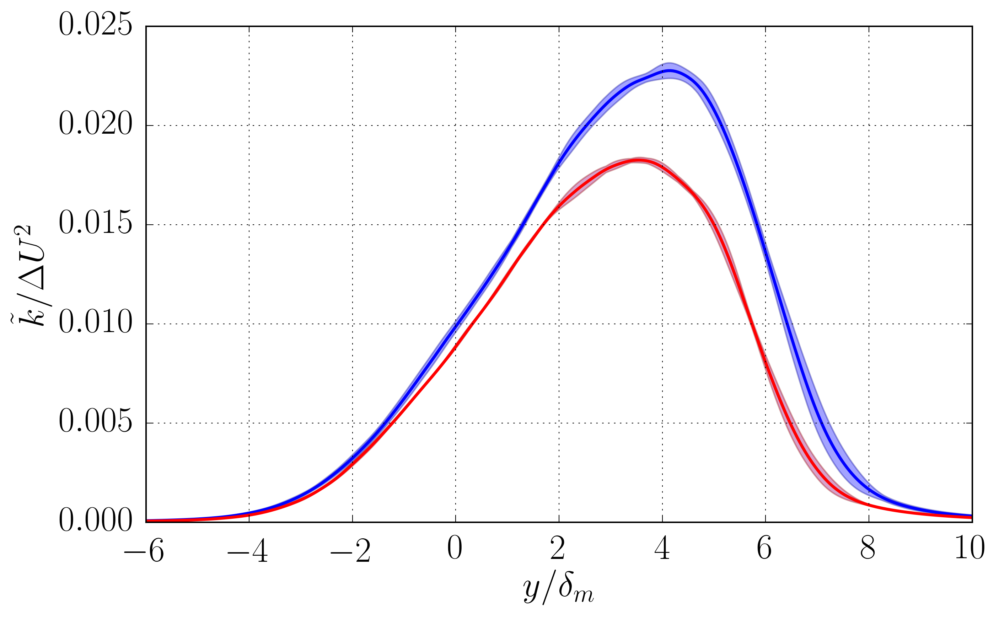

In [558]:
variable = 'k' #any vector variable available
scaling  = 'dm' #can be dw or dm
xlabel =r'$y/\delta_m$'
ylabel =r'$\tilde{k}/\Delta U^2$'
varname ='k'
figname = '%s_%s'%(varname,namecase)
#ylabel = r"y"
#figname = 'rhom_ave.eps'
derivative = False

ycases,fSS,errorSS = getSScase2(p_folders_s80,lcases_s80,variable,scaling,SS1s8,SS2s8)
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);plt.ylabel(ylabel,rotation='vertical');
#plt.plot(rhos20pantano[:,0]/conv[1],rhos20pantano[:,1],'b.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos40pantano[:,0]/conv[2],rhos40pantano[:,1],'g.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos80pantano[:,0]/conv[3],rhos80pantano[:,1],'r.',markevery=1,alpha=1.0,ms=8)
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1,1.5])
plt.grid('on')
sigma = 1.
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    plt.plot(ycases[icase][0],fSS[icase],l_case_style[icase],lw=2.0)
    plt.fill_between(ycases[icase][0], fSS[icase]-sigma*errorSS[icase], fSS[icase]+sigma*errorSS[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])
if PRINT == True:
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure %s saved!" %pathname
    #Save with STD
    for icase in range(len(lcases)):
        plt.fill_between(ycases[icase][0], (fSS[icase]+errorSS[icase]), (fSS[icase]-errorSS[icase]),color=l_case_color[icase],alpha=0.2)
    pathname = save_folder + figname + 'std' + fformat
    print "figure %s saved!" %pathname
    fig.savefig(pathname,bbox_inches='tight')

58 91
Multiplying by scaling
58 91
Multiplying by scaling
58 91
Multiplying by scaling
73 89
Multiplying by scaling
103 119
Multiplying by scaling
figure /share/drive/toni/EFMC11/epR_s80.pdf saved!
figure /share/drive/toni/EFMC11/epR_s80std.pdf saved!


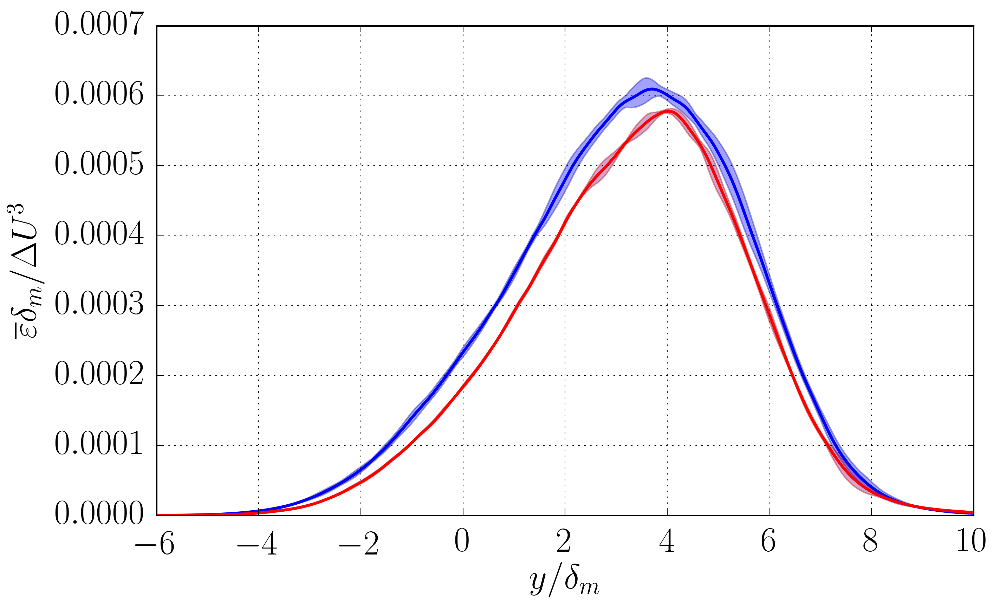

In [559]:
variable = 'epR' #any vector variable available
scaling  = 'dm' #can be dw or dm
xlabel =r'$y/\delta_m$'
ylabel =r'$\overline{\varepsilon}\delta_m/\Delta U^3$'
varname ='epR'
figname = '%s_%s'%(varname,namecase)
#ylabel = r"y"
#figname = 'rhom_ave.eps'
derivative = False

ycases,fSS,errorSS = getSScase2(p_folders_s80,lcases_s80,variable,scaling,SS1s8,SS2s8)
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);plt.ylabel(ylabel,rotation='vertical');
#plt.plot(rhos20pantano[:,0]/conv[1],rhos20pantano[:,1],'b.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos40pantano[:,0]/conv[2],rhos40pantano[:,1],'g.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos80pantano[:,0]/conv[3],rhos80pantano[:,1],'r.',markevery=1,alpha=1.0,ms=8)
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1,1.5])
plt.grid('on')
sigma = 1.
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    plt.plot(ycases[icase][0],fSS[icase],l_case_style[icase],lw=2.0)
    plt.fill_between(ycases[icase][0], fSS[icase]-sigma*errorSS[icase], fSS[icase]+sigma*errorSS[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])
if PRINT == True:
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure %s saved!" %pathname
    #Save with STD
    for icase in range(len(lcases)):
        plt.fill_between(ycases[icase][0], (fSS[icase]+errorSS[icase]), (fSS[icase]-errorSS[icase]),color=l_case_color[icase],alpha=0.2)
    pathname = save_folder + figname + 'std' + fformat
    print "figure %s saved!" %pathname
    fig.savefig(pathname,bbox_inches='tight')

58 91
58 91
58 91
73 89
103 119
figure /share/drive/toni/EFMC11/Relambday_s80.pdf saved!
figure /share/drive/toni/EFMC11/Relambday_s80std.pdf saved!


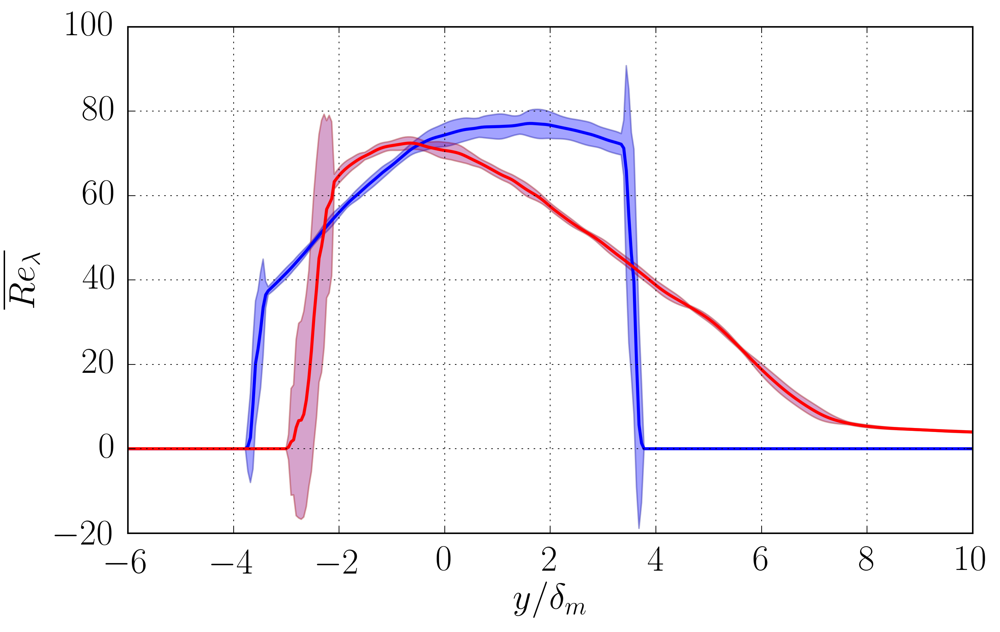

In [560]:
variable = 'Relambday' #any vector variable available
scaling  = 'dm' #can be dw or dm
xlabel =r'$y/\delta_m$'
ylabel =r'$\overline{Re_\lambda}$'
varname ='Relambday'
figname = '%s_%s'%(varname,namecase)
#ylabel = r"y"
#figname = 'rhom_ave.eps'
derivative = False

ycases,fSS,errorSS = getSScase2(p_folders_s80,lcases_s80,variable,scaling,SS1s8,SS2s8)
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);plt.ylabel(ylabel,rotation='vertical');
#plt.plot(rhos20pantano[:,0]/conv[1],rhos20pantano[:,1],'b.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos40pantano[:,0]/conv[2],rhos40pantano[:,1],'g.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos80pantano[:,0]/conv[3],rhos80pantano[:,1],'r.',markevery=1,alpha=1.0,ms=8)
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1,1.5])
plt.grid('on')
sigma = 1.
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    plt.plot(ycases[icase][0],fSS[icase],l_case_style[icase],lw=2.0)
    plt.fill_between(ycases[icase][0], fSS[icase]-sigma*errorSS[icase], fSS[icase]+sigma*errorSS[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])
if PRINT == True:
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure %s saved!" %pathname
    #Save with STD
    for icase in range(len(lcases)):
        plt.fill_between(ycases[icase][0], (fSS[icase]+errorSS[icase]), (fSS[icase]-errorSS[icase]),color=l_case_color[icase],alpha=0.2)
    pathname = save_folder + figname + 'std' + fformat
    print "figure %s saved!" %pathname
    fig.savefig(pathname,bbox_inches='tight')

58 91
58 91
58 91
73 89
103 119
figure /share/drive/toni/EFMC11/nu_s80.pdf saved!
figure /share/drive/toni/EFMC11/nu_s80std.pdf saved!


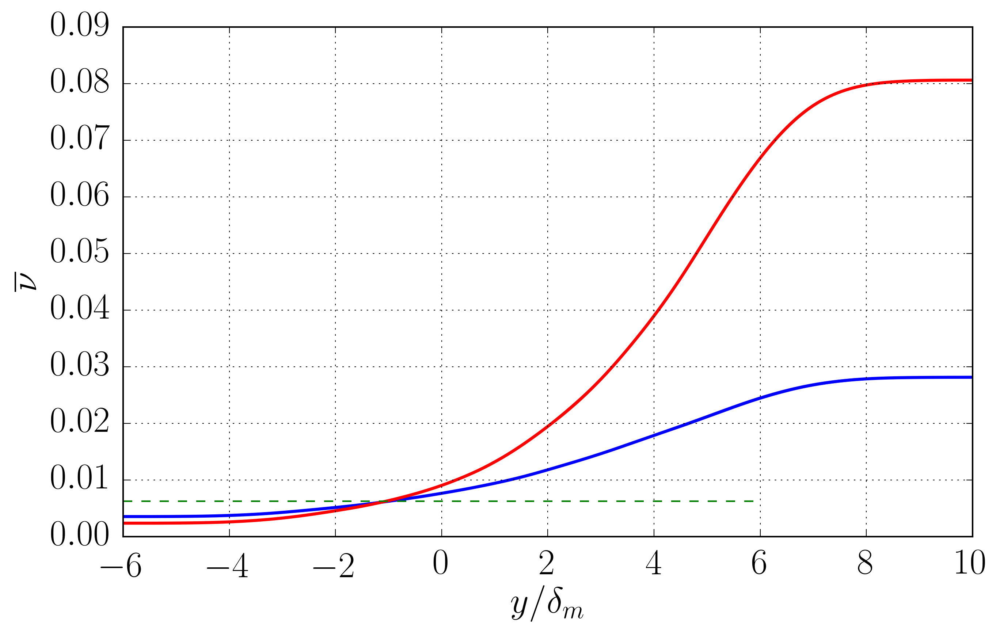

In [562]:
variable = 'nu' #any vector variable available
scaling  = 'dm' #can be dw or dm
xlabel =r'$y/\delta_m$'
ylabel =r'$\overline{\nu}$'
varname ='nu'
figname = '%s_%s'%(varname,namecase)
#ylabel = r"y"
#figname = 'rhom_ave.eps'
derivative = False

ycases,fSS,errorSS = getSScase2(p_folders_s80,lcases_s80,variable,scaling,SS1s8,SS2s8)
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);plt.ylabel(ylabel,rotation='vertical');
#plt.plot(rhos20pantano[:,0]/conv[1],rhos20pantano[:,1],'b.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos40pantano[:,0]/conv[2],rhos40pantano[:,1],'g.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos80pantano[:,0]/conv[3],rhos80pantano[:,1],'r.',markevery=1,alpha=1.0,ms=8)
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1,1.5])
plt.grid('on')
sigma = 1.
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    plt.plot(ycases[icase][0],fSS[icase],l_case_style[icase],lw=2.0)
    plt.fill_between(ycases[icase][0], fSS[icase]-sigma*errorSS[icase], fSS[icase]+sigma*errorSS[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])
if PRINT == True:
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure %s saved!" %pathname
    #Save with STD
    for icase in range(len(lcases)):
        plt.fill_between(ycases[icase][0], (fSS[icase]+errorSS[icase]), (fSS[icase]-errorSS[icase]),color=l_case_color[icase],alpha=0.2)
    pathname = save_folder + figname + 'std' + fformat
    print "figure %s saved!" %pathname
    fig.savefig(pathname,bbox_inches='tight')


# SELF-SIMILAR REGION LOCATION

In [614]:
def getSSprofile(path,variable,tmin,tmax,scaling = 'dm',Npoints=500,derivative=False,y0=0):
    """
    Obtain SS profile averaged in the given time
    """
    lim = 12.0;
    if scaling == 'dw':
        lim=2.0
    
    ydelta = np.linspace(-lim,lim,Npoints)
    funintcum = np.zeros(Npoints);
    nacum = 0
    calc=False
    backup = variable
    if variable=='rum2':
        variable='rum'
        calc=True
    if variable[0:2]=='fl':
        var2="r%sm"%(variable[-1])
        variable="%sm"%(variable[-1])
        calc=True
    with h5py.File(path,"r") as f:
        time = np.array(f['time']);
        fun = np.array(f[variable]);
            #print "computed rum/rhom"
        y = np.array(f['y'])
        delta = f[scaling]
        it1 = where(time>=tmin)[0][0]
        it2 = where(time>=tmax)[0][0]
        fyjob = [np.zeros(Npoints) for i in range(it2-it1)]
        print it1,it2
        for itime in range(it1,it2):
            dd = delta[itime]
            if derivative == True:
                funint = np.interp(ydelta,(y-y0)/dd,dd*der1(y,fun[:,itime]))
                if itime==it1:
                    print "Taking derivative and multiplying by scaling"
            else:
                if variable=='w3m' or (variable[0]=='w' and variable[-1]=='s') or variable[0:2] =='ep' or variable =='chi':
                    funint = np.interp(ydelta,(y-y0)/dd,dd*fun[:,itime])
                    if itime==it1: #First time
                        print "Multiplying by scaling"
                elif variable=='rum' and calc==True:
                    rhom = np.array(f['rhom'])
                    funint = np.interp(ydelta,y/dd,fun[:,itime]/rhom[:,itime])
                elif backup[0:2]=='fl' and calc==True:
                    rum=np.array(f[var2])
                    rhom=np.array(f['rhom'])
                    funint = np.interp(ydelta,y/dd,(rum[:,itime]-rhom[:,itime]*fun[:,itime])/rhom[:,itime])
                else:
                    funint = np.interp(ydelta,(y-y0)/dd,fun[:,itime])
            fyjob[itime-it1] = funint
            
    return ydelta,np.mean(fyjob,axis=0),np.std(fyjob,axis=0)
            

# s=4

In [563]:
SS1 = [450,520,455,490,510,510]
SS2 = [650,625,650,650,620,670]
namecase='s40'
sumSpan=0
jlist= [0,1,2] #sigma=0
#jlist= [3,4,5] #sigma=0.7
#jlist= [6,7,8] #s=4
#jlist= [3,4,5] #s=2
#jlist = [0,1,2] #s=1
scase = 4
#dw0=18.;#s=4,8
dw0=28.0 #s=1,2
jjob=0
for ijob in jlist:
    sumSpan += SS2[ijob]-SS1[ijob]
print r"SS timespan for case s=%s is %s $\delta_m^0/\Delta U$, correspondign to %s $\delta_w/\Delta U$" %(scase,sumSpan,sumSpan/dw0)

SS timespan for case s=4 is 500 $\delta_m^0/\Delta U$, correspondign to 17.8571428571 $\delta_w/\Delta U$


39 78
Sigma = 3.1611763281 > sigma_max = 2
t1=450.0,t2=650.0
53 74
Sigma = 4.66587838494 > sigma_max = 2
t1=520.0,t2=625.0
36 77
Sigma = 4.88460249982 > sigma_max = 2
t1=455.0,t2=650.0
/share/drive/toni/EFMC11/SSR11s4runALL.pdf


/usr/local/lib/python2.7/site-packages/matplotlib/axes/_axes.py:519: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


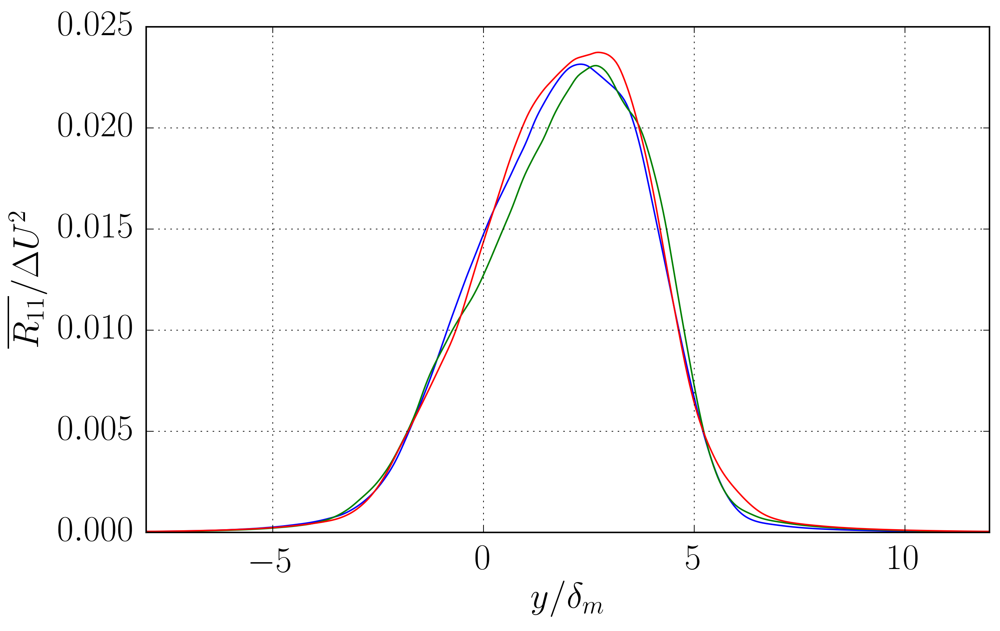

In [316]:
fformat='.pdf'
PRINT=True
variable='R11'
xlabel=r"$y/\delta_m$"
#ylabel=r"$\overline{\omega_z}\delta_m/\Delta U$"
ylabel=r"$\overline{R_{11}}/\Delta U^2$"
#ylabel=r"$\overline{T_{rms}}$"
scaling = 'dm'
nranges=0
showOUT=False
#jlist = [0,1,2] #s=1
#jlist= [3,4,5] #s=2
#jlist= [6,7,8] #s=4
#jlist= [3,4,5]
#jlist=[3,4,5]
jlist2=jlist
smax = 2
Dtout=10.0
vnranges=[1,1,1, 1,1,1]
figname = 'SS%ss%srunALL'%(variable,scase)
#figname = 'SS%ss%srun%s'%(variable,scase,jlist[jjob])
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
for ijob in jlist2:
    nranges = vnranges[ijob]
    t11 = SS1[ijob]; t12 = SS2[ijob]; 
    #print t11,t12
    Dt = (t12-t11)/(nranges)
    vt1=np.linspace(t11,t12,nranges)
    for i in range(nranges):
        tmin = vt1[i];tmax = vt1[i]+Dt
        yxi,fun,error = getSSprofile(p_folders[ijob],variable,tmin,tmax,scaling)
        plt.plot(yxi,fun,lw=1.0)
        #print error*100
        #fun[fun<10E-9]=np.nan
        #rel_err= np.max(error)/np.max(fun)*100
        rel_err= error.max()/fun.max()*100
        if rel_err > smax:
            print "Sigma = %s > sigma_max = %s" %(rel_err,smax)
            print "t1=%s,t2=%s"%(tmin,tmax)
    #one before SS
    if showOUT==True:
        tmin = SS1[ijob]-Dtout;tmax=tmin+8.0;
        yxi,fun,error = getSSprofile(p_folders[ijob],variable,tmin,tmax,scaling)
        plt.plot(yxi,np.sqrt(fun),'g--',label=r"\tau=%s"%(tmin))
    #one after SS
        tmin = SS2[ijob]+Dtout;tmax=tmin+10.0;
        yxi,fun,error = getSSprofile(p_folders[ijob],variable,tmin,tmax,scaling)
        plt.plot(yxi,fun,'r.-',label=r"\tau=%s"%(tmin))
if scaling =='dm':
    plt.xlim([-8,12])
else:
    plt.xlim([-1,2])
#plt.ylim([0.0,0.2])
plt.xlabel(xlabel);
plt.ylabel(ylabel)
plt.grid('on')
plt.legend(loc=2,prop={'size':14})
if PRINT == True:
    pathname = save_folder + figname+ fformat
    print pathname
    fig.savefig(pathname,bbox_inches='tight')

# AVAREGED PROFILES

In [317]:
UselfRM =np.loadtxt('/data2/toni/work/db/uselfRogersMoser.dat');
ums20pantano = np.loadtxt('/data2/toni/work/db/Pantano2002_umean_s20.dat');
ums40pantano = np.loadtxt('/data2/toni/work/db/Pantano2002_umean_s40.dat');
ums80pantano = np.loadtxt('/data2/toni/work/db/Pantano2002_umean_s80.dat');
rhos20pantano = np.loadtxt('/data2/toni/work/db/Pantano2002_rhomean_s20.dat');
rhos40pantano = np.loadtxt('/data2/toni/work/db/Pantano2002_rhomean_s40.dat');
rhos80pantano = np.loadtxt('/data2/toni/work/db/Pantano2002_rhomean_s80.dat');
R12s1pantano=np.loadtxt('/share/drive/toni/python/R12Pantanos1.dat');
R12s2pantano=np.loadtxt('/share/drive/toni/python/R12Pantanos2.dat');
R12s4pantano=np.loadtxt('/share/drive/toni/python/R12Pantanos4.dat');
R12s8pantano=np.loadtxt('/share/drive/toni/python/R12Pantanos8.dat');
urmsRM = np.loadtxt('/data2/toni/work/db/rogermoser1994u1.dat')
vrmsRM = np.loadtxt('/data2/toni/work/db/rogermoser1994u2.dat')
wrmsRM = np.loadtxt('/data2/toni/work/db/rogermoser1994u3.dat')
uvrmsRM = np.loadtxt('/data2/toni/work/db/rogermoser1994u12.dat')
                    

### Calculating first and last file to average for each job

## $\tilde{u}/\Delta U$

In [321]:
variable = 'rum' #any vector variable available
scaling  = 'dm' #can be dw or dm
varname ='ufavre'
figname = '%s_%s'%(varname,namecase)
print figname
xlabel =r'$y$'
ylabel =r'$\tilde{u}/\Delta U$'
#figname = 'um_ave.eps'
PRINT = True
#fformat = '.pdf'
derivative=False
vcolor=['k','b','g','r','r','y']
vstyle=['b','g','r','b--','g--','r--','k','k--']

ufavre_s40


In [332]:
variable = 'rhom' #any vector variable available
scaling  = 'dm' #can be dw or dm
xlabel =r'$y/\delta_m$'
ylabel =r'$\overline{\rho}/{\rho_0}$'
varname ='rhom'
figname = '%s_%s'%(varname,namecase)
#ylabel = r"y"
#figname = 'rhom_ave.eps'
derivative = False

39 78
53 74
36 77
64 105
69 100
68 113
figure /share/drive/toni/EFMC11/rhom_s40.pdf saved!
figure /share/drive/toni/EFMC11/rhom_s40std.pdf saved!


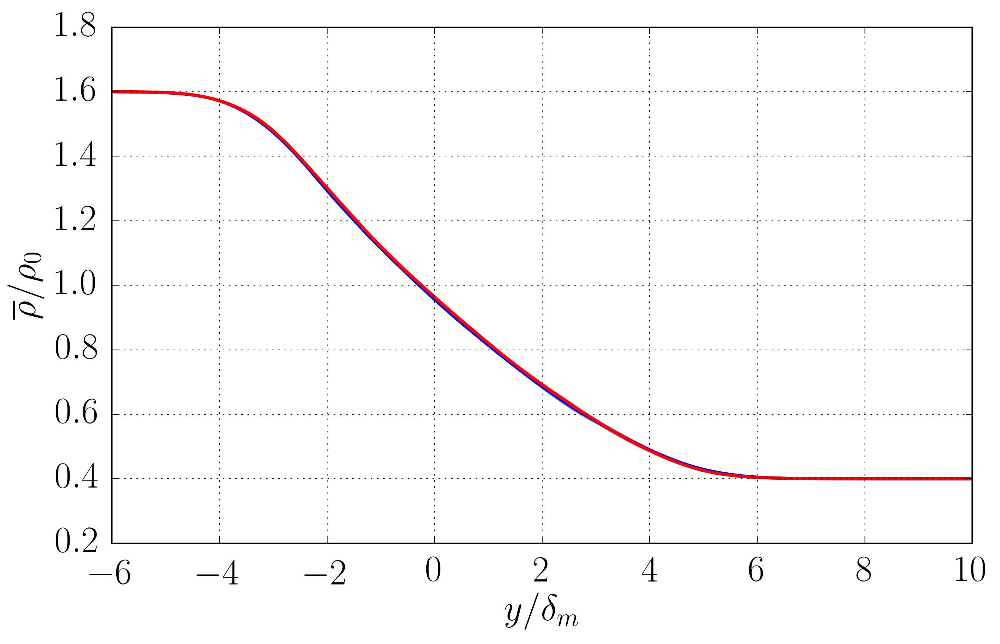

In [333]:
ycases,fSS,errorSS = getSScase2(p_folders,lcases,variable,scaling,SS1,SS2)
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);plt.ylabel(ylabel,rotation='vertical');
#plt.plot(rhos20pantano[:,0]/conv[1],rhos20pantano[:,1],'b.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos40pantano[:,0]/conv[2],rhos40pantano[:,1],'g.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos80pantano[:,0]/conv[3],rhos80pantano[:,1],'r.',markevery=1,alpha=1.0,ms=8)
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1,1.5])
plt.grid('on')
sigma = 1.
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    plt.plot(ycases[icase][0],fSS[icase],l_case_style[icase],lw=2.0)
    plt.fill_between(ycases[icase][0], fSS[icase]-sigma*errorSS[icase], fSS[icase]+sigma*errorSS[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])
if PRINT == True:

    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure %s saved!" %pathname
    #Save with STD
    for icase in range(len(lcases)):
        plt.fill_between(ycases[icase][0], (fSS[icase]+errorSS[icase]), (fSS[icase]-errorSS[icase]),color=l_case_color[icase],alpha=0.2)
    pathname = save_folder + figname + 'std' + fformat
    print "figure %s saved!" %pathname
    fig.savefig(pathname,bbox_inches='tight')

39 78
53 74
36 77
64 105
69 100
68 113
figure /share/drive/toni/EFMC11/Tm_s40.pdf saved!
figure /share/drive/toni/EFMC11/Tm_s40std.pdf saved!


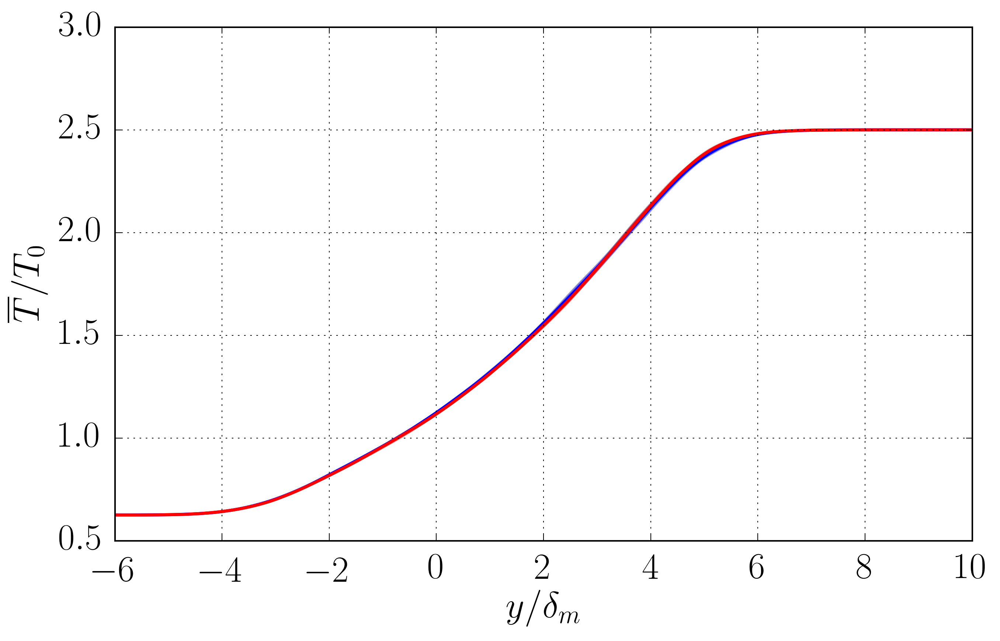

In [335]:
variable = 'Tm' #any vector variable available
scaling  = 'dm' #can be dw or dm
xlabel =r'$y/\delta_m$'
ylabel =r'$\overline{T}/{T_0}$'
varname ='Tm'
figname = '%s_%s'%(varname,namecase)
#ylabel = r"y"
#figname = 'rhom_ave.eps'
derivative = False

ycases,fSS,errorSS = getSScase2(p_folders,lcases,variable,scaling,SS1,SS2)
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);plt.ylabel(ylabel,rotation='vertical');
#plt.plot(rhos20pantano[:,0]/conv[1],rhos20pantano[:,1],'b.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos40pantano[:,0]/conv[2],rhos40pantano[:,1],'g.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos80pantano[:,0]/conv[3],rhos80pantano[:,1],'r.',markevery=1,alpha=1.0,ms=8)
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1,1.5])
plt.grid('on')
sigma = 1.
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    plt.plot(ycases[icase][0],fSS[icase],l_case_style[icase],lw=2.0)
    plt.fill_between(ycases[icase][0], fSS[icase]-sigma*errorSS[icase], fSS[icase]+sigma*errorSS[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])
if PRINT == True:
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure %s saved!" %pathname
    #Save with STD
    for icase in range(len(lcases)):
        plt.fill_between(ycases[icase][0], (fSS[icase]+errorSS[icase]), (fSS[icase]-errorSS[icase]),color=l_case_color[icase],alpha=0.2)
    pathname = save_folder + figname + 'std' + fformat
    print "figure %s saved!" %pathname
    fig.savefig(pathname,bbox_inches='tight')

39 78
53 74
36 77
64 105
69 100
68 113
39 78
53 74
36 77
64 105
69 100
68 113
figure /share/drive/toni/EFMC11/nu_s40.pdf saved!
figure /share/drive/toni/EFMC11/nu_s40std.pdf saved!


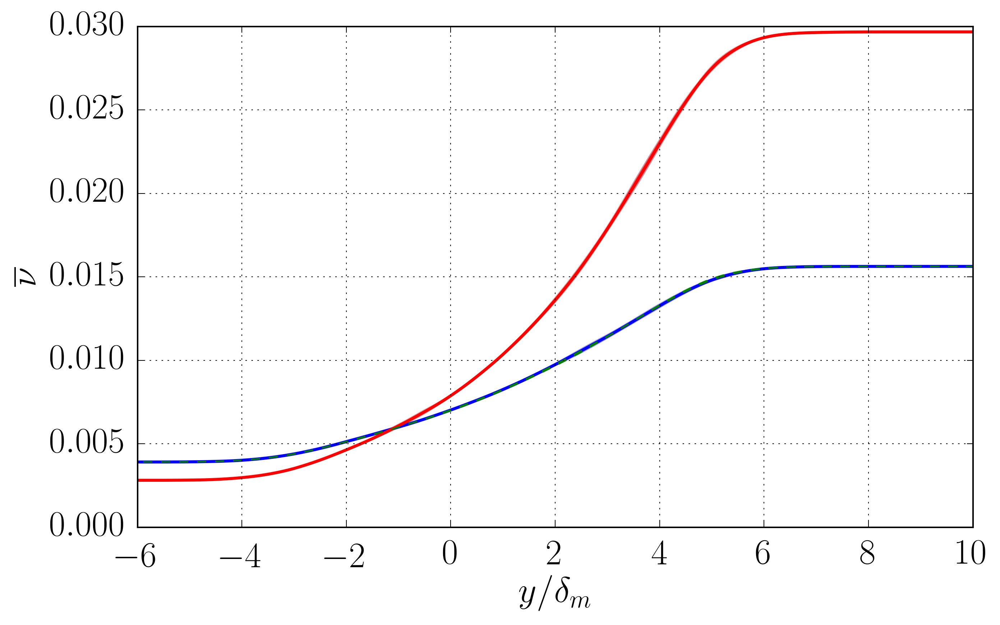

In [567]:
variable = 'nu' #any vector variable available
scaling  = 'dm' #can be dw or dm
xlabel =r'$y/\delta_m$'
ylabel =r'$\overline{\nu}$'
varname ='nu'
figname = '%s_%s'%(varname,namecase)
#ylabel = r"y"
#figname = 'rhom_ave.eps'
derivative = False

ycases,fSS,errorSS = getSScase2(p_folders,lcases,variable,scaling,SS1,SS2)
yrho,fSSrho,errorSSrho = getSScase2(p_folders,lcases,'Tm',scaling,SS1,SS2)
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);plt.ylabel(ylabel,rotation='vertical');
#plt.plot(rhos20pantano[:,0]/conv[1],rhos20pantano[:,1],'b.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos40pantano[:,0]/conv[2],rhos40pantano[:,1],'g.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos80pantano[:,0]/conv[3],rhos80pantano[:,1],'r.',markevery=1,alpha=1.0,ms=8)
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1,1.5])
plt.grid('on')
sigma = 1.
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    plt.plot(ycases[icase][0],fSS[icase],l_case_style[icase],lw=2.0)
    #plt.plot(yrho[icase][0],np.multiply(fSSrho[icase],1.0/160.0),'g--')
    plt.fill_between(ycases[icase][0], fSS[icase]-sigma*errorSS[icase], fSS[icase]+sigma*errorSS[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])
if PRINT == True:
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure %s saved!" %pathname
    #Save with STD
    for icase in range(len(lcases)):
        plt.fill_between(ycases[icase][0], (fSS[icase]+errorSS[icase]), (fSS[icase]-errorSS[icase]),color=l_case_color[icase],alpha=0.2)
    pathname = save_folder + figname + 'std' + fformat
    print "figure %s saved!" %pathname
    fig.savefig(pathname,bbox_inches='tight')

39 78
53 74
36 77
64 105
69 100
68 113
figure /share/drive/toni/EFMC11/ufavre_s40.pdf saved!
figure /share/drive/toni/EFMC11/ufavre_s40std.pdf saved!


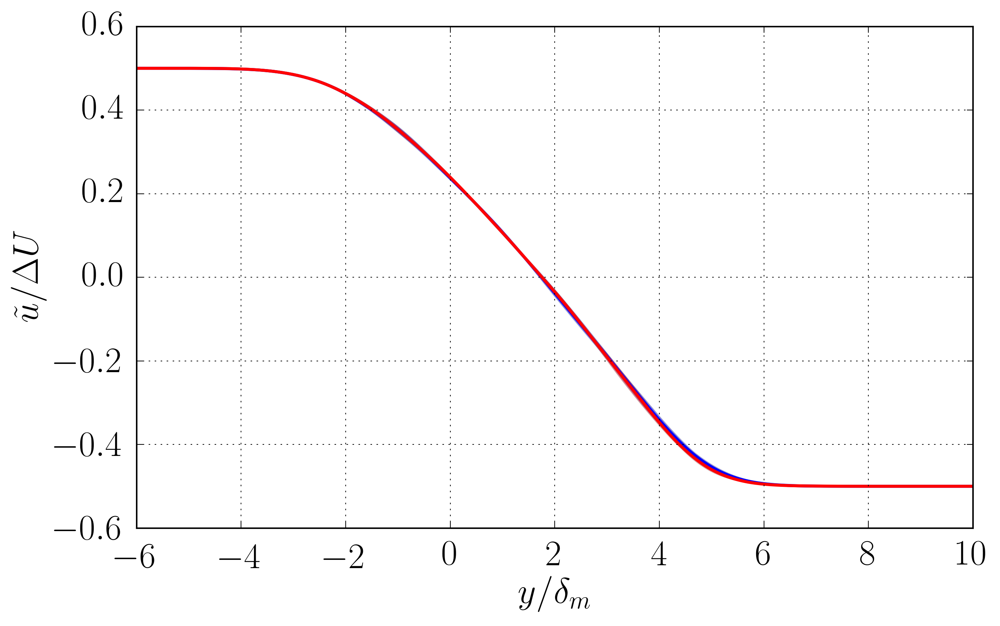

In [345]:
variable = 'rum2' #any vector variable available
scaling  = 'dm' #can be dw or dm
xlabel =r'$y/\delta_m$'
ylabel =r'$\tilde{u}/\Delta U$'
varname ='ufavre'
figname = '%s_%s'%(varname,namecase)
#ylabel = r"y"
#figname = 'rhom_ave.eps'
derivative = False

ycases,fSS,errorSS = getSScase2(p_folders,lcases,variable,scaling,SS1,SS2)
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);plt.ylabel(ylabel,rotation='vertical');
#plt.plot(rhos20pantano[:,0]/conv[1],rhos20pantano[:,1],'b.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos40pantano[:,0]/conv[2],rhos40pantano[:,1],'g.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos80pantano[:,0]/conv[3],rhos80pantano[:,1],'r.',markevery=1,alpha=1.0,ms=8)
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1,1.5])
plt.grid('on')
sigma = 1
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    plt.plot(ycases[icase][0],fSS[icase],l_case_style[icase],lw=2.0)
    plt.fill_between(ycases[icase][0], fSS[icase]-sigma*errorSS[icase], fSS[icase]+sigma*errorSS[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])
if PRINT == True:
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure %s saved!" %pathname
    #Save with STD
    for icase in range(len(lcases)):
        plt.fill_between(ycases[icase][0], (fSS[icase]+errorSS[icase]), (fSS[icase]-errorSS[icase]),color=l_case_color[icase],alpha=0.2)
    pathname = save_folder + figname + 'std' + fformat
    print "figure %s saved!" %pathname
    fig.savefig(pathname,bbox_inches='tight')

In [351]:
print variable[0:2]=='fl'

True


39 78
53 74
36 77
64 105
69 100
68 113
figure /share/drive/toni/EFMC11/urms_s40.pdf saved!
figure /share/drive/toni/EFMC11/urms_s40std.pdf saved!


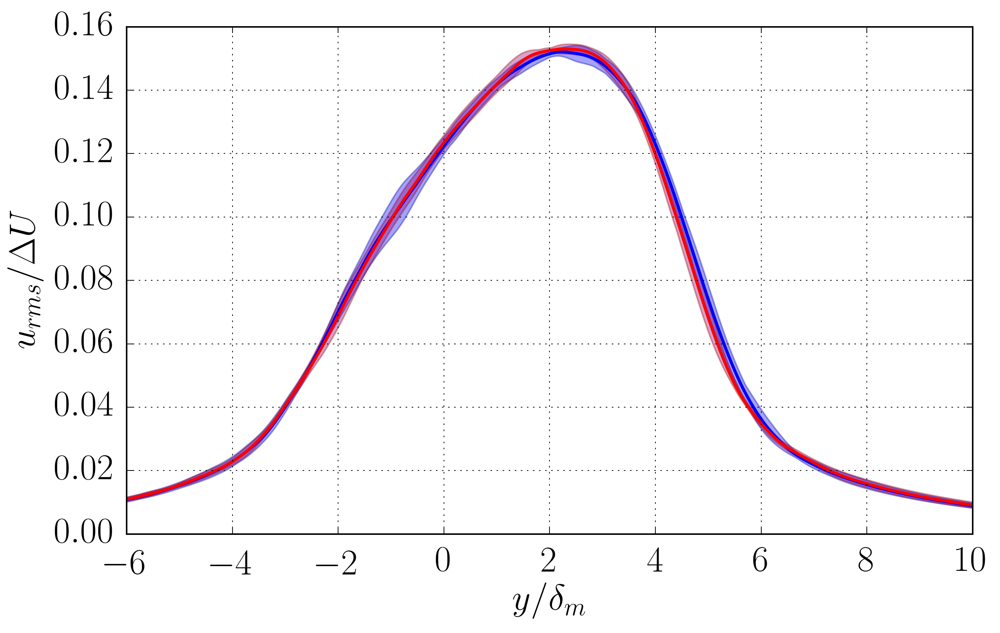

In [365]:
variable = 'urms' #any vector variable available
scaling  = 'dm' #can be dw or dm
xlabel =r'$y/\delta_m$'
ylabel =r'$u_{rms}/\Delta U$'
varname ='urms'
figname = '%s_%s'%(varname,namecase)
#ylabel = r"y"
#figname = 'rhom_ave.eps'
derivative = False

ycases,fSS,errorSS = getSScase2(p_folders,lcases,variable,scaling,SS1,SS2)
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);plt.ylabel(ylabel,rotation='vertical');
#plt.plot(rhos20pantano[:,0]/conv[1],rhos20pantano[:,1],'b.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos40pantano[:,0]/conv[2],rhos40pantano[:,1],'g.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos80pantano[:,0]/conv[3],rhos80pantano[:,1],'r.',markevery=1,alpha=1.0,ms=8)
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1,1.5])
plt.grid('on')
sigma = 1
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    plt.plot(ycases[icase][0],fSS[icase],l_case_style[icase],lw=2.0)
    plt.fill_between(ycases[icase][0], fSS[icase]-sigma*errorSS[icase], fSS[icase]+sigma*errorSS[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])
if PRINT == True:
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure %s saved!" %pathname
    #Save with STD
    for icase in range(len(lcases)):
        plt.fill_between(ycases[icase][0], (fSS[icase]+errorSS[icase]), (fSS[icase]-errorSS[icase]),color=l_case_color[icase],alpha=0.2)
    pathname = save_folder + figname + 'std' + fformat
    print "figure %s saved!" %pathname
    fig.savefig(pathname,bbox_inches='tight')

39 78
53 74
36 77
64 105
69 100
68 113
figure /share/drive/toni/EFMC11/R11_s40.pdf saved!
figure /share/drive/toni/EFMC11/R11_s40std.pdf saved!


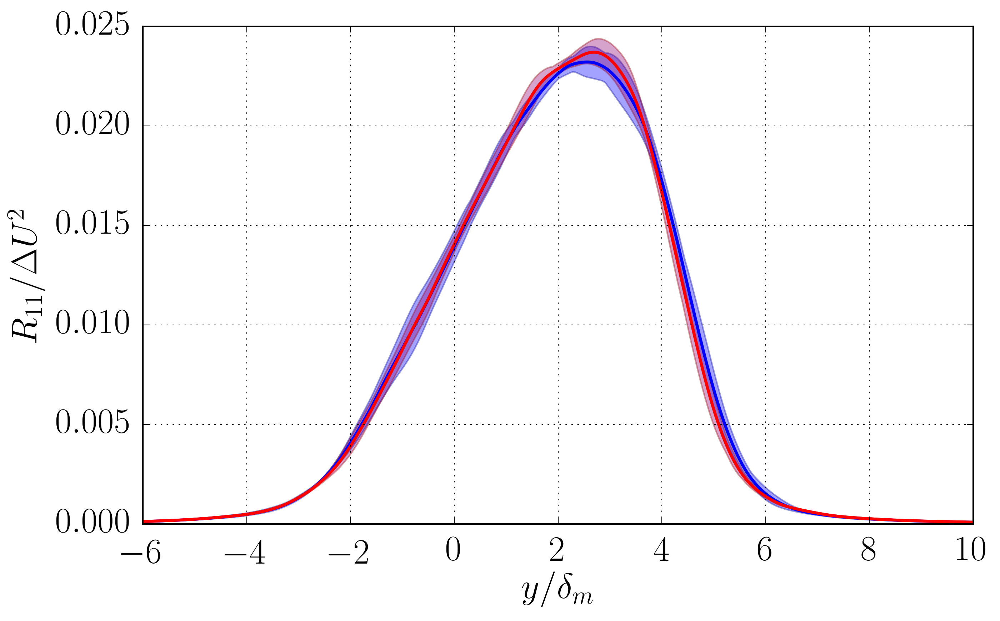

In [361]:
variable = 'R11' #any vector variable available
scaling  = 'dm' #can be dw or dm
xlabel =r'$y/\delta_m$'
ylabel =r'$R_{11}/\Delta U^2$'
varname ='R11'
figname = '%s_%s'%(varname,namecase)
#ylabel = r"y"
#figname = 'rhom_ave.eps'
derivative = False

ycases,fSS,errorSS = getSScase2(p_folders,lcases,variable,scaling,SS1,SS2)
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);plt.ylabel(ylabel,rotation='vertical');
#plt.plot(rhos20pantano[:,0]/conv[1],rhos20pantano[:,1],'b.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos40pantano[:,0]/conv[2],rhos40pantano[:,1],'g.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos80pantano[:,0]/conv[3],rhos80pantano[:,1],'r.',markevery=1,alpha=1.0,ms=8)
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1,1.5])
plt.grid('on')
sigma = 1
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    plt.plot(ycases[icase][0],fSS[icase],l_case_style[icase],lw=2.0)
    plt.fill_between(ycases[icase][0], fSS[icase]-sigma*errorSS[icase], fSS[icase]+sigma*errorSS[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])
if PRINT == True:
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure %s saved!" %pathname
    #Save with STD
    for icase in range(len(lcases)):
        plt.fill_between(ycases[icase][0], (fSS[icase]+errorSS[icase]), (fSS[icase]-errorSS[icase]),color=l_case_color[icase],alpha=0.2)
    pathname = save_folder + figname + 'std' + fformat
    print "figure %s saved!" %pathname
    fig.savefig(pathname,bbox_inches='tight')

39 78
53 74
36 77
64 105
69 100
68 113
figure /share/drive/toni/EFMC11/R22_s40.pdf saved!
figure /share/drive/toni/EFMC11/R22_s40std.pdf saved!


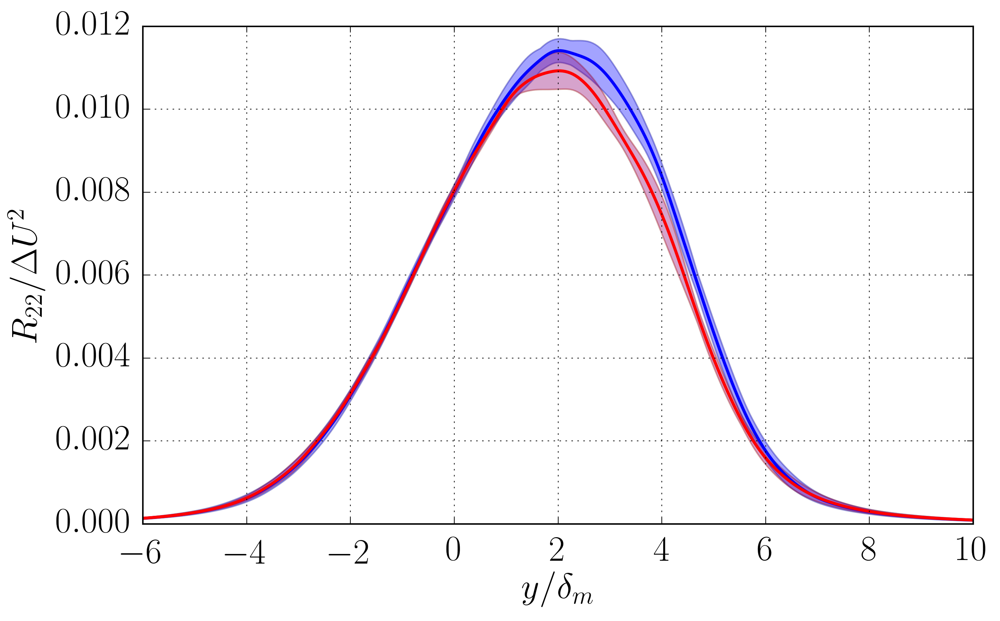

In [362]:
variable = 'R22' #any vector variable available
scaling  = 'dm' #can be dw or dm
xlabel =r'$y/\delta_m$'
ylabel =r'$R_{22}/\Delta U^2$'
varname ='R22'
figname = '%s_%s'%(varname,namecase)
#ylabel = r"y"
#figname = 'rhom_ave.eps'
derivative = False

ycases,fSS,errorSS = getSScase2(p_folders,lcases,variable,scaling,SS1,SS2)
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);plt.ylabel(ylabel,rotation='vertical');
#plt.plot(rhos20pantano[:,0]/conv[1],rhos20pantano[:,1],'b.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos40pantano[:,0]/conv[2],rhos40pantano[:,1],'g.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos80pantano[:,0]/conv[3],rhos80pantano[:,1],'r.',markevery=1,alpha=1.0,ms=8)
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1,1.5])
plt.grid('on')
sigma = 1
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    plt.plot(ycases[icase][0],fSS[icase],l_case_style[icase],lw=2.0)
    plt.fill_between(ycases[icase][0], fSS[icase]-sigma*errorSS[icase], fSS[icase]+sigma*errorSS[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])
if PRINT == True:
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure %s saved!" %pathname
    #Save with STD
    for icase in range(len(lcases)):
        plt.fill_between(ycases[icase][0], (fSS[icase]+errorSS[icase]), (fSS[icase]-errorSS[icase]),color=l_case_color[icase],alpha=0.2)
    pathname = save_folder + figname + 'std' + fformat
    print "figure %s saved!" %pathname
    fig.savefig(pathname,bbox_inches='tight')

39 78
53 74
36 77
64 105
69 100
68 113
figure /share/drive/toni/EFMC11/R33_s40.pdf saved!
figure /share/drive/toni/EFMC11/R33_s40std.pdf saved!


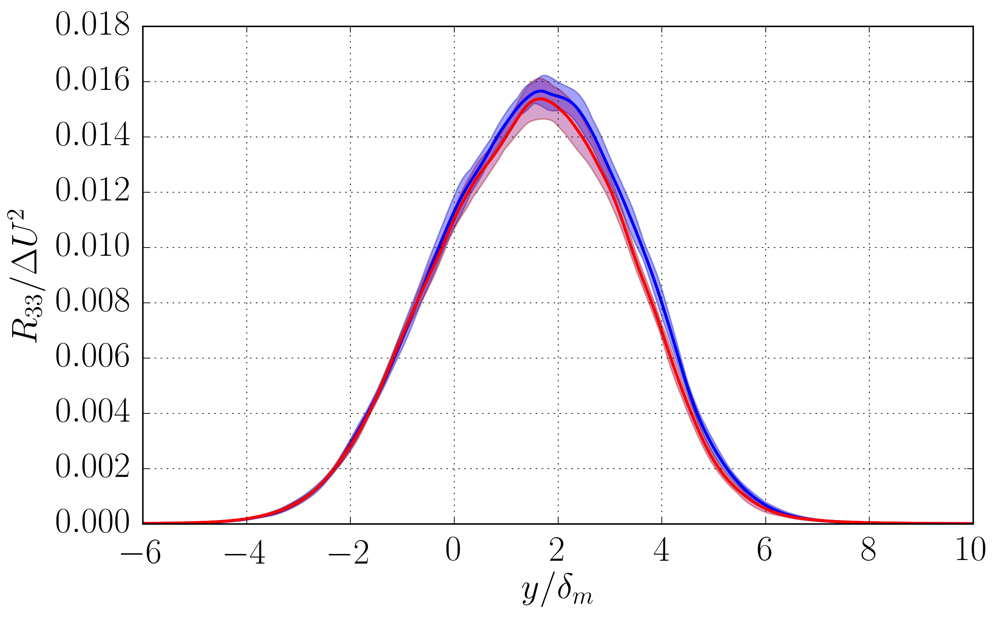

In [363]:
variable = 'R33' #any vector variable available
scaling  = 'dm' #can be dw or dm
xlabel =r'$y/\delta_m$'
ylabel =r'$R_{33}/\Delta U^2$'
varname ='R33'
figname = '%s_%s'%(varname,namecase)
#ylabel = r"y"
#figname = 'rhom_ave.eps'
derivative = False

ycases,fSS,errorSS = getSScase2(p_folders,lcases,variable,scaling,SS1,SS2)
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);plt.ylabel(ylabel,rotation='vertical');
#plt.plot(rhos20pantano[:,0]/conv[1],rhos20pantano[:,1],'b.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos40pantano[:,0]/conv[2],rhos40pantano[:,1],'g.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos80pantano[:,0]/conv[3],rhos80pantano[:,1],'r.',markevery=1,alpha=1.0,ms=8)
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1,1.5])
plt.grid('on')
sigma = 1
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    plt.plot(ycases[icase][0],fSS[icase],l_case_style[icase],lw=2.0)
    plt.fill_between(ycases[icase][0], fSS[icase]-sigma*errorSS[icase], fSS[icase]+sigma*errorSS[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])
if PRINT == True:
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure %s saved!" %pathname
    #Save with STD
    for icase in range(len(lcases)):
        plt.fill_between(ycases[icase][0], (fSS[icase]+errorSS[icase]), (fSS[icase]-errorSS[icase]),color=l_case_color[icase],alpha=0.2)
    pathname = save_folder + figname + 'std' + fformat
    print "figure %s saved!" %pathname
    fig.savefig(pathname,bbox_inches='tight')

39 78
53 74
36 77
64 105
69 100
68 113
figure /share/drive/toni/EFMC11/R12_s40.pdf saved!
figure /share/drive/toni/EFMC11/R12_s40std.pdf saved!


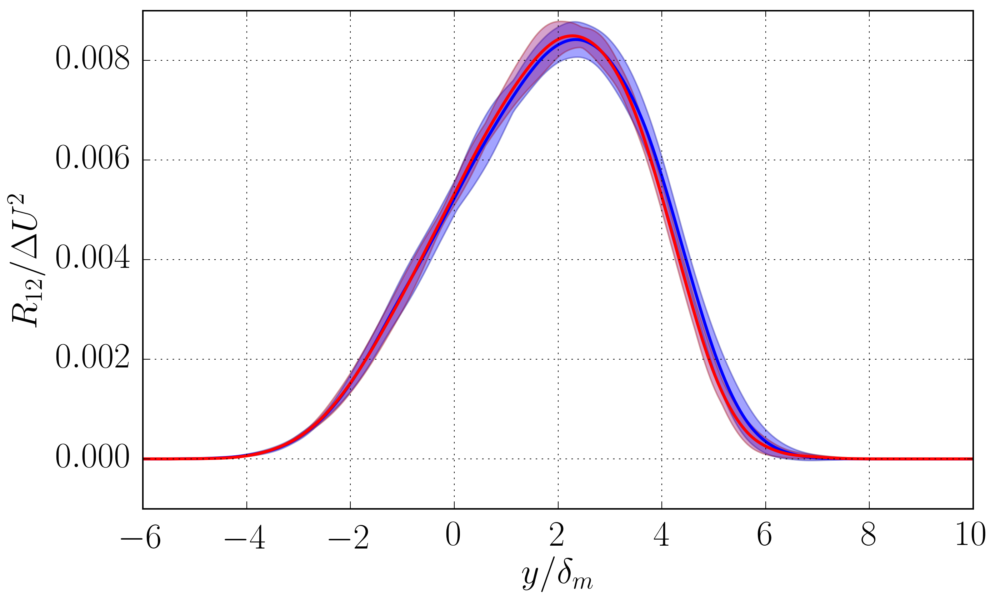

In [364]:
variable = 'R12' #any vector variable available
scaling  = 'dm' #can be dw or dm
xlabel =r'$y/\delta_m$'
ylabel =r'$R_{12}/\Delta U^2$'
varname ='R12'
figname = '%s_%s'%(varname,namecase)
#ylabel = r"y"
#figname = 'rhom_ave.eps'
derivative = False

ycases,fSS,errorSS = getSScase2(p_folders,lcases,variable,scaling,SS1,SS2)
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);plt.ylabel(ylabel,rotation='vertical');
#plt.plot(rhos20pantano[:,0]/conv[1],rhos20pantano[:,1],'b.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos40pantano[:,0]/conv[2],rhos40pantano[:,1],'g.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos80pantano[:,0]/conv[3],rhos80pantano[:,1],'r.',markevery=1,alpha=1.0,ms=8)
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1,1.5])
plt.grid('on')
sigma = 1
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    plt.plot(ycases[icase][0],fSS[icase],l_case_style[icase],lw=2.0)
    plt.fill_between(ycases[icase][0], fSS[icase]-sigma*errorSS[icase], fSS[icase]+sigma*errorSS[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])
if PRINT == True:
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure %s saved!" %pathname
    #Save with STD
    for icase in range(len(lcases)):
        plt.fill_between(ycases[icase][0], (fSS[icase]+errorSS[icase]), (fSS[icase]-errorSS[icase]),color=l_case_color[icase],alpha=0.2)
    pathname = save_folder + figname + 'std' + fformat
    print "figure %s saved!" %pathname
    fig.savefig(pathname,bbox_inches='tight')

# Turbulent mass flux
## one measure of deviation caused by the variable-density nature of the flow.

39 78
53 74
36 77
64 105
69 100
68 113
figure /share/drive/toni/EFMC11/uflux_s40.pdf saved!
figure /share/drive/toni/EFMC11/uflux_s40std.pdf saved!


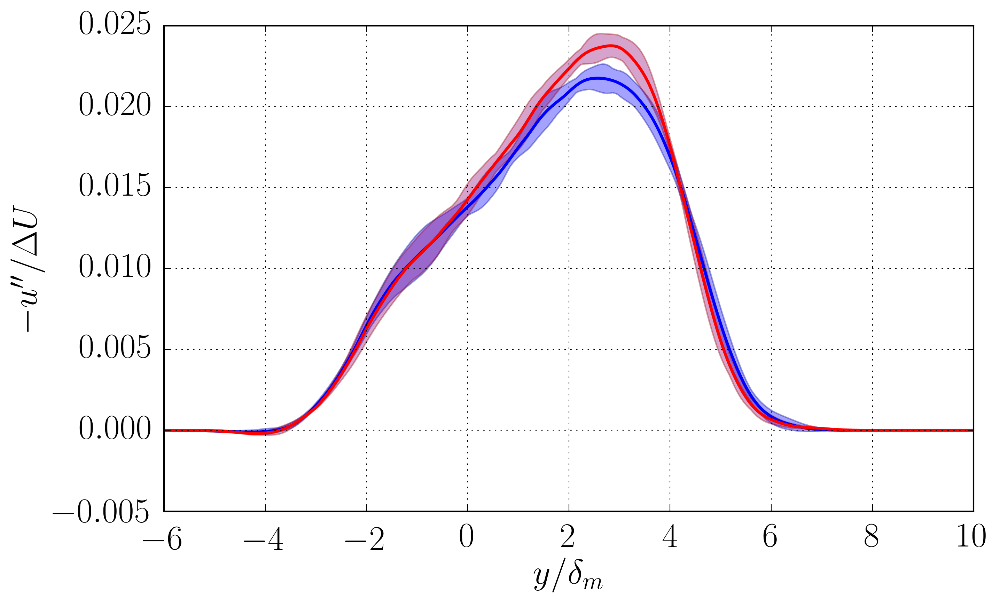

In [359]:
variable = 'flu' #any vector variable available
scaling  = 'dm' #can be dw or dm
xlabel =r'$y/\delta_m$'
ylabel =r'$-u^{\prime \prime}/\Delta U$'
varname ='uflux'
figname = '%s_%s'%(varname,namecase)
#ylabel = r"y"
#figname = 'rhom_ave.eps'
derivative = False

ycases,fSS,errorSS = getSScase2(p_folders,lcases,variable,scaling,SS1,SS2)
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);plt.ylabel(ylabel,rotation='vertical');
#plt.plot(rhos20pantano[:,0]/conv[1],rhos20pantano[:,1],'b.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos40pantano[:,0]/conv[2],rhos40pantano[:,1],'g.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos80pantano[:,0]/conv[3],rhos80pantano[:,1],'r.',markevery=1,alpha=1.0,ms=8)
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1,1.5])
plt.grid('on')
sigma = 1
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    plt.plot(ycases[icase][0],fSS[icase],l_case_style[icase],lw=2.0)
    plt.fill_between(ycases[icase][0], fSS[icase]-sigma*errorSS[icase], fSS[icase]+sigma*errorSS[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])
if PRINT == True:
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure %s saved!" %pathname
    #Save with STD
    for icase in range(len(lcases)):
        plt.fill_between(ycases[icase][0], (fSS[icase]+errorSS[icase]), (fSS[icase]-errorSS[icase]),color=l_case_color[icase],alpha=0.2)
    pathname = save_folder + figname + 'std' + fformat
    print "figure %s saved!" %pathname
    fig.savefig(pathname,bbox_inches='tight')

39 78
53 74
36 77
64 105
69 100
68 113
figure /share/drive/toni/EFMC11/vflux_s40.pdf saved!
figure /share/drive/toni/EFMC11/vflux_s40std.pdf saved!


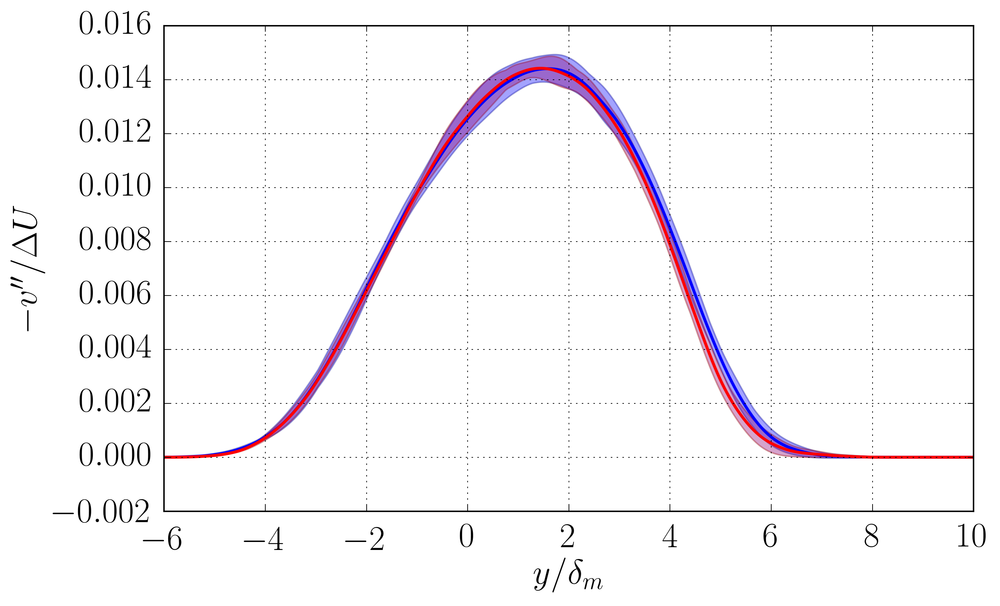

In [360]:
variable = 'flv' #any vector variable available
scaling  = 'dm' #can be dw or dm
xlabel =r'$y/\delta_m$'
ylabel =r'$-v^{\prime \prime}/\Delta U$'
varname ='vflux'
figname = '%s_%s'%(varname,namecase)
#ylabel = r"y"
#figname = 'rhom_ave.eps'
derivative = False

ycases,fSS,errorSS = getSScase2(p_folders,lcases,variable,scaling,SS1,SS2)
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);plt.ylabel(ylabel,rotation='vertical');
#plt.plot(rhos20pantano[:,0]/conv[1],rhos20pantano[:,1],'b.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos40pantano[:,0]/conv[2],rhos40pantano[:,1],'g.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos80pantano[:,0]/conv[3],rhos80pantano[:,1],'r.',markevery=1,alpha=1.0,ms=8)
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1,1.5])
plt.grid('on')
sigma = 1
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    plt.plot(ycases[icase][0],fSS[icase],l_case_style[icase],lw=2.0)
    plt.fill_between(ycases[icase][0], fSS[icase]-sigma*errorSS[icase], fSS[icase]+sigma*errorSS[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])
if PRINT == True:
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure %s saved!" %pathname
    #Save with STD
    for icase in range(len(lcases)):
        plt.fill_between(ycases[icase][0], (fSS[icase]+errorSS[icase]), (fSS[icase]-errorSS[icase]),color=l_case_color[icase],alpha=0.2)
    pathname = save_folder + figname + 'std' + fformat
    print "figure %s saved!" %pathname
    fig.savefig(pathname,bbox_inches='tight')

39 78
53 74
36 77
64 105
69 100
68 113
figure /share/drive/toni/EFMC11/wflux_s40.pdf saved!
figure /share/drive/toni/EFMC11/wflux_s40std.pdf saved!


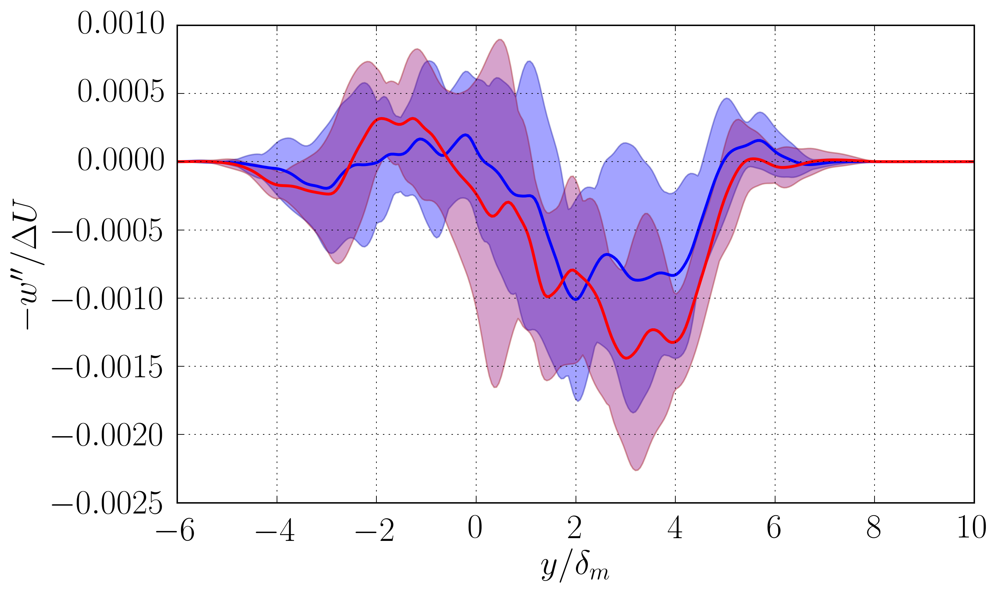

In [366]:
variable = 'flw' #any vector variable available
scaling  = 'dm' #can be dw or dm
xlabel =r'$y/\delta_m$'
ylabel =r'$-w^{\prime \prime}/\Delta U$'
varname ='wflux'
figname = '%s_%s'%(varname,namecase)
#ylabel = r"y"
#figname = 'rhom_ave.eps'
derivative = False

ycases,fSS,errorSS = getSScase2(p_folders,lcases,variable,scaling,SS1,SS2)
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);plt.ylabel(ylabel,rotation='vertical');
#plt.plot(rhos20pantano[:,0]/conv[1],rhos20pantano[:,1],'b.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos40pantano[:,0]/conv[2],rhos40pantano[:,1],'g.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos80pantano[:,0]/conv[3],rhos80pantano[:,1],'r.',markevery=1,alpha=1.0,ms=8)
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1,1.5])
plt.grid('on')
sigma = 1
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    plt.plot(ycases[icase][0],fSS[icase],l_case_style[icase],lw=2.0)
    plt.fill_between(ycases[icase][0], fSS[icase]-sigma*errorSS[icase], fSS[icase]+sigma*errorSS[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])
if PRINT == True:
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure %s saved!" %pathname
    #Save with STD
    for icase in range(len(lcases)):
        plt.fill_between(ycases[icase][0], (fSS[icase]+errorSS[icase]), (fSS[icase]-errorSS[icase]),color=l_case_color[icase],alpha=0.2)
    pathname = save_folder + figname + 'std' + fformat
    print "figure %s saved!" %pathname
    fig.savefig(pathname,bbox_inches='tight')

39 78
Multiplying by scaling
53 74
Multiplying by scaling
36 77
Multiplying by scaling
64 105
Multiplying by scaling
69 100
Multiplying by scaling
68 113
Multiplying by scaling
figure /share/drive/toni/EFMC11/vorz_s40.pdf saved!
figure /share/drive/toni/EFMC11/vorz_s40std.pdf saved!


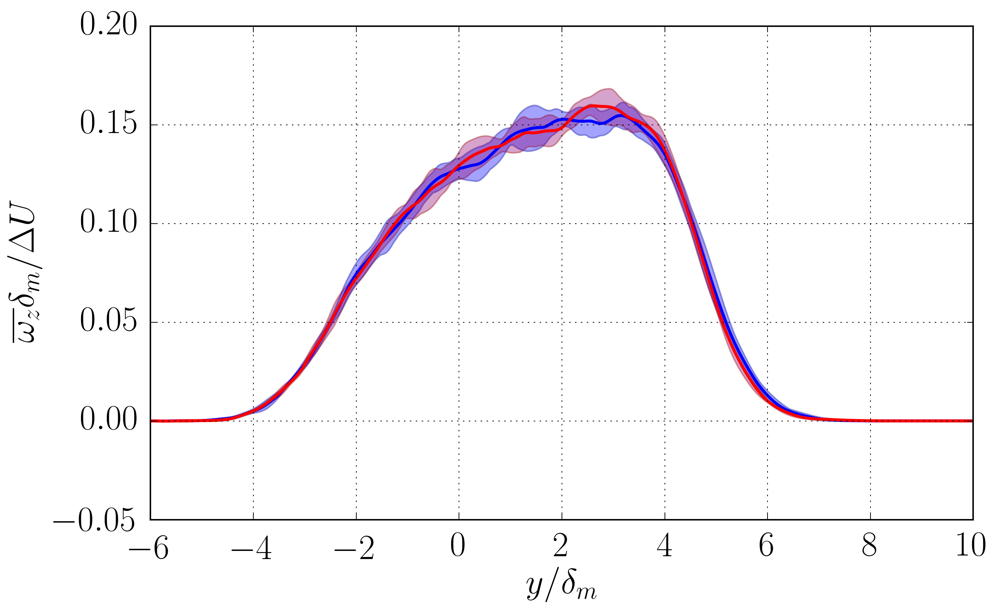

In [367]:
variable = 'w3m' #any vector variable available
scaling  = 'dm' #can be dw or dm
xlabel =r'$y/\delta_m$'
ylabel =r'$\overline{\omega_z}\delta_m/\Delta U$'
varname ='vorz'
figname = '%s_%s'%(varname,namecase)
#ylabel = r"y"
#figname = 'rhom_ave.eps'
derivative = False

ycases,fSS,errorSS = getSScase2(p_folders,lcases,variable,scaling,SS1,SS2)
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);plt.ylabel(ylabel,rotation='vertical');
#plt.plot(rhos20pantano[:,0]/conv[1],rhos20pantano[:,1],'b.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos40pantano[:,0]/conv[2],rhos40pantano[:,1],'g.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos80pantano[:,0]/conv[3],rhos80pantano[:,1],'r.',markevery=1,alpha=1.0,ms=8)
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1,1.5])
plt.grid('on')
sigma = 1
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    plt.plot(ycases[icase][0],fSS[icase],l_case_style[icase],lw=2.0)
    plt.fill_between(ycases[icase][0], fSS[icase]-sigma*errorSS[icase], fSS[icase]+sigma*errorSS[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])
if PRINT == True:
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure %s saved!" %pathname
    #Save with STD
    for icase in range(len(lcases)):
        plt.fill_between(ycases[icase][0], (fSS[icase]+errorSS[icase]), (fSS[icase]-errorSS[icase]),color=l_case_color[icase],alpha=0.2)
    pathname = save_folder + figname + 'std' + fformat
    print "figure %s saved!" %pathname
    fig.savefig(pathname,bbox_inches='tight')

39 78
Multiplying by scaling
53 74
Multiplying by scaling
36 77
Multiplying by scaling
64 105
Multiplying by scaling
69 100
Multiplying by scaling
68 113
Multiplying by scaling
figure /share/drive/toni/EFMC11/vorzrms_s40.pdf saved!
figure /share/drive/toni/EFMC11/vorzrms_s40std.pdf saved!


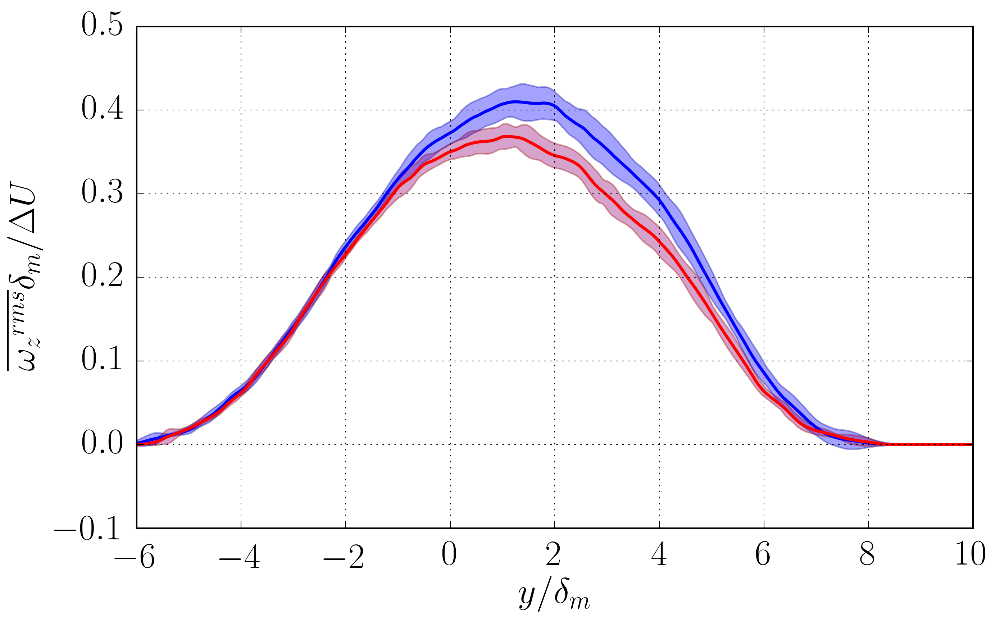

In [616]:
variable = 'w3rms' #any vector variable available
scaling  = 'dm' #can be dw or dm
xlabel =r'$y/\delta_m$'
ylabel =r'$\overline{{\omega_z}^{rms}}\delta_m/\Delta U$'
varname ='vorzrms'
figname = '%s_%s'%(varname,namecase)
#ylabel = r"y"
#figname = 'rhom_ave.eps'
derivative = False

ycases,fSS,errorSS = getSScase2(p_folders,lcases,variable,scaling,SS1,SS2)
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);plt.ylabel(ylabel,rotation='vertical');
#plt.plot(rhos20pantano[:,0]/conv[1],rhos20pantano[:,1],'b.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos40pantano[:,0]/conv[2],rhos40pantano[:,1],'g.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos80pantano[:,0]/conv[3],rhos80pantano[:,1],'r.',markevery=1,alpha=1.0,ms=8)
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1,1.5])
plt.grid('on')
sigma = 1
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    plt.plot(ycases[icase][0],fSS[icase],l_case_style[icase],lw=2.0)
    plt.fill_between(ycases[icase][0], fSS[icase]-sigma*errorSS[icase], fSS[icase]+sigma*errorSS[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])
if PRINT == True:
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure %s saved!" %pathname
    #Save with STD
    for icase in range(len(lcases)):
        plt.fill_between(ycases[icase][0], (fSS[icase]+errorSS[icase]), (fSS[icase]-errorSS[icase]),color=l_case_color[icase],alpha=0.2)
    pathname = save_folder + figname + 'std' + fformat
    print "figure %s saved!" %pathname
    fig.savefig(pathname,bbox_inches='tight')

39 78
Multiplying by scaling
53 74
Multiplying by scaling
36 77
Multiplying by scaling
64 105
Multiplying by scaling
69 100
Multiplying by scaling
68 113
Multiplying by scaling
figure /share/drive/toni/EFMC11/epR_s40.pdf saved!
figure /share/drive/toni/EFMC11/epR_s40std.pdf saved!


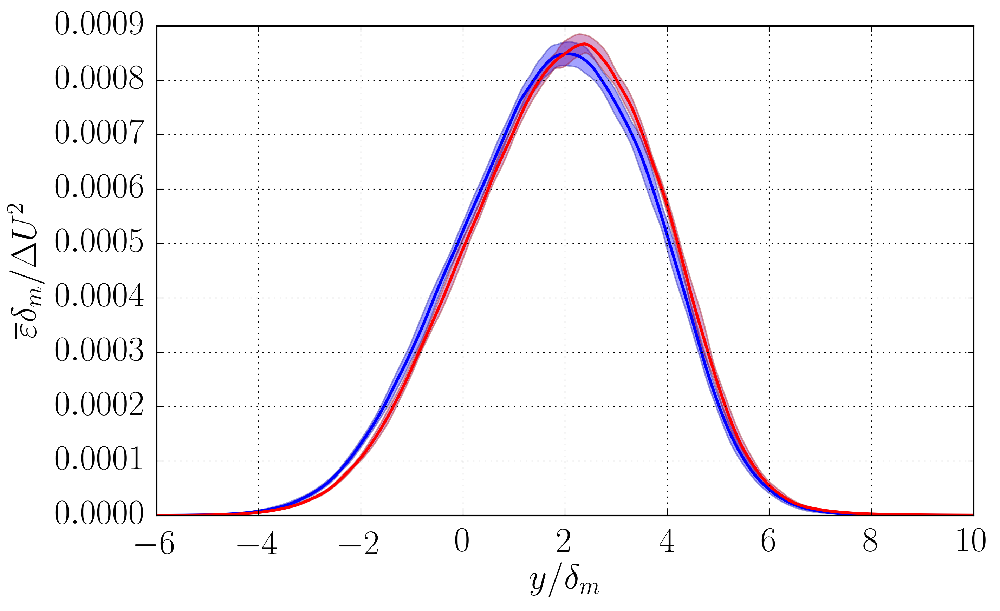

In [368]:
variable = 'epR' #any vector variable available
scaling  = 'dm' #can be dw or dm
xlabel =r'$y/\delta_m$'
ylabel =r'$\overline{\varepsilon}\delta_m/\Delta U^2$'
varname ='epR'
figname = '%s_%s'%(varname,namecase)
#ylabel = r"y"
#figname = 'rhom_ave.eps'
derivative = False

ycases,fSS,errorSS = getSScase2(p_folders,lcases,variable,scaling,SS1,SS2)
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);plt.ylabel(ylabel,rotation='vertical');
#plt.plot(rhos20pantano[:,0]/conv[1],rhos20pantano[:,1],'b.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos40pantano[:,0]/conv[2],rhos40pantano[:,1],'g.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos80pantano[:,0]/conv[3],rhos80pantano[:,1],'r.',markevery=1,alpha=1.0,ms=8)
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1,1.5])
plt.grid('on')
sigma = 1
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    plt.plot(ycases[icase][0],fSS[icase],l_case_style[icase],lw=2.0)
    plt.fill_between(ycases[icase][0], fSS[icase]-sigma*errorSS[icase], fSS[icase]+sigma*errorSS[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])
if PRINT == True:
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure %s saved!" %pathname
    #Save with STD
    for icase in range(len(lcases)):
        plt.fill_between(ycases[icase][0], (fSS[icase]+errorSS[icase]), (fSS[icase]-errorSS[icase]),color=l_case_color[icase],alpha=0.2)
    pathname = save_folder + figname + 'std' + fformat
    print "figure %s saved!" %pathname
    fig.savefig(pathname,bbox_inches='tight')

39 78
Multiplying by scaling
53 74
Multiplying by scaling
36 77
Multiplying by scaling
64 105
Multiplying by scaling
69 100
Multiplying by scaling
68 113
Multiplying by scaling
figure /share/drive/toni/EFMC11/epNH_s40.pdf saved!
figure /share/drive/toni/EFMC11/epNH_s40std.pdf saved!


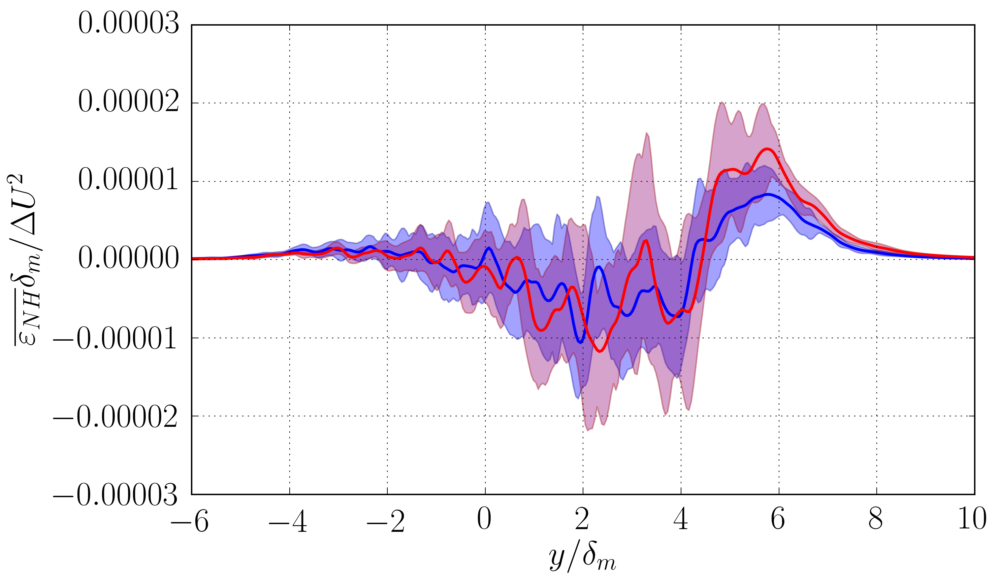

In [369]:
variable = 'epNH' #any vector variable available
scaling  = 'dm' #can be dw or dm
xlabel =r'$y/\delta_m$'
ylabel =r'$\overline{\varepsilon_{NH}}\delta_m/\Delta U^2$'
varname ='epNH'
figname = '%s_%s'%(varname,namecase)
#ylabel = r"y"
#figname = 'rhom_ave.eps'
derivative = False

ycases,fSS,errorSS = getSScase2(p_folders,lcases,variable,scaling,SS1,SS2)
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);plt.ylabel(ylabel,rotation='vertical');
#plt.plot(rhos20pantano[:,0]/conv[1],rhos20pantano[:,1],'b.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos40pantano[:,0]/conv[2],rhos40pantano[:,1],'g.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos80pantano[:,0]/conv[3],rhos80pantano[:,1],'r.',markevery=1,alpha=1.0,ms=8)
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1,1.5])
plt.grid('on')
sigma = 1
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    plt.plot(ycases[icase][0],fSS[icase],l_case_style[icase],lw=2.0)
    plt.fill_between(ycases[icase][0], fSS[icase]-sigma*errorSS[icase], fSS[icase]+sigma*errorSS[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])
if PRINT == True:
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure %s saved!" %pathname
    #Save with STD
    for icase in range(len(lcases)):
        plt.fill_between(ycases[icase][0], (fSS[icase]+errorSS[icase]), (fSS[icase]-errorSS[icase]),color=l_case_color[icase],alpha=0.2)
    pathname = save_folder + figname + 'std' + fformat
    print "figure %s saved!" %pathname
    fig.savefig(pathname,bbox_inches='tight')

39 78
53 74
36 77
64 105
69 100
68 113
figure /share/drive/toni/EFMC11/Trms_s40.pdf saved!
figure /share/drive/toni/EFMC11/Trms_s40std.pdf saved!


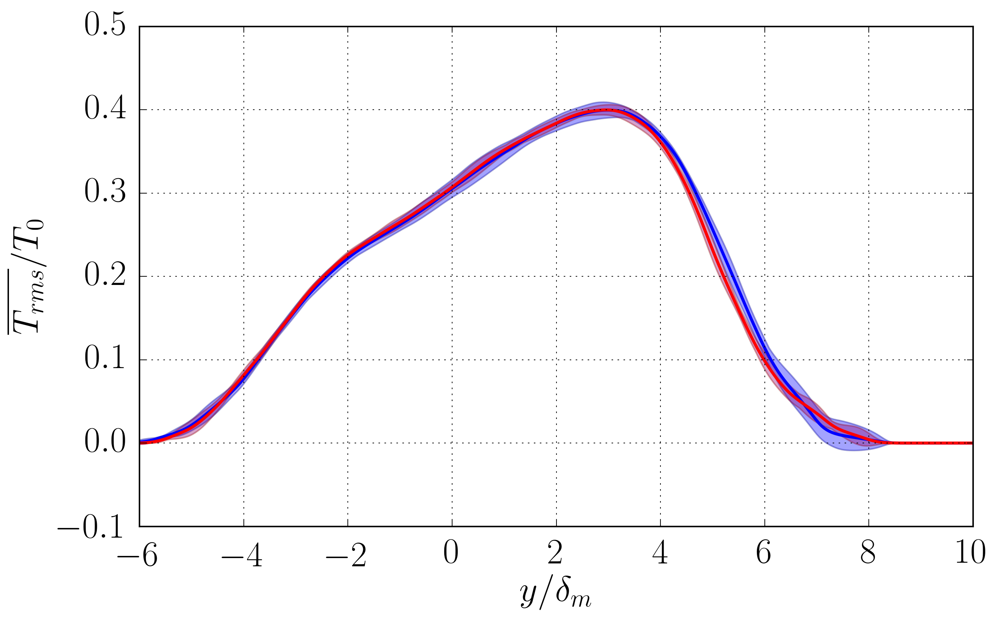

In [455]:
variable = 'Trms' #any vector variable available
scaling  = 'dm' #can be dw or dm
xlabel =r'$y/\delta_m$'
ylabel =r'$\overline{T_{rms}}/T_0$'
varname ='Trms'
figname = '%s_%s'%(varname,namecase)
#ylabel = r"y"
#figname = 'rhom_ave.eps'
derivative = False

ycases,fSS,errorSS = getSScase2(p_folders,lcases,variable,scaling,SS1,SS2)
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);plt.ylabel(ylabel,rotation='vertical');
#plt.plot(rhos20pantano[:,0]/conv[1],rhos20pantano[:,1],'b.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos40pantano[:,0]/conv[2],rhos40pantano[:,1],'g.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos80pantano[:,0]/conv[3],rhos80pantano[:,1],'r.',markevery=1,alpha=1.0,ms=8)
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1,1.5])
plt.grid('on')
sigma = 1
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    plt.plot(ycases[icase][0],fSS[icase],l_case_style[icase],lw=2.0)
    plt.fill_between(ycases[icase][0], fSS[icase]-sigma*errorSS[icase], fSS[icase]+sigma*errorSS[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])
if PRINT == True:
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure %s saved!" %pathname
    #Save with STD
    for icase in range(len(lcases)):
        plt.fill_between(ycases[icase][0], (fSS[icase]+errorSS[icase]), (fSS[icase]-errorSS[icase]),color=l_case_color[icase],alpha=0.2)
    pathname = save_folder + figname + 'std' + fformat
    print "figure %s saved!" %pathname
    fig.savefig(pathname,bbox_inches='tight')

39 78
53 74
36 77
64 105
69 100
68 113
figure /share/drive/toni/EFMC11/k_s40.pdf saved!
figure /share/drive/toni/EFMC11/k_s40std.pdf saved!


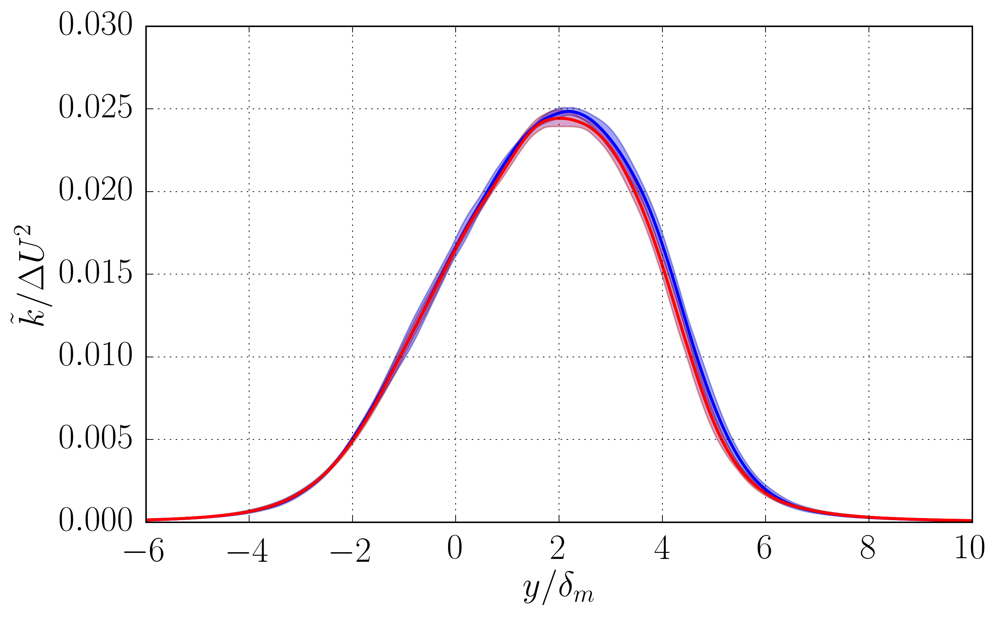

In [382]:
variable = 'k' #any vector variable available
scaling  = 'dm' #can be dw or dm
xlabel =r'$y/\delta_m$'
ylabel =r'$\tilde{k}/\Delta U^2$'
varname ='k'
figname = '%s_%s'%(varname,namecase)
#ylabel = r"y"
#figname = 'rhom_ave.eps'
derivative = False

ycases,fSS,errorSS = getSScase2(p_folders,lcases,variable,scaling,SS1,SS2)
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);plt.ylabel(ylabel,rotation='vertical');
#plt.plot(rhos20pantano[:,0]/conv[1],rhos20pantano[:,1],'b.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos40pantano[:,0]/conv[2],rhos40pantano[:,1],'g.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos80pantano[:,0]/conv[3],rhos80pantano[:,1],'r.',markevery=1,alpha=1.0,ms=8)
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1,1.5])
plt.grid('on')
sigma = 1
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    plt.plot(ycases[icase][0],fSS[icase],l_case_style[icase],lw=2.0)
    plt.fill_between(ycases[icase][0], fSS[icase]-sigma*errorSS[icase], fSS[icase]+sigma*errorSS[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])
if PRINT == True:
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure %s saved!" %pathname
    #Save with STD
    for icase in range(len(lcases)):
        plt.fill_between(ycases[icase][0], (fSS[icase]+errorSS[icase]), (fSS[icase]-errorSS[icase]),color=l_case_color[icase],alpha=0.2)
    pathname = save_folder + figname + 'std' + fformat
    print "figure %s saved!" %pathname
    fig.savefig(pathname,bbox_inches='tight')

39 78
53 74
36 77
64 105
69 100
68 113
figure /share/drive/toni/EFMC11/Relambday_s40.pdf saved!
figure /share/drive/toni/EFMC11/Relambday_s40std.pdf saved!


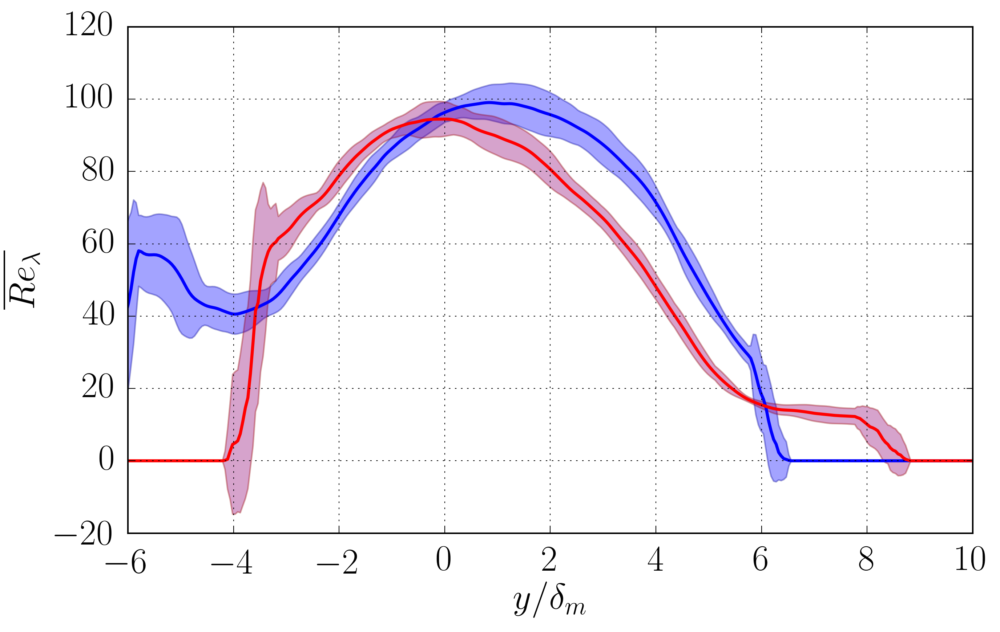

In [457]:
variable = 'Relambday' #any vector variable available
scaling  = 'dm' #can be dw or dm
xlabel =r'$y/\delta_m$'
ylabel =r'$\overline{Re_\lambda}$'
varname ='Relambday'
figname = '%s_%s'%(varname,namecase)
#ylabel = r"y"
#figname = 'rhom_ave.eps'
derivative = False

ycases,fSS,errorSS = getSScase2(p_folders,lcases,variable,scaling,SS1,SS2)
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);plt.ylabel(ylabel,rotation='vertical');
#plt.plot(rhos20pantano[:,0]/conv[1],rhos20pantano[:,1],'b.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos40pantano[:,0]/conv[2],rhos40pantano[:,1],'g.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos80pantano[:,0]/conv[3],rhos80pantano[:,1],'r.',markevery=1,alpha=1.0,ms=8)
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1,1.5])
plt.grid('on')
sigma = 1
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    plt.plot(ycases[icase][0],fSS[icase],l_case_style[icase],lw=2.0)
    plt.fill_between(ycases[icase][0], fSS[icase]-sigma*errorSS[icase], fSS[icase]+sigma*errorSS[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])
if PRINT == True:
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure %s saved!" %pathname
    #Save with STD
    for icase in range(len(lcases)):
        plt.fill_between(ycases[icase][0], (fSS[icase]+errorSS[icase]), (fSS[icase]-errorSS[icase]),color=l_case_color[icase],alpha=0.2)
    pathname = save_folder + figname + 'std' + fformat
    print "figure %s saved!" %pathname
    fig.savefig(pathname,bbox_inches='tight')

## Gradients 

39 78
Taking derivative and multiplying by scaling
53 74
Taking derivative and multiplying by scaling
36 77
Taking derivative and multiplying by scaling
64 105
Taking derivative and multiplying by scaling
69 100
Taking derivative and multiplying by scaling
68 113
Taking derivative and multiplying by scaling
figure /share/drive/toni/EFMC11/dumdy_s40.pdf saved!
figure /share/drive/toni/EFMC11/dumdy_s40std.pdf saved!


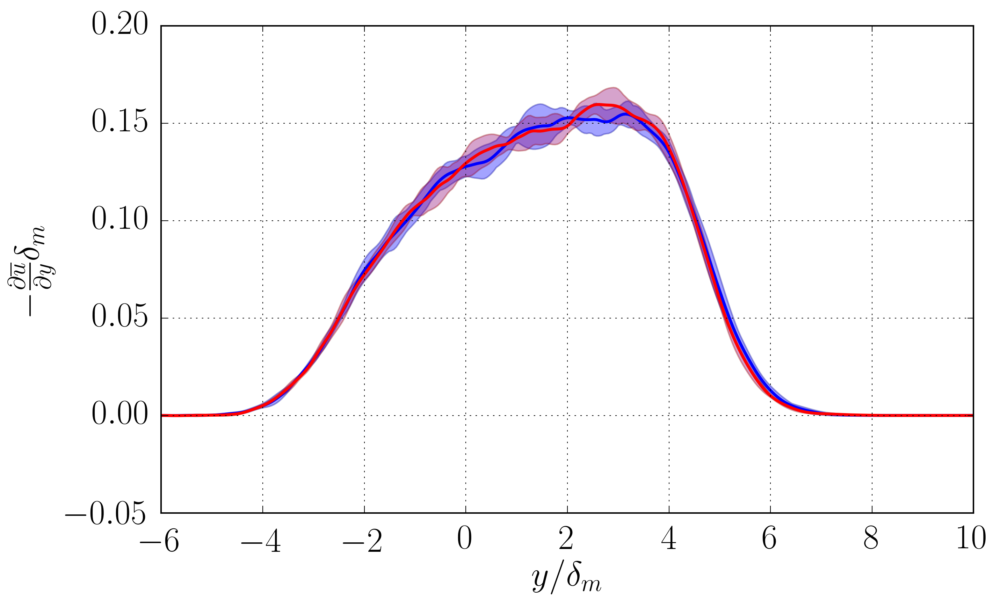

In [379]:
variable = 'um' #any vector variable available
scaling  = 'dm' #can be dw or dm
xlabel =r'$y/\delta_m$'
ylabel =r'$-\frac{\partial \overline{u}}{\partial y} \delta_m $'
varname ='dumdy'
figname = '%s_%s'%(varname,namecase)
#ylabel = r"y"
#figname = 'rhom_ave.eps'
derivative = True
Npoints=500

ycases,fSS,errorSS = getSScase2(p_folders,lcases,variable,scaling,SS1,SS2,Npoints,derivative)
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);plt.ylabel(ylabel,rotation='vertical');
#plt.plot(rhos20pantano[:,0]/conv[1],rhos20pantano[:,1],'b.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos40pantano[:,0]/conv[2],rhos40pantano[:,1],'g.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos80pantano[:,0]/conv[3],rhos80pantano[:,1],'r.',markevery=1,alpha=1.0,ms=8)
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1,1.5])
plt.grid('on')
sigma = 1
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    plt.plot(ycases[icase][0],-fSS[icase],l_case_style[icase],lw=2.0)
    plt.fill_between(ycases[icase][0], -fSS[icase]-sigma*errorSS[icase], -fSS[icase]+sigma*errorSS[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])
if PRINT == True:
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure %s saved!" %pathname
    #Save with STD
    for icase in range(len(lcases)):
        plt.fill_between(ycases[icase][0], (-fSS[icase]+errorSS[icase]), (-fSS[icase]-errorSS[icase]),color=l_case_color[icase],alpha=0.2)
    pathname = save_folder + figname + 'std' + fformat
    print "figure %s saved!" %pathname
    fig.savefig(pathname,bbox_inches='tight')

39 78
Taking derivative and multiplying by scaling
53 74
Taking derivative and multiplying by scaling
36 77
Taking derivative and multiplying by scaling
64 105
Taking derivative and multiplying by scaling
69 100
Taking derivative and multiplying by scaling
68 113
Taking derivative and multiplying by scaling
figure /share/drive/toni/EFMC11/dTmdy_s40.pdf saved!
figure /share/drive/toni/EFMC11/dTmdy_s40std.pdf saved!


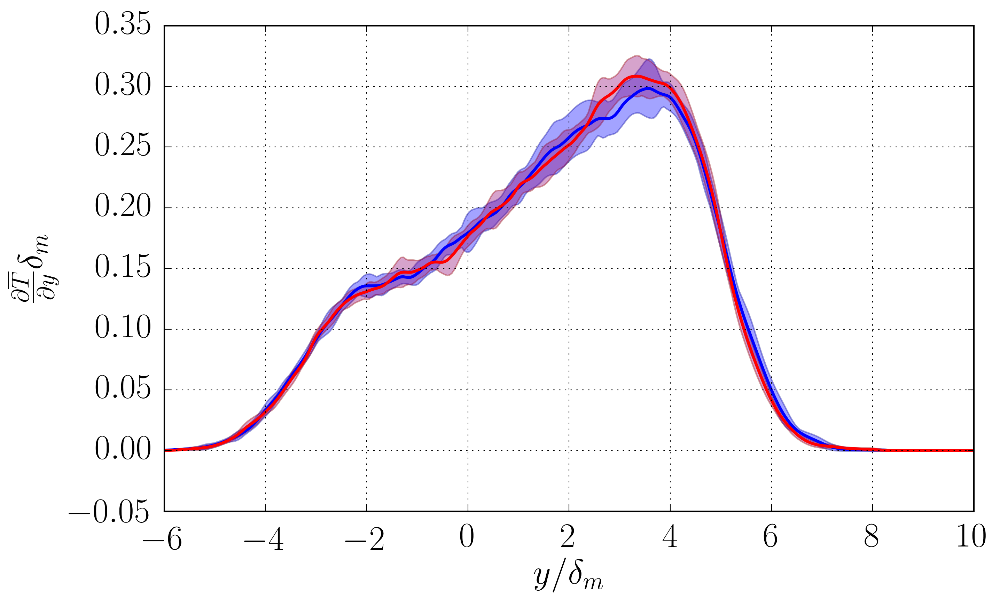

In [380]:
variable = 'Tm' #any vector variable available
scaling  = 'dm' #can be dw or dm
xlabel =r'$y/\delta_m$'
ylabel =r'$\frac{\partial \overline{T}}{\partial y} \delta_m $'
varname ='dTmdy'
figname = '%s_%s'%(varname,namecase)
#ylabel = r"y"
#figname = 'rhom_ave.eps'
derivative = True
Npoints=500

ycases,fSS,errorSS = getSScase2(p_folders,lcases,variable,scaling,SS1,SS2,Npoints,derivative)
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);plt.ylabel(ylabel,rotation='vertical');
#plt.plot(rhos20pantano[:,0]/conv[1],rhos20pantano[:,1],'b.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos40pantano[:,0]/conv[2],rhos40pantano[:,1],'g.',markevery=1,alpha=1.0,ms=8)
#plt.plot(rhos80pantano[:,0]/conv[3],rhos80pantano[:,1],'r.',markevery=1,alpha=1.0,ms=8)
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1,1.5])
plt.grid('on')
sigma = 1
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    plt.plot(ycases[icase][0],fSS[icase],l_case_style[icase],lw=2.0)
    plt.fill_between(ycases[icase][0], fSS[icase]-sigma*errorSS[icase], fSS[icase]+sigma*errorSS[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])
if PRINT == True:
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure %s saved!" %pathname
    #Save with STD
    for icase in range(len(lcases)):
        plt.fill_between(ycases[icase][0], (fSS[icase]+errorSS[icase]), (fSS[icase]-errorSS[icase]),color=l_case_color[icase],alpha=0.2)
    pathname = save_folder + figname + 'std' + fformat
    print "figure %s saved!" %pathname
    fig.savefig(pathname,bbox_inches='tight')

# $Re_\lambda$

## $R_{ij} = \overline{\rho u_i'' u_j''}/\overline{\rho}$ (Reynolds Stresses)

In [794]:
R11_1990=np.loadtxt('/data2/toni/work/db/R11_1990.dat');
R11_1994=np.loadtxt('/data2/toni/work/db/R11_1994.dat');
R11_1971=np.loadtxt('/data2/toni/work/db/R11_1971.dat');
R22_1990=np.loadtxt('/data2/toni/work/db/R22_1990.dat');
R22_1994=np.loadtxt('/data2/toni/work/db/R22_1994.dat');
R22_1971=np.loadtxt('/data2/toni/work/db/R22_1971.dat');
R33_1990=np.loadtxt('/data2/toni/work/db/R22_1990.dat');
R33_1994=np.loadtxt('/data2/toni/work/db/R22_1994.dat');
R33_1971=np.loadtxt('/data2/toni/work/db/R22_1971.dat');
R12_1990=np.loadtxt('/data2/toni/work/db/R12_1990.dat');
R12_1994=np.loadtxt('/data2/toni/work/db/R12_1994.dat');
R12_1971=np.loadtxt('/data2/toni/work/db/R12_1971.dat');
u1u1_1994=np.loadtxt('/data2/toni/work/db/rogermoser1994u1.dat');
u2u2_1994=np.loadtxt('/data2/toni/work/db/rogermoser1994u2.dat');
u3u3_1994=np.loadtxt('/data2/toni/work/db/rogermoser1994u3.dat');
u1u2_1994=np.loadtxt('/data2/toni/work/db/rogermoser1994u12.dat');

# SPECTRA

In [383]:
print SS1,SS2

[450, 520, 455, 490, 510, 510] [650, 625, 650, 650, 620, 670]


In [594]:
St1=np.array([550,550,550,550,550,550])
St2=np.array(St1)
for i in range(len(St1)):
    St2[i]=St1[i]+10.0
print St2

[560 560 560 560 560 560]


In [626]:
def getSpectra(path,nplane,pathSTA,variable,tmin,tmax, sumaxis,scaling = 'dm',Npoints=500):
    """
    Obtain scaled spectra averaged in the given time span
    """
    with h5py.File(pathSTA,"r") as g:
        delta = np.array(g[scaling])
        y=np.array(g['y'])
    planePOS=y[nplane]
    print "y(nplane)=%s" %planePOS
    with h5py.File(path,"r") as f:
        time = np.array(f['time']);
        kx = np.array(f['kx'])
        kz = np.array(f['kz'])
        mx = len(kx)-1;
        mz = len(kz)-1;
        funSPE = np.array(f['SPEC'][1:,variable,1:,:]);
        fun = np.sum(funSPE,axis=sumaxis)
        fun00 = np.array(f['SPEC'][0,variable,0,:])
        #lamxMax=np.pi/kx[1]
        #lamxMin=lamxMax/mx
        #lamzMax=np.pi/kz[1]
        #lamzMin=lamzMax/mz
    #Closing hdf5 files
    it1 = where(time>=tmin)[0][0]
    it2 = where(time>=tmax)[0][0]
    if sumaxis==0:
        kmin = kx[1]*delta[it2]#Kmin scaled with max dm
        kmax = kx[-1]*delta[it1]
        xik = np.logspace(np.log(kmin)/2.0,np.log(kmax)/2.0,Npoints)
        kk = kx
    elif sumaxis==1:
        kmin = kz[1]*delta[it2]#Kmin scaled with max dm
        kmax = kz[-1]*delta[it1]
        xik = np.logspace(np.log(kmin)/2.0,np.log(kmax)/2.0,Npoints)
        kk = kz
    #xik = np.linspace(kmin,kmax,Npoints)
    funintcum = np.zeros(Npoints);
    nacum = 0
    fyjob = [np.zeros(Npoints) for i in range(it2-it1)]
    f00job = [0.0 for i in range(it2-it1)]
    print it1,it2
    print np.shape(fun)
    for itime in range(it1,it2):
        dd = delta[itime]
        if variable==5 or variable==6 or variable==7:
            funint = np.interp(xik,kk[1:]*dd,dd**2*fun[:,itime],left=NaN,right=NaN)
        else:
            funint = np.interp(xik,kk[1:]*dd,fun[:,itime],left=NaN,right=NaN)
        fyjob[itime-it1] = funint
        f00job[itime-it1] = fun00[itime]
    planedeltaEVO = planePOS/delta[it1:it2]

    return xik,np.mean(fyjob,axis=0),np.std(fyjob,axis=0),time[it1:it2],f00job,planedeltaEVO
            

In [627]:
def getSpectracase(p_folders,nplane,p_foldersSTA,lcases,variable,scaling,SS1,SS2,sumaxis,Npoints=1000):
    """
    returns as many vectors as cases wanted to compute.
    Distribution of cases is given in lcases(ex. lcases = [[0,1,2],[3,5]])
    return only one profile per case
    """
    ncases = len(lcases)
    fycases = [[] for i in range(ncases)]
    vt = []
    f00 = []
    ycases = [[] for i in range(ncases)]
    ferrorcases = [[] for i in range(ncases)]
    for icase in range(ncases):
        vpcases = []
        vpcasesSTA=[]
        nacum = 0
        fy = np.zeros(Npoints)
        yf = [[]for i in range(len(lcases[icase]))]
        fy= [[]for i in range(len(lcases[icase]))]
        ferror = [[] for i in range(len(lcases[icase]))]
        nn=len(lcases[icase])
        for ijob in lcases[icase]:
            vpcases    = vpcases    + [p_folders[ijob]]
            vpcasesSTA = vpcasesSTA + [p_foldersSTA[ijob]]
        for path,i in zip(vpcases,range(len(vpcases))):
            ijob = lcases[icase][i]
            pathSTA = vpcasesSTA[i]
            print ijob
            yf[i],fy[i],ferror[i],tt,kk,ydmEVO = getSpectra(path,nplane,pathSTA,variable,SS1[ijob],SS2[ijob],sumaxis,scaling,Npoints)
            vt.append(tt)
            f00.append(kk)
        ycases[icase]=yf
        print "y/delta evolution with time: %s"%(ydmEVO)
        fycases[icase]=np.mean(fy,axis=0)
        ferrorcases[icase]=np.max(ferror,axis=0)
    return ycases,fycases,ferrorcases,vt,f00,ydmEVO

In [628]:
var_ind = {'u':0,'v':1,'w':2,'$uv_{re}$':3,'$uv_{im}$':4,'$\omega_1$':5,'$\omega_2$':6,'$\omega_3$':7,'$\rho u$':8,\
           '$\rho v$':9,'$\rho w$':10,'T':11}
ind_var = {v: k for k, v in var_ind.items()}
var_name = ['u','v','w','$\omega_2$','T']
nvar = len(var_name)+1
print "You will analyse a total of %s variables." %nvar
var_list = []
for j in range(len(var_name)):
    var_list.append(var_ind[var_name[j]])
print var_list

You will analyse a total of 6 variables.
[0, 1, 2, 6, 11]


In [629]:
#Define index of variables SPECTRA
#----------------------------------------
iu = 0 #index of variable
iv = 1
iw = 2
iT = 11
iome1 = 5
iome2 = 6
iome3 = 7

In [630]:
nplane=650
#nplane =-1
if nplane == -1:
    fnplane = 'mid'
else:
    fnplane = "%03d"%nplane
p_folders_spe=len(p_folders)*['k']
for ijob,path in zip(range(len(p_folders)),p_folders):
    print ijob
    p_folders_spe[ijob]=path[0:-5]+fnplane+'.spes'
    print p_folders_spe[ijob]

0
/share/drive/toni/Re160s40/case1/y2/h5.650.spes
1
/share/drive/toni/Re160s40/case2/y2/h5.650.spes
2
/share/drive/toni/Re160s40/case3/y2/h5.650.spes
3
/share/drive/toni/Re160s40/case1/y2/sig07/h5.650.spes
4
/share/drive/toni/Re160s40/case2/y2/sig07/h5.650.spes
5
/share/drive/toni/Re160s40/case3/y2/sig07/h5.650.spes


In [631]:
vstyle=['k^-','b-','g','k*-','b--','g--'];

In [632]:
vstyle=['k^-','b-','g','k*-','b--','g--'];
variable1 = 0 #any vector variable available
variable2 = 1
variable3= 2
scaling  = 'dm' #can be dw or dm
sumaxis=0 #sum kz
xlabel =r'$\lambda_x/ \delta_m$'
ylabel =r'$k_x E_{uu}$'
figname = 'Euu_pl450'
PRINT=False

In [633]:
variable1 = 0 #any vector variable available
variable2 = 1
variable3= 2
scaling  = 'dm' #can be dw or dm
sumaxis=1 #sum for kx, plot in kz
PRINT=True
ycases1,fSS1,errorSS1,vt1,f001,yd = getSpectracase(p_folders_spe,nplane,p_folders,lcases,0,scaling,St1,St2,sumaxis,500);
ycases2,fSS2,errorSS2,vt2,f002,yd = getSpectracase(p_folders_spe,nplane,p_folders,lcases,1,scaling,St1,St2,sumaxis,500);
ycases3,fSS3,errorSS3,vt3,f003,yd = getSpectracase(p_folders_spe,nplane,p_folders,lcases,2,scaling,St1,St2,sumaxis,500);
ycasesT,fSST,errorSST,vtT,f00T,yd = getSpectracase(p_folders_spe,nplane,p_folders,lcases,iT,scaling,St1,St2,sumaxis,500);
ycasesuv1,fSSuv1,erroruv1,vtuv1,f00uv1,yd = getSpectracase(p_folders_spe,nplane,p_folders,lcases,3,scaling,St1,St2,sumaxis,500);
ycasesuv2,fSSuv2,erroruv2,vtuv2,f00uv2,yd = getSpectracase(p_folders_spe,nplane,p_folders,lcases,4,scaling,St1,St2,sumaxis,500);
ycases5,fSS5,errorSS5,vt5,f005,yd = getSpectracase(p_folders_spe,nplane,p_folders,lcases,5,scaling,St1,St2,sumaxis,500);
ycases6,fSS6,errorSS6,vt6,f006,yd = getSpectracase(p_folders_spe,nplane,p_folders,lcases,6,scaling,St1,St2,sumaxis,500);
ycases7,fSS7,errorSS7,vt7,f007,yd = getSpectracase(p_folders_spe,nplane,p_folders,lcases,7,scaling,St1,St2,sumaxis,500);

0
y(nplane)=22.6763642414
58 60
(191, 112)
1
y(nplane)=22.6763642414
59 61
(191, 110)
2
y(nplane)=22.6763642414
56 58
(191, 110)
y/delta evolution with time: [ 3.7616575   3.73412289]
3
y(nplane)=22.6763642414
81 84
(191, 154)
4
y(nplane)=22.6763642414
81 83
(191, 121)
5
y(nplane)=22.6763642414
79 82
(191, 151)
y/delta evolution with time: [ 3.79537722  3.77265747  3.74983867]
0
y(nplane)=22.6763642414
58 60
(191, 112)
1
y(nplane)=22.6763642414
59 61
(191, 110)
2
y(nplane)=22.6763642414
56 58
(191, 110)
y/delta evolution with time: [ 3.7616575   3.73412289]
3
y(nplane)=22.6763642414
81 84
(191, 154)
4
y(nplane)=22.6763642414
81 83
(191, 121)
5
y(nplane)=22.6763642414
79 82
(191, 151)
y/delta evolution with time: [ 3.79537722  3.77265747  3.74983867]
0
y(nplane)=22.6763642414
58 60
(191, 112)
1
y(nplane)=22.6763642414
59 61
(191, 110)
2
y(nplane)=22.6763642414
56 58
(191, 110)
y/delta evolution with time: [ 3.7616575   3.73412289]
3
y(nplane)=22.6763642414
81 84
(191, 154)
4
y(nplane)=2

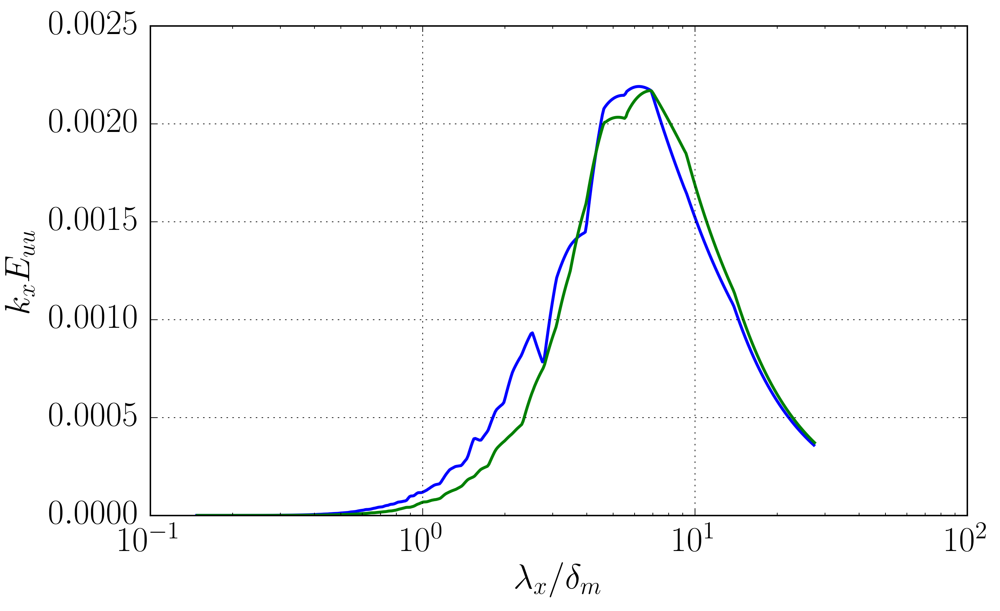

In [470]:
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);plt.ylabel(ylabel);
ax.set_xscale('log')
xlabel =r'$\lambda_z/ \delta_m$'
ylabel =r'$k_z E_{uu}$'
figname = 'Euu'
#plt.xlim([-6,10])
#plt.ylim([0.0,0.010])
plt.grid('on')
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    plt.plot(2*np.pi/ycases1[icase][0],ycases1[icase][0]*fSS1[icase],l_job_style[icase],lw=2.0)
    #plt.fill_between(ycases[icase][0], np.sqrt(fSS[icase]-errorSS[icase]), np.sqrt(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure %s saved!" %pathname
    for icase in range(len(lcases)):
        plt.fill_between(ycases[icase][0], fSS[icase]-errorSS[icase], fSS[icase]+errorSS[icase],color=l_job_color[icase],alpha=0.2)
    pathname = save_folder + figname + 'std' + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure %s saved!" %pathname

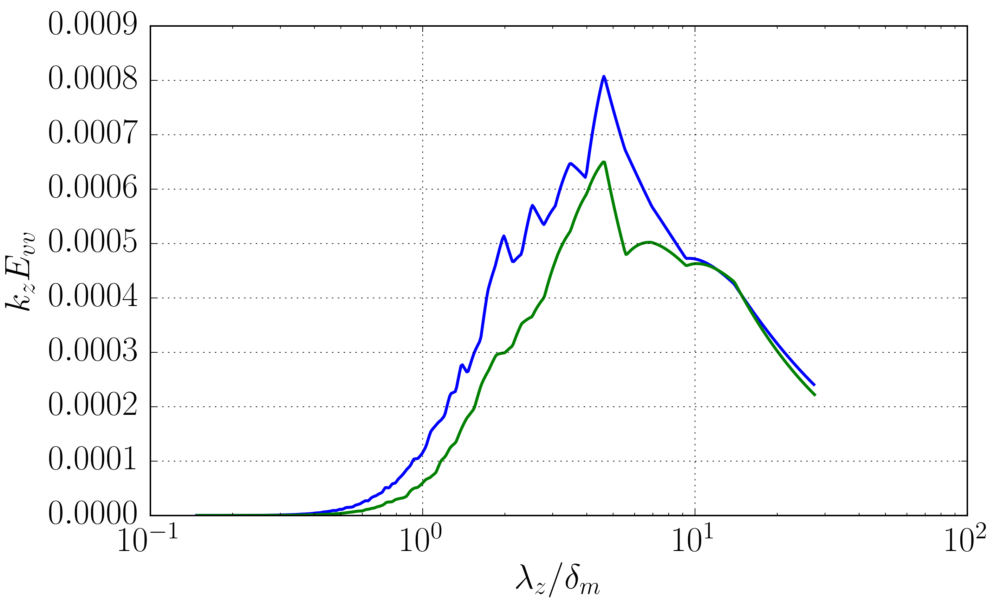

In [471]:
xlabel =r'$\lambda_z/ \delta_m$'
ylabel =r'$k_z E_{vv}$'
figname = 'Evv'
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);plt.ylabel(ylabel);
ax.set_xscale('log')
#plt.xlim([-6,10])
#plt.ylim([0.0,0.010])
plt.grid('on')
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    plt.plot(2*np.pi/ycases2[icase][0],ycases2[icase][0]*fSS2[icase],l_job_style[icase],lw=2.0)
    #plt.fill_between(ycases[icase][0], np.sqrt(fSS[icase]-errorSS[icase]), np.sqrt(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure %s saved!" %pathname
    for icase in range(len(lcases)):
        plt.fill_between(ycases[icase][0], fSS[icase]-errorSS[icase], fSS[icase]+errorSS[icase],color=l_job_color[icase],alpha=0.2)
    pathname = save_folder + figname + 'std' + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure %s saved!" %pathname

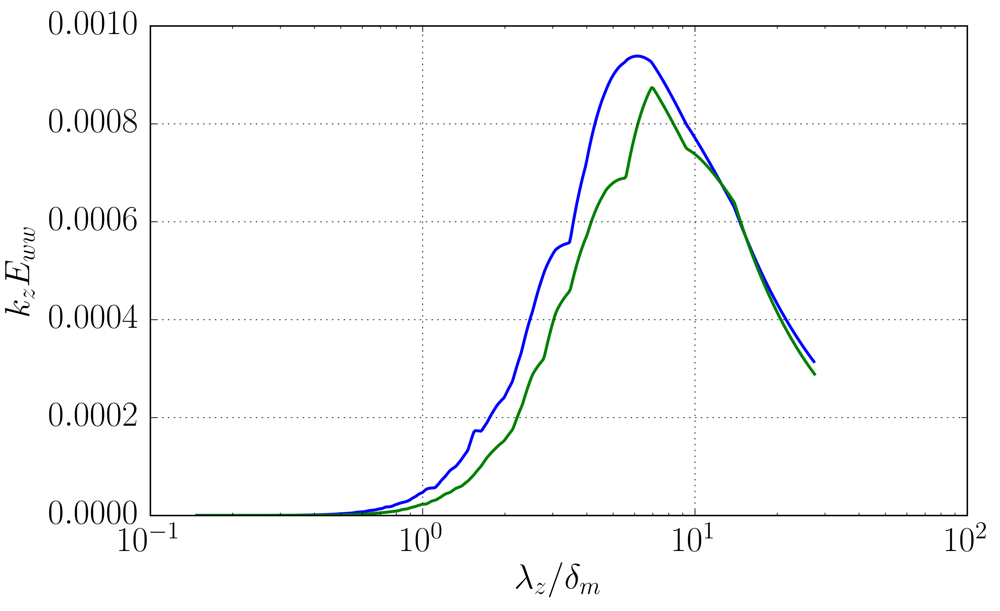

In [472]:
xlabel =r'$\lambda_z/ \delta_m$'
ylabel =r'$k_z E_{ww}$'
figname = 'Eww'
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);plt.ylabel(ylabel);
ax.set_xscale('log')
#plt.xlim([-6,10])
#plt.ylim([0.0,0.010])
plt.grid('on')
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    plt.plot(2*np.pi/ycases3[icase][0],ycases3[icase][0]*fSS3[icase],l_job_style[icase],lw=2.0)
    #plt.fill_between(ycases[icase][0], np.sqrt(fSS[icase]-errorSS[icase]), np.sqrt(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure %s saved!" %pathname
    for icase in range(len(lcases)):
        plt.fill_between(ycases[icase][0], fSS[icase]-errorSS[icase], fSS[icase]+errorSS[icase],color=l_job_color[icase],alpha=0.2)
    pathname = save_folder + figname + 'std' + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure %s saved!" %pathname

In [662]:
print y[650]

22.6763642414


figure saved!
figure /share/drive/toni/EFMC11/Ener_pl650_kz.pdf saved!
figure /share/drive/toni/EFMC11/Ener_pl650_kz.pdf saved!


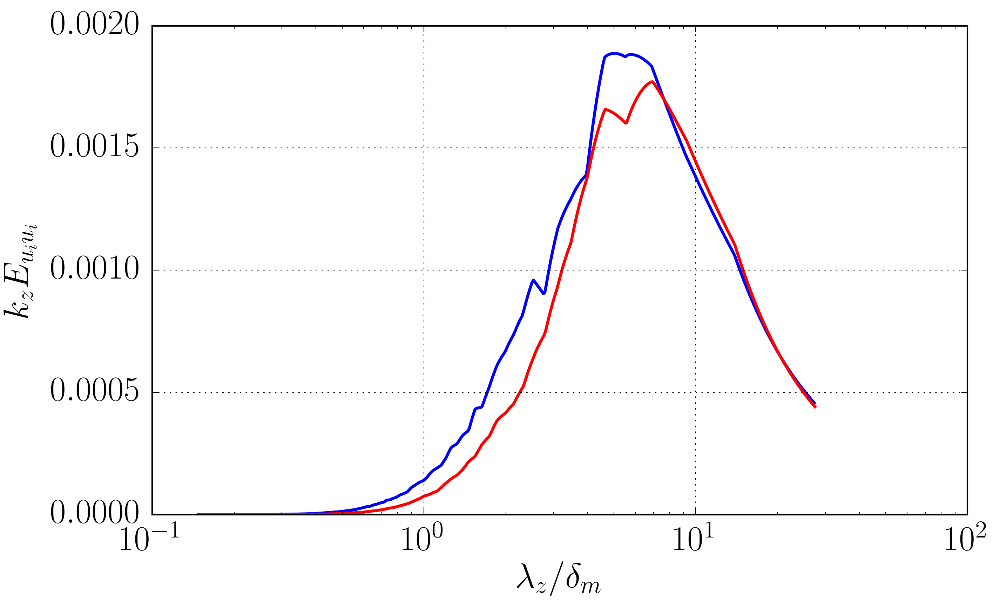

In [610]:
xlabel =r'$\lambda_z/ \delta_m$'
ylabel =r'$k_z E_{u_i u_i}$'
figname = 'Ener_pl650_kz'
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);plt.ylabel(ylabel);
ax.set_xscale('log')
#plt.xlim([-6,10])
#plt.ylim([0.0,0.010])
plt.grid('on')
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    kz=ycases1[icase][0]
    plt.plot(2*np.pi/kz,kz*0.5*(fSS1[icase]+fSS2[icase] \
            +fSS3[icase]),l_case_style[icase],lw=2.0)
    #plt.fill_between(ycases[icase][0], np.sqrt(fSS[icase]-errorSS[icase]), np.sqrt(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure %s saved!" %pathname
    #for icase in range(len(lcases)):
        #plt.fill_between(ycases[icase][0], fSS[icase]-errorSS[icase], fSS[icase]+errorSS[icase],color=l_job_color[icase],alpha=0.2)
    #pathname = save_folder + figname + 'std' + fformat
    #fig.savefig(pathname,bbox_inches='tight')
    print "figure %s saved!" %pathname

figure saved!
figure /share/drive/toni/EFMC11/Enstrophy_pl650_kz.pdf saved!
figure /share/drive/toni/EFMC11/Enstrophy_pl650_kz.pdf saved!


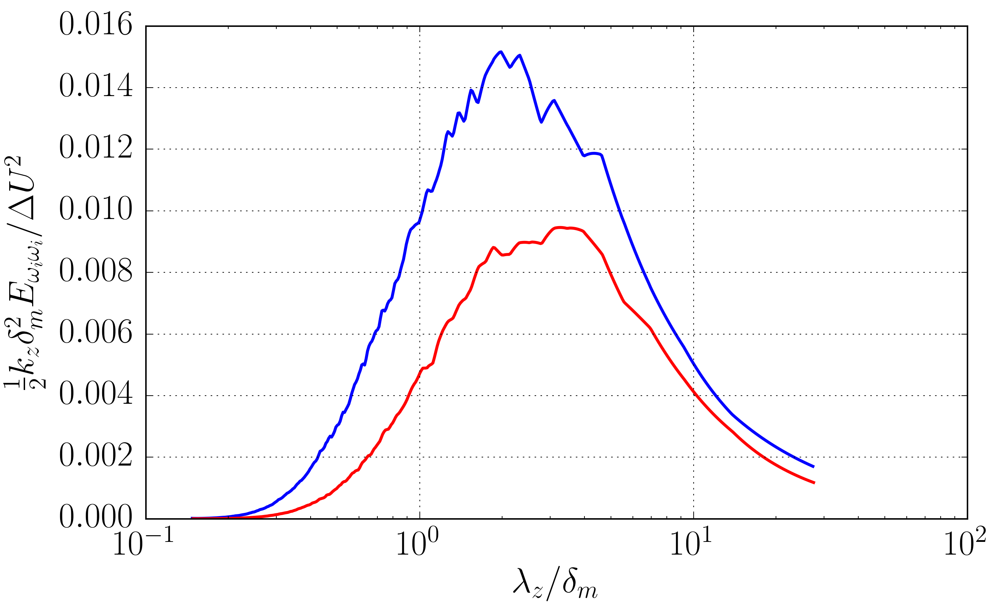

In [635]:
xlabel =r'$\lambda_z/ \delta_m$'
ylabel =r'$ \frac{1}{2} k_z \delta_m^2 E_{\omega_i \omega_i}/\Delta U^2$'
figname = 'Enstrophy_pl650_kz'
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);plt.ylabel(ylabel);
ax.set_xscale('log')
#plt.xlim([-6,10])
#plt.ylim([0.0,0.010])
plt.grid('on')
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    kz=ycases1[icase][0]
    plt.plot(2*np.pi/kz,kz*0.5*(fSS7[icase]+fSS5[icase] \
            +fSS6[icase]),l_case_style[icase],lw=2.0)
    #plt.fill_between(ycases[icase][0], np.sqrt(fSS[icase]-errorSS[icase]), np.sqrt(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure %s saved!" %pathname
    #for icase in range(len(lcases)):
    #    plt.fill_between(ycases[icase][0], fSS[icase]-errorSS[icase], fSS[icase]+errorSS[icase],color=l_job_color[icase],alpha=0.2)
    #pathname = save_folder + figname + 'std' + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure %s saved!" %pathname

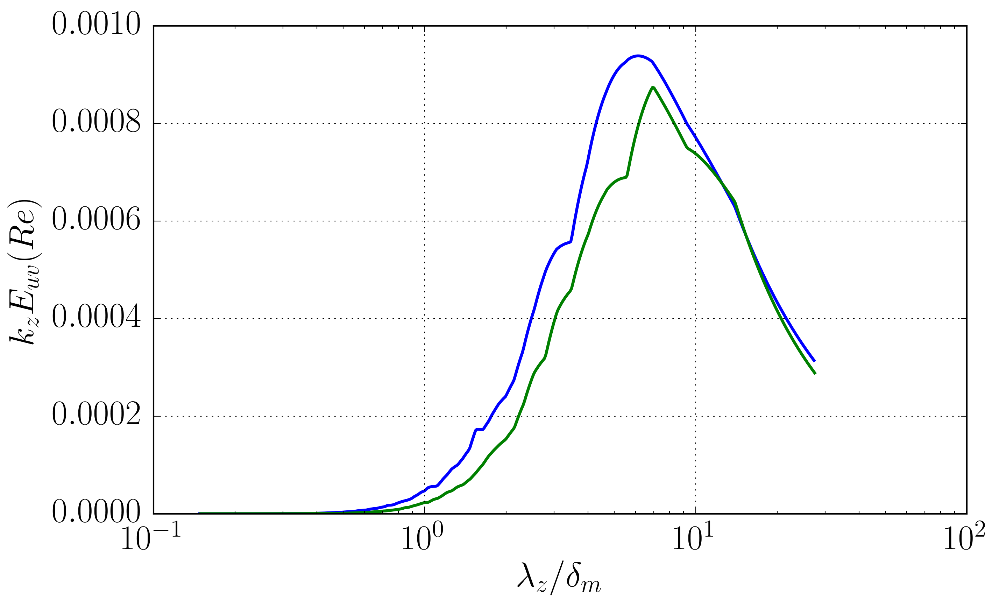

In [475]:
xlabel =r'$\lambda_z/ \delta_m$'
ylabel =r'$k_z E_{uv}(Re)$'
figname = 'uvRe'
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);plt.ylabel(ylabel);
ax.set_xscale('log')
#plt.xlim([-6,10])
#plt.ylim([0.0,0.010])
plt.grid('on')
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    plt.plot(2*np.pi/ycases3[icase][0],ycases3[icase][0]*fSS3[icase],l_job_style[icase],lw=2.0)
    #plt.fill_between(ycases[icase][0], np.sqrt(fSS[icase]-errorSS[icase]), np.sqrt(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure %s saved!" %pathname
    for icase in range(len(lcases)):
        plt.fill_between(ycases[icase][0], fSS[icase]-errorSS[icase], fSS[icase]+errorSS[icase],color=l_job_color[icase],alpha=0.2)
    pathname = save_folder + figname + 'std' + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure %s saved!" %pathname

# Spectra in Kx

In [505]:
print nplane

650


In [485]:
variable1 = 0 #any vector variable available
variable2 = 1
variable3= 2
scaling  = 'dm' #can be dw or dm
sumaxis=0 #sum for kz, plot in kx
PRINT=True
ycases1x,fSS1x,errorSS1x,vt1,f001,yd = getSpectracase(p_folders_spe,nplane,p_folders,lcases,0,scaling,St1,St2,sumaxis,500);
ycases2x,fSS2x,errorSS2x,vt2,f002,yd = getSpectracase(p_folders_spe,nplane,p_folders,lcases,1,scaling,St1,St2,sumaxis,500);
ycases3x,fSS3x,errorSS3x,vt3,f003,yd = getSpectracase(p_folders_spe,nplane,p_folders,lcases,2,scaling,St1,St2,sumaxis,500);
ycasesTx,fSSTx,errorSSTx,vtT,f00T,yd = getSpectracase(p_folders_spe,nplane,p_folders,lcases,iT,scaling,St1,St2,sumaxis,500);
ycasesuv1x,fSSuv1x,erroruv1x,vtuv1,f00uv1,yd = getSpectracase(p_folders_spe,nplane,p_folders,lcases,3,scaling,St1,St2,sumaxis,500);
ycasesuv2x,fSSuv2x,erroruv2x,vtuv2,f00uv2,yd = getSpectracase(p_folders_spe,nplane,p_folders,lcases,4,scaling,St1,St2,sumaxis,500);
ycases5x,fSS5x,errorSS5x,vt5,f005,yd = getSpectracase(p_folders_spe,nplane,p_folders,lcases,5,scaling,St1,St2,sumaxis,500);
ycases6x,fSS6x,errorSS6x,vt6,f006,yd = getSpectracase(p_folders_spe,nplane,p_folders,lcases,6,scaling,St1,St2,sumaxis,500);
ycases7x,fSS7x,errorSS7x,vt7,f007,yd = getSpectracase(p_folders_spe,nplane,p_folders,lcases,7,scaling,St1,St2,sumaxis,500);

0
y(nplane)=22.6763642414
58 60
(511, 112)
1
y(nplane)=22.6763642414
59 61
(511, 110)
2
y(nplane)=22.6763642414
56 58
(511, 110)
y/delta evolution with time: [ 3.7616575   3.73412289]
3
y(nplane)=22.6763642414
81 84
(511, 154)
4
y(nplane)=22.6763642414
81 83
(511, 121)
5
y(nplane)=22.6763642414
79 82
(511, 151)
y/delta evolution with time: [ 3.79537722  3.77265747  3.74983867]
0
y(nplane)=22.6763642414
58 60
(511, 112)
1
y(nplane)=22.6763642414
59 61
(511, 110)
2
y(nplane)=22.6763642414
56 58
(511, 110)
y/delta evolution with time: [ 3.7616575   3.73412289]
3
y(nplane)=22.6763642414
81 84
(511, 154)
4
y(nplane)=22.6763642414
81 83
(511, 121)
5
y(nplane)=22.6763642414
79 82
(511, 151)
y/delta evolution with time: [ 3.79537722  3.77265747  3.74983867]
0
y(nplane)=22.6763642414
58 60
(511, 112)
1
y(nplane)=22.6763642414
59 61
(511, 110)
2
y(nplane)=22.6763642414
56 58
(511, 110)
y/delta evolution with time: [ 3.7616575   3.73412289]
3
y(nplane)=22.6763642414
81 84
(511, 154)
4
y(nplane)=2

figure saved!
figure /share/drive/toni/EFMC11/Enerx.pdf saved!


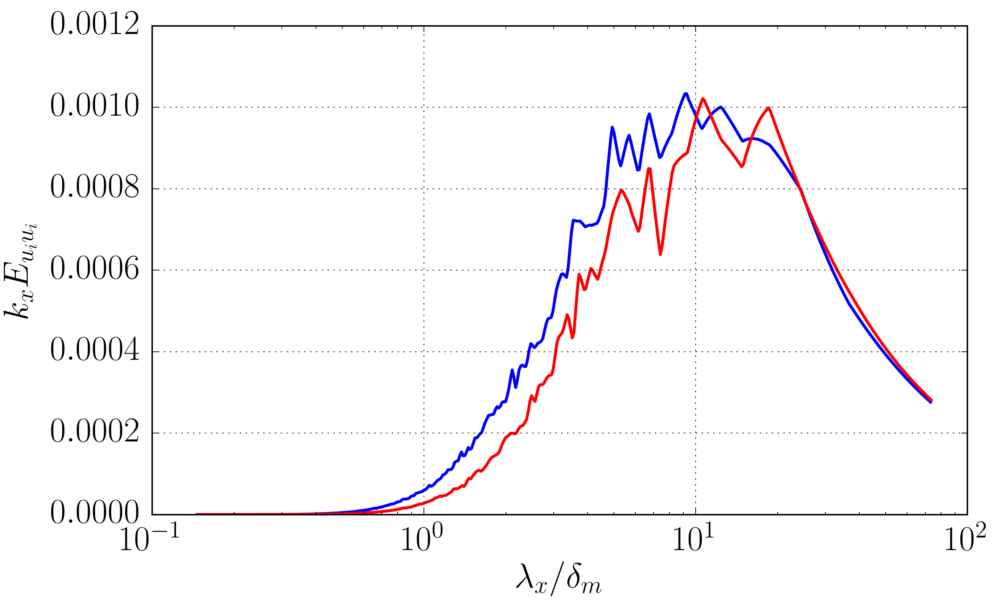

In [571]:
xlabel =r'$\lambda_x/ \delta_m$'
ylabel =r'$k_x E_{u_i u_i}$'
figname = 'Enerx'
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);plt.ylabel(ylabel);
ax.set_xscale('log')
#plt.xlim([-6,10])
#plt.ylim([0.0,0.010])
plt.grid('on')

for icase in range(len(lcases)):
    kx = ycases1x[icase][0]
    #print ycases[icase], fSS[icase]
    plt.plot(2*np.pi/ycases1x[icase][0],kx*(fSS1x[icase]+fSS2x[icase] \
            +fSS3x[icase]),l_case_style[icase],lw=2.0)
#    plt.plot(2*np.pi/ycases3[icase][0],ycases1[icase][0]*(fSS1[icase]+fSS2[icase] \
#            +fSS3[icase]),l_case_style[icase],lw=2.0,ls='dashed')
    #plt.fill_between(ycases[icase][0], np.sqrt(fSS[icase]-errorSS[icase]), np.sqrt(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure %s saved!" %pathname
    #for icase in range(len(lcases)):
    #    plt.fill_between(ycases1x[icase][0], fSSx[icase]-errorSSx[icase], fSSx[icase]+errorSSx[icase],color=l_job_color[icase],alpha=0.2)
    #pathname = save_folder + figname + 'std' + fformat
    #fig.savefig(pathname,bbox_inches='tight')
    #print "figure %s saved!" %pathname

figure saved!
figure /share/drive/toni/EFMC11/Enstrox.pdf saved!


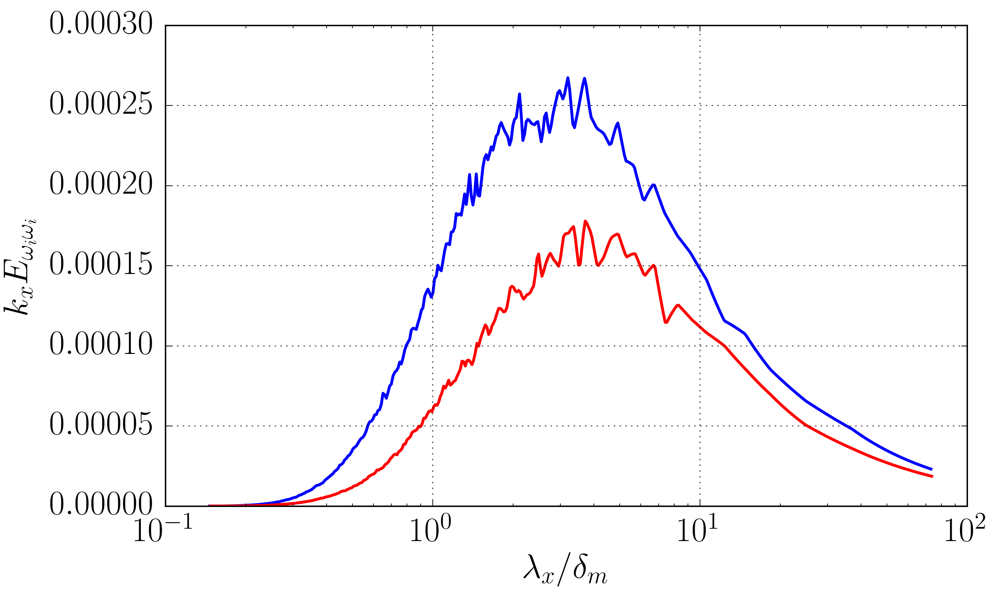

In [572]:
xlabel =r'$\lambda_x/ \delta_m$'
ylabel =r'$k_x E_{\omega_i \omega_i}$'
figname = 'Enstrox'
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);plt.ylabel(ylabel);
ax.set_xscale('log')
#plt.xlim([-6,10])
#plt.ylim([0.0,0.010])
plt.grid('on')

for icase in range(len(lcases)):
    kx = ycases1x[icase][0]
    #print ycases[icase], fSS[icase]
    plt.plot(2*np.pi/ycases1x[icase][0],kx*(fSS5x[icase]+fSS6x[icase] \
            +fSS7x[icase]),l_case_style[icase],lw=2.0)
#    plt.plot(2*np.pi/ycases3[icase][0],ycases1[icase][0]*(fSS1[icase]+fSS2[icase] \
#            +fSS3[icase]),l_case_style[icase],lw=2.0,ls='dashed')
    #plt.fill_between(ycases[icase][0], np.sqrt(fSS[icase]-errorSS[icase]), np.sqrt(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure %s saved!" %pathname
    #for icase in range(len(lcases)):
    #    plt.fill_between(ycases1x[icase][0], fSSx[icase]-errorSSx[icase], fSSx[icase]+errorSSx[icase],color=l_job_color[icase],alpha=0.2)
    #pathname = save_folder + figname + 'std' + fformat
    #fig.savefig(pathname,bbox_inches='tight')
    #print "figure %s saved!" %pathname

figure saved!
figure /share/drive/toni/EFMC11/Enstroxz.pdf saved!


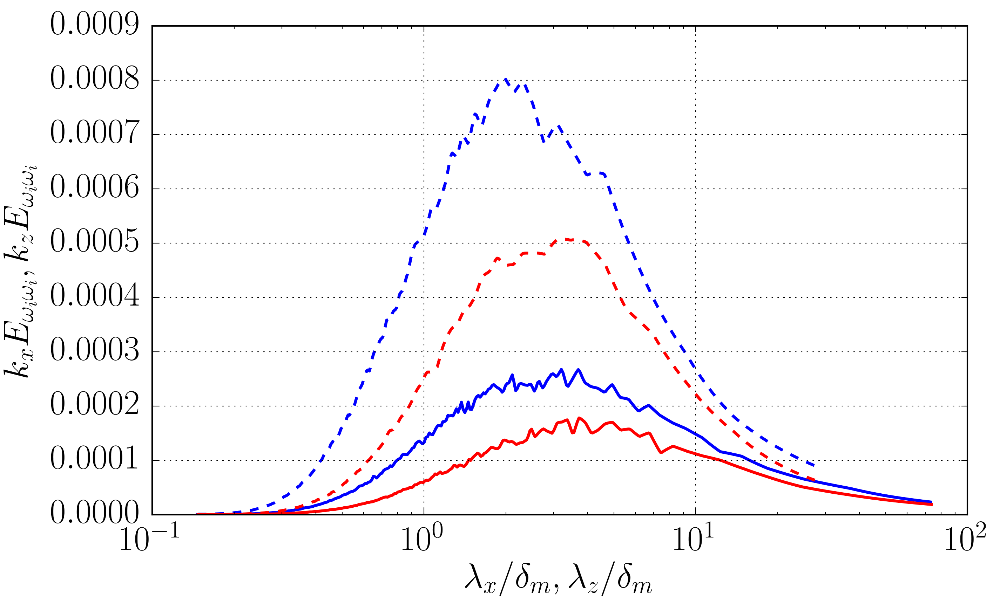

In [507]:
xlabel =r'$\lambda_x/ \delta_m,\lambda_z/ \delta_m$$'
ylabel =r'$k_x E_{\omega_i \omega_i},k_z E_{\omega_i \omega_i}$'
figname = 'Enstroxz'
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);plt.ylabel(ylabel);
ax.set_xscale('log')
#plt.xlim([-6,10])
#plt.ylim([0.0,0.010])
plt.grid('on')
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    plt.plot(2*np.pi/ycases5x[icase][0],ycases5x[icase][0]*fSS5x[icase]+ycases6x[icase][0]*fSS6x[icase] \
            +ycases7x[icase][0]*fSS7x[icase],l_case_style[icase],lw=2.0)
    plt.plot(2*np.pi/ycases5[icase][0],ycases5[icase][0]*fSS5[icase]+ycases6[icase][0]*fSS6[icase] \
            +ycases7[icase][0]*fSS7[icase],l_case_style[icase],lw=2.0,ls='dashed')
    #plt.fill_between(ycases[icase][0], np.sqrt(fSS[icase]-errorSS[icase]), np.sqrt(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure %s saved!" %pathname
    #for icase in range(len(lcases)):
    #    plt.fill_between(ycases1x[icase][0], fSSx[icase]-errorSSx[icase], fSSx[icase]+errorSSx[icase],color=l_job_color[icase],alpha=0.2)
    #pathname = save_folder + figname + 'std' + fformat
    #fig.savefig(pathname,bbox_inches='tight')
    #print "figure %s saved!" %pathname

figure saved!
figure /share/drive/toni/EFMC11/EnerTT.pdf saved!


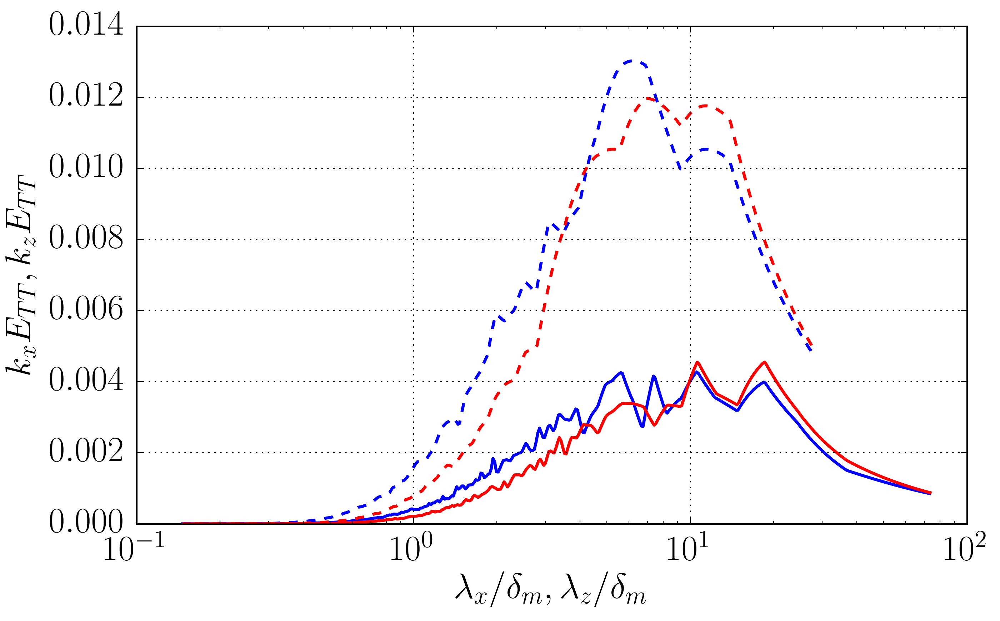

In [508]:
xlabel =r'$\lambda_x/ \delta_m,\lambda_z/ \delta_m$$'
ylabel =r'$k_x E_{T T},k_z E_{T T}$'
figname = 'EnerTT'
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);plt.ylabel(ylabel);
ax.set_xscale('log')
#plt.xlim([-6,10])
#plt.ylim([0.0,0.010])
plt.grid('on')
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    plt.plot(2*np.pi/ycasesTx[icase][0],ycasesTx[icase][0]*fSSTx[icase], \
            l_case_style[icase],lw=2.0)
    plt.plot(2*np.pi/ycasesT[icase][0],ycasesT[icase][0]*fSST[icase], \
            l_case_style[icase],lw=2.0,ls='dashed')
    #plt.fill_between(ycases[icase][0], np.sqrt(fSS[icase]-errorSS[icase]), np.sqrt(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure %s saved!" %pathname
    #for icase in range(len(lcases)):
    #    plt.fill_between(ycases1x[icase][0], fSSx[icase]-errorSSx[icase], fSSx[icase]+errorSSx[icase],color=l_job_color[icase],alpha=0.2)
    #pathname = save_folder + figname + 'std' + fformat
    #fig.savefig(pathname,bbox_inches='tight')
    #print "figure %s saved!" %pathname

In [490]:
ycases7x[1][0]*fSS7x[1]

array([             nan,              nan,              nan,
                    nan,              nan,              nan,
                    nan,              nan,              nan,
                    nan,              nan,              nan,
                    nan,              nan,              nan,
                    nan,              nan,              nan,
                    nan,              nan,              nan,
                    nan,              nan,              nan,
                    nan,              nan,   5.91632271e-06,
         5.99421122e-06,   6.07300358e-06,   6.15270641e-06,
         6.23332620e-06,   6.31486938e-06,   6.39734225e-06,
         6.48075100e-06,   6.56510169e-06,   6.65040027e-06,
         6.73665254e-06,   6.82386416e-06,   6.91204063e-06,
         7.00118728e-06,   7.09130928e-06,   7.18241161e-06,
         7.27449906e-06,   7.36757621e-06,   7.46164743e-06,
         7.55671686e-06,   7.65278840e-06,   7.74986571e-06,
         7.84795218e-06,

In [497]:
print np.shape(ycases7x[0][0])
print (fSS7x[0]*ycases7x[0][0])[200]
print np.multiply(fSS7x[0],ycases7x[0][0])[200]

(500,)
5.21076213084e-05
5.21076213084e-05


# Reading multiplane spectra

Prepare reading planes

In [488]:
fplane='mid'
vplanes=[]
nmaxplanes=[]
for ijob,path in zip(range(len(p_folders)),p_folders):
    print ijob
    p_folders_spe[ijob]=path[0:-5]+fnplane+'.spes'
    print p_folders_spe[ijob]
    path = p_folders_spe[ijob]
    with h5py.File(path,"r") as f:
        v=np.array(f['jsp'])
        vplanes.append(v)
        nmaxplanes.append(len(v))
print vplanes
print nmaxplanes

0
/share/drive/toni/Re160s40/case1/y2/h5.mid.spes
1
/share/drive/toni/Re160s40/case2/y2/h5.mid.spes
2
/share/drive/toni/Re160s40/case3/y2/h5.mid.spes
3
/share/drive/toni/Re160s40/case1/y2/sig07/h5.mid.spes
4
/share/drive/toni/Re160s40/case2/y2/sig07/h5.mid.spes
5
/share/drive/toni/Re160s40/case3/y2/sig07/h5.mid.spes
[array([350, 375, 400, 425, 450, 475, 500, 525, 550, 575, 600, 625, 650,
       675, 700, 725, 750, 775, 800, 825, 850, 551], dtype=uint32), array([350, 375, 400, 425, 450, 475, 500, 525, 550, 575, 600, 625, 650,
       675, 700, 725, 750, 775, 800, 825, 850, 551], dtype=uint32), array([350, 375, 400, 425, 450, 475, 500, 525, 550, 575, 600, 625, 650,
       675, 700, 725, 750, 775, 800, 825, 850, 551], dtype=uint32), array([350, 375, 400, 425, 450, 475, 500, 525, 550, 575, 600, 625, 650,
       675, 700, 725, 750, 775, 800, 825, 850, 551], dtype=uint32), array([350, 375, 400, 425, 450, 475, 500, 525, 550, 575, 600, 625, 650,
       675, 700, 725, 750, 775, 800, 825, 850, 55

In [537]:
scaling = 'dm'
p_folders_spe=[['']*nmaxplanes[ijob] for ijob in range(len(p_folders))]
for ijob,path in zip(range(len(p_folders)),p_folders):
    with h5py.File(path,"r") as g:
        time=np.array(g['time'])
        dd=np.array(g[scaling])
    for nplane,jj in zip(vplanes[ijob],range(nmaxplanes[ijob])):
        if jj==nmaxplanes[ijob]-1: #Lastplane
            fnplane='mid'
        else:
            fnplane="%03d"%nplane
        p_folders_spe[ijob][jj]=path[0:-5]+fnplane+'.spes'
        #print "Reading spe file: %s" %(pathSPE)

In [605]:
sumaxis=1 #sum x
nplane = 0
p_folders_plane=['' for i in range(njobs)]
for ijob in range(njobs):
    p_folders_plane[ijob]=p_folders_spe[ijob][nplane]

In [614]:
scaling='dm'
sumaxis=1
variable=0
ijob = 0
tmin=450.0
pathSTA = p_folders[ijob]
ydelta_t=[[] for i in range(nmaxplanes[ijob])]
funSPE=[[] for i in range(nmaxplanes[ijob])]
for nplane in range(nmaxplanes[ijob]):
    with h5py.File(pathSTA,"r") as g:
        delta = np.array(g[scaling])
        y = np.array(g['y'])
    path = p_folders_spe[ijob][nplane]
    print "opening path= %s" %path
    with h5py.File(path,"r") as f:
        time = np.array(f['time']);
        itime = where(time>=tmin)[0][0]
        ydelta_t[nplane] = y[vplanes[ijob][nplane]]/delta[itime]
        kx = np.array(f['kx'])
        kz = np.array(f['kz'])
        mx = len(kx)-1;
        mz = len(kz)-1;
        kk = np.array(f['SPEC'][1:,variable,1:,itime])
        maxE=(np.sum(kk,axis=sumaxis)*kz[1:]).max()
        #maxE=1.0
        print "Max E scaled = %s" %maxE
        funSPE[nplane] = np.sum(kk,axis=sumaxis)*kz[1:]/maxE
print np.shape(funSPE)

opening path= /share/drive/toni/Re160s40/case1/y2/h5.350.spes
Max E scaled = 6.72883461424e-08
opening path= /share/drive/toni/Re160s40/case1/y2/h5.375.spes
Max E scaled = 1.46775126749e-07
opening path= /share/drive/toni/Re160s40/case1/y2/h5.400.spes
Max E scaled = 3.38598947715e-07
opening path= /share/drive/toni/Re160s40/case1/y2/h5.425.spes
Max E scaled = 8.6761759218e-07
opening path= /share/drive/toni/Re160s40/case1/y2/h5.450.spes
Max E scaled = 2.47453683517e-06
opening path= /share/drive/toni/Re160s40/case1/y2/h5.475.spes
Max E scaled = 2.05560743788e-05
opening path= /share/drive/toni/Re160s40/case1/y2/h5.500.spes
Max E scaled = 6.19151720493e-05
opening path= /share/drive/toni/Re160s40/case1/y2/h5.525.spes
Max E scaled = 0.000192195275725
opening path= /share/drive/toni/Re160s40/case1/y2/h5.550.spes
Max E scaled = 0.000359345233913
opening path= /share/drive/toni/Re160s40/case1/y2/h5.575.spes
Max E scaled = 0.000464825824425
opening path= /share/drive/toni/Re160s40/case1/y2/h

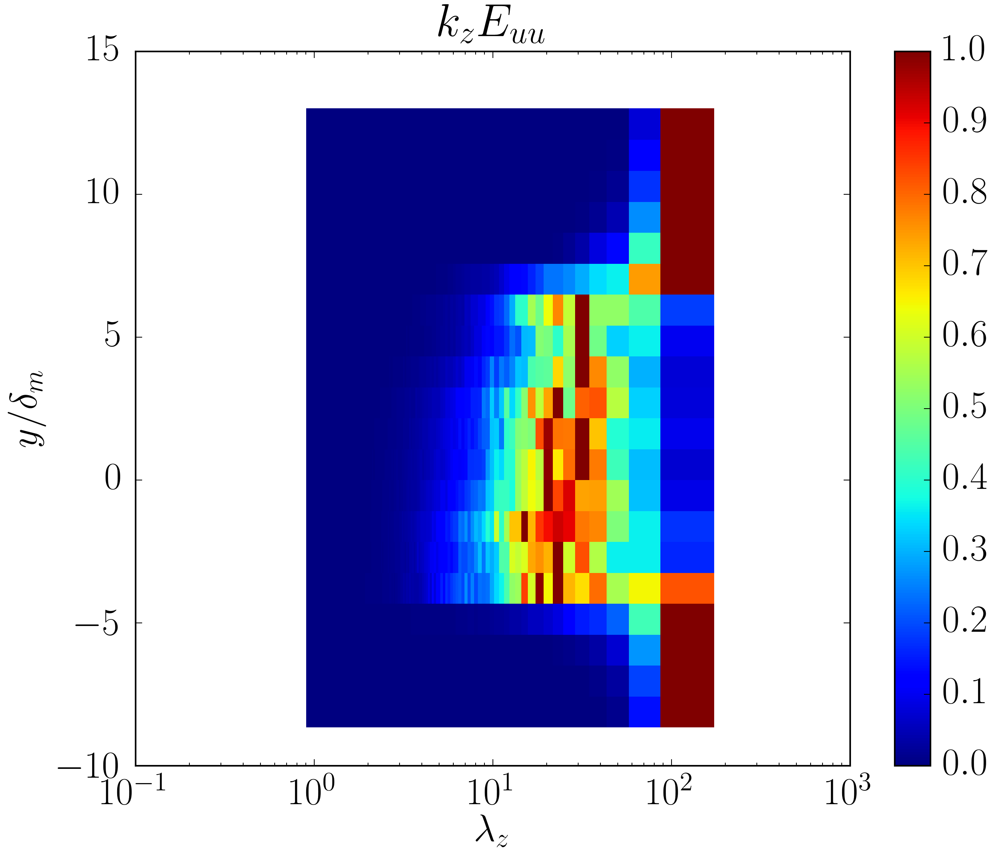

In [615]:
plt.pcolor(2*np.pi/kz[1:],ydelta_t[:-1],np.array(funSPE[:-1]))
plt.xscale('log')
plt.xlabel(r'$\lambda_z$')
plt.ylabel(r'$y/\delta_m$')
plt.title(r'$k_z E_{uu}$')
plt.colorbar()

In [612]:
scaling='dm'
sumaxis=1
variable=0
ijob = 3
tmin=450.0
pathSTA = p_folders[ijob]
ydelta_t=[[] for i in range(nmaxplanes[ijob])]
funSPE=[[] for i in range(nmaxplanes[ijob])]
for nplane in range(nmaxplanes[ijob]):
    with h5py.File(pathSTA,"r") as g:
        delta = np.array(g[scaling])
        y = np.array(g['y'])
    path = p_folders_spe[ijob][nplane]
    print "opening path= %s" %path
    with h5py.File(path,"r") as f:
        time = np.array(f['time']);
        itime = where(time>=tmin)[0][0]
        ydelta_t[nplane] = y[vplanes[ijob][nplane]]/delta[itime]
        kx = np.array(f['kx'])
        kz = np.array(f['kz'])
        mx = len(kx)-1;
        mz = len(kz)-1;
        kk = np.array(f['SPEC'][1:,variable,1:,itime])
        maxE=(np.sum(kk,axis=sumaxis)*kz[1:]).max()
        #maxE=1.0
        print "Max E scaled = %s" %maxE
        funSPE[nplane] = np.sum(kk,axis=sumaxis)*kz[1:]/maxE
print np.shape(funSPE)

opening path= /share/drive/toni/Re160s40/case1/y2/sig07/h5.350.spes
Max E scaled = 6.4125378971e-08
opening path= /share/drive/toni/Re160s40/case1/y2/sig07/h5.375.spes
Max E scaled = 1.39794655996e-07
opening path= /share/drive/toni/Re160s40/case1/y2/sig07/h5.400.spes
Max E scaled = 3.21816844967e-07
opening path= /share/drive/toni/Re160s40/case1/y2/sig07/h5.425.spes
Max E scaled = 8.18015153396e-07
opening path= /share/drive/toni/Re160s40/case1/y2/sig07/h5.450.spes
Max E scaled = 2.34891496324e-06
opening path= /share/drive/toni/Re160s40/case1/y2/sig07/h5.475.spes
Max E scaled = 1.90723242997e-05
opening path= /share/drive/toni/Re160s40/case1/y2/sig07/h5.500.spes
Max E scaled = 5.945209315e-05
opening path= /share/drive/toni/Re160s40/case1/y2/sig07/h5.525.spes
Max E scaled = 0.00017955557082
opening path= /share/drive/toni/Re160s40/case1/y2/sig07/h5.550.spes
Max E scaled = 0.000376811568258
opening path= /share/drive/toni/Re160s40/case1/y2/sig07/h5.575.spes
Max E scaled = 0.0004410145

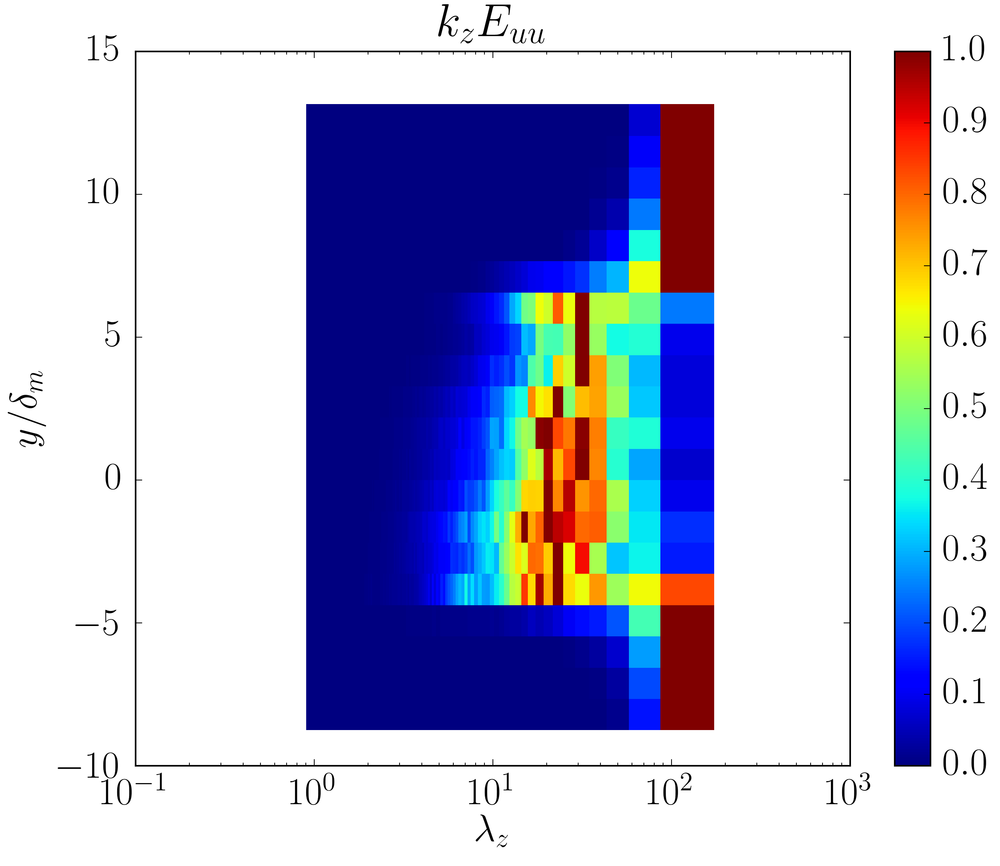

In [613]:
plt.pcolor(2*np.pi/kz[1:],ydelta_t[:-1],np.array(funSPE[:-1]))
plt.xscale('log')
plt.xlabel(r'$\lambda_z$')
plt.ylabel(r'$y/\delta_m$')
plt.title(r'$k_z E_{uu}$')
plt.colorbar()

In [599]:
print ydelta_t

[-8.0034615547022536, -7.0028663793320298, -6.0024004072683459, -5.0019809624057965, -4.0015782713047576, -3.0011816128475561, -2.0007871265884147, -1.0003934224789162, 5.0154290026027713e-15, 1.0003934224789062, 2.0007871265883947, 3.0011816128475615, 4.0015782713047825, 5.001980962405792, 6.0024004072683406, 7.0028663793320343, 8.0034615547022341, 9.0044154560775365, 10.006364847824191, 11.011073006079519, 12.023397452100753, 0.040015734279060432]


In [616]:
print ydelta_t[12]

4.32658405219


In [618]:
print vplanes[0][12]

650
